In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Machine Learning imports
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering 
from sklearn.mixture import GaussianMixture as GMM
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import manifold, datasets 

from scipy import ndimage 
from scipy.cluster import hierarchy 
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial import distance_matrix 
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

# plot imports
%matplotlib inline
import matplotlib.pyplot as plt 
import matplotlib.ticker as ticker
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Ellipse
from matplotlib.ticker import NullFormatter
from matplotlib import rcParams
import seaborn as sns

import itertools
from itertools import cycle

import folium
from folium import plugins
from folium.plugins import FastMarkerCluster

# GeoCoders imports
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values (OpenStreetMaps)
import geocoder

# Polygon Generation and Calculation
import geopandas as gpd
from shapely.geometry import Polygon
import concave_hull
# HTML and JSON scraping
from bs4 import BeautifulSoup as bs
import requests
import json
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

#### Import display to print DataFrames prettyfied with HTML,
#### to print multiple DataFrames sequentially via a function.
#### the HTML() function allows you to MarkUp your accompanying texts.
#### print with display(HTML('Hello World!'), some_df). 
from IPython.display import display, HTML

#### Retrieve the largest higher educational locations in San Francisco

In [2]:
url = r'http://www.city-data.com/city/San-Francisco-California.html'
req = requests.get(url)
page = bs(req.content,'lxml')

In [3]:
div_selection = page.find(class_='schools').find('ul', class_='style1')
div_selection = div_selection.find_all('li') 
filtered_elements = []

for element in div_selection:
    name = element.text.split('  ')[0]
    address = element.text.split(':')[2].split(';')[0]
    ft_enrolment = element.text.split(':')[1].split(';')[0]
    pub_priv_profit = element.text.split(';')[2]
    filtered_elements.append([name,address,ft_enrolment,pub_priv_profit])

#### create a dataframe from the scraped items in listform, later to be appended with location data.

In [4]:
df_uni = pd.DataFrame(filtered_elements, columns=['name','address','ft_enrolment','pub_priv_profit'])
df_uni

,name,address,ft_enrolment,pub_priv_profit
0,San Francisco State University,1600 Holloway Ave,"24,644",Public
1,City College of San Francisco,50 Phelan Ave,"17,569",Public
2,Academy of Art University,79 New Montgomery,"12,352","Private, for-profit"
3,University of San Francisco,2130 Fulton St,"9,190","Private, not-for-profit"
4,Golden Gate University-San Francisco,536 Mission Street,"1,816","Private, not-for-profit"
5,California College of the Arts,1111 Eighth Street,"1,738","Private, not-for-profit"
6,University of California-San Francisco,500 Parnassus Ave,"1,450",Public
7,The Art Institute of California-Argosy Univers...,1170 Market St,"1,341","Private, for-profit"
8,Heald College-San Francisco,875 Howard Street Suite 100,"1,230","Private, for-profit"
9,California Institute of Integral Studies,1453 Mission Street,"1,070","Private, not-for-profit"


In [5]:
# retrieve Latitude and Longitude with ArcGis plugin from geocoder

def getLatLong(row):
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, San Francisco, California'.format(row)
    
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('IndexError Caught')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    
    return [latitude, longitude]

In [6]:
# retrieve 1 result for testing.
address_query = df_uni.loc[0,'address']
getLatLong(address_query)

[37.7208542626991, -122.47708049999999]

In [7]:
coords_list = df_uni['address'].apply(getLatLong).tolist()
df_uni[['latitude','longitude']] = pd.DataFrame(coords_list, columns=['latitude','longitude'])
df_uni

,name,address,ft_enrolment,pub_priv_profit,latitude,longitude
0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.477080
1,City College of San Francisco,50 Phelan Ave,"17,569",Public,37.723931,-122.452299
2,Academy of Art University,79 New Montgomery,"12,352","Private, for-profit",37.787832,-122.400846
3,University of San Francisco,2130 Fulton St,"9,190","Private, not-for-profit",37.775395,-122.449914
4,Golden Gate University-San Francisco,536 Mission Street,"1,816","Private, not-for-profit",37.789008,-122.398582
5,California College of the Arts,1111 Eighth Street,"1,738","Private, not-for-profit",37.767253,-122.400251
6,University of California-San Francisco,500 Parnassus Ave,"1,450",Public,37.763511,-122.458103
7,The Art Institute of California-Argosy Univers...,1170 Market St,"1,341","Private, for-profit",37.779322,-122.414020
8,Heald College-San Francisco,875 Howard Street Suite 100,"1,230","Private, for-profit",37.781893,-122.404396
9,California Institute of Integral Studies,1453 Mission Street,"1,070","Private, not-for-profit",37.774792,-122.416473


## Show education locations on map

In [8]:
# set the San Francisco location
address = 'San Francisco, California'

geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of San Francisco are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of San Francisco are 37.7792808, -122.4192363.


In [9]:
# create map of San Francisco using latitude and longitude values
map_sf = folium.Map(location=[latitude, longitude], zoom_start=12.4)

# add markers to map
for lat, lng, name, enrol, pub_priv in zip(df_uni['latitude'],df_uni['longitude']\
                                           ,df_uni['name'],df_uni['ft_enrolment'],df_uni['pub_priv_profit']):
    label = '{}, {}'.format(name, enrol, pub_priv)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_sf)  
    
map_sf

# Retrieve crime data set of 01-januari-2018 until 18-december-2018
- clean data and drop unwanted columns, before making subsets

In [10]:
# df_crime = pd.read_csv('https://data.sfgov.org/api/views/wg3w-h783/rows.csv?accessType=DOWNLOAD')
df_crime = pd.read_csv('Police_Department_Incident_Reports__2018_to_Present.csv')

In [11]:
df_crime.columns

Index(['Incident Datetime', 'Incident Date', 'Incident Time', 'Incident Year',
       'Incident Day of Week', 'Report Datetime', 'Row ID', 'Incident ID',
       'Incident Number', 'CAD Number', 'Report Type Code',
       'Report Type Description', 'Filed Online', 'Incident Code',
       'Incident Category', 'Incident Subcategory', 'Incident Description',
       'Resolution', 'Intersection', 'CNN', 'Police District',
       'Analysis Neighborhood', 'Supervisor District', 'Latitude', 'Longitude',
       'point'],
      dtype='object')

In [12]:
#df_crime['Incident Category'].unique()

In [13]:
#df_crime['Incident Subcategory'].unique()

In [14]:
# convert temporal data columns to datetime typing.
df_crime['Incident Datetime'] = pd.to_datetime(df_crime['Incident Datetime'])
df_crime['Incident Date'] = pd.to_datetime(df_crime['Incident Date'])
df_crime['Report Datetime'] = pd.to_datetime(df_crime['Report Datetime'])
df_crime['Incident Day of Week'] = df_crime['Incident Datetime'].dt.dayofweek

# Drop unwanted and redundant(lat,long and combined 'point_col') columns to reduce dataset size for processing.
df_crime.drop(['Incident Year', 'Incident Time', 'Row ID','Incident ID', 'Incident Number','CAD Number'], axis=1,inplace=True)
df_crime.drop(['Incident Code','Filed Online', 'Report Type Description','Report Type Code','Resolution','CNN'],axis=1,inplace=True)
df_crime.drop(['Police District','Supervisor District','point'],axis=1,inplace=True)
df_crime.dtypes

Incident Datetime        datetime64[ns]
Incident Date            datetime64[ns]
Incident Day of Week              int64
Report Datetime          datetime64[ns]
Incident Category                object
Incident Subcategory             object
Incident Description             object
Intersection                     object
Analysis Neighborhood            object
Latitude                        float64
Longitude                       float64
dtype: object

In [15]:
df_crime.head()

,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude
0,2018-10-22 10:50:00,2018-10-22,0,2018-10-22 11:24:00,Burglary,Burglary - Other,"Burglary, Other Bldg., Unlawful Entry",VAN NESS AVE \ OAK ST,Tenderloin,37.775422,-122.419397
1,2018-08-24 14:50:00,2018-08-24,4,2018-08-24 14:52:00,Missing Person,Missing Juvenile,Missing Juvenile,28TH AVE \ VICENTE ST,Sunset/Parkside,37.738900,-122.485074
2,2018-10-14 14:54:00,2018-10-14,6,2018-10-24 13:10:00,Larceny Theft,Larceny Theft - From Building,"Theft, From Building, $200-$950",PINTO AVE \ ARBALLO DR,Lakeshore,37.720450,-122.483015
3,2018-10-14 14:54:00,2018-10-14,6,2018-10-24 13:10:00,Suspicious Occ,Suspicious Occ,Suspicious Occurrence,PINTO AVE \ ARBALLO DR,Lakeshore,37.720450,-122.483015
4,2018-10-18 16:40:00,2018-10-18,3,2018-10-26 07:42:00,Drug Offense,Drug Violation,Methamphetamine Offense,BOARDMAN PL \ BRYANT ST,South of Market,37.775161,-122.403636


# Explore Partially-Cleaned Crime Dataset

In [16]:
df_crime.describe(include=['object'])

,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood
count,146731,146731,146743,139347,139295
unique,50,75,727,6016,41
top,Larceny Theft,Larceny - From Vehicle,"Theft, From Locked Vehicle, >$950",MARKET ST \ POWELL ST,Mission
freq,45771,26689,20170,1057,16854


### The above frame shows that the most occuring crime has to do with Larceny and or Theft
_These crimes do not fall in the category of crimes with personal harm._
Therefore crimes in the _Incident Category_ without direct personal harm will be filtered out,  
to produce a more useful dataset for this project.

- First show all unique _Incident Category_ items.
- Make a list of all items that should be included _(this is a shorter list)_.
- Filter these out of the dataset.

In [17]:
df_crime['Incident Category'].unique()

array(['Burglary', 'Missing Person', 'Larceny Theft', 'Suspicious Occ',
       'Drug Offense', 'Traffic Violation Arrest', 'Non-Criminal',
       'Other Miscellaneous', 'Robbery', 'Assault', 'Malicious Mischief',
       'Miscellaneous Investigation', 'Lost Property',
       'Recovered Vehicle', 'Vehicle Impounded', 'Other',
       'Motor Vehicle Theft', 'Juvenile Offenses', 'Fraud',
       'Offences Against The Family And Children', 'Weapons Carrying Etc',
       'Drug Violation', 'Warrant', 'Prostitution', 'Rape',
       'Embezzlement', 'Civil Sidewalks', 'Other Offenses',
       'Case Closure', 'Disorderly Conduct', 'Forgery And Counterfeiting',
       'Weapons Offense', 'Stolen Property', 'Arson', 'Family Offense',
       'Sex Offense', 'Courtesy Report', 'Vandalism', 'Traffic Collision',
       'Liquor Laws', 'Fire Report', 'Vehicle Misplaced',
       'Weapons Offence', 'Homicide', 'Suicide', 'Suspicious',
       'Motor Vehicle Theft?',
       'Human Trafficking (A), Commercial Sex

- This list is kind of arbitrary since drug offences are not included and could be viewed a mere nuisance.
- The selected items have the criteria that it could make a person feel _unsafe_ in the neighbourhood.

In [18]:
selected_incident_categories = ['Robbery', 'Assault','Weapons Carrying Etc','Prostitution', 'Rape',\
                               'Weapons Offense','Sex Offense','Weapons Offence', 'Homicide', 'Suicide',\
                               'Human Trafficking (A), Commercial Sex Acts','Human Trafficking, Commercial Sex Acts']

In [19]:
print('dataset size before: {}'.format(df_crime.shape) )
before_shape = df_crime.shape[0]
df_crime = df_crime.loc[df_crime['Incident Category'].isin(selected_incident_categories)]
print('dataset size after: {}'.format(df_crime.shape) )
after_shape = df_crime.shape[0]
reduction = before_shape - after_shape
print(reduction)

dataset size before: (146743, 11)
dataset size after: (14746, 11)
131997


In [20]:
print('the resulting data set is only {0:.2f}% of the size of the original.'.format( (after_shape/before_shape)*100 ))

the resulting data set is only 10.05% of the size of the original.


#### The resulting dataset is _decimated_.
- Only 10.05% left.

In [21]:
df_crime['Incident Category'].value_counts().to_frame()

,Incident Category
Assault,8713
Robbery,3506
Weapons Carrying Etc,828
Weapons Offense,727
Sex Offense,404
Prostitution,363
"Human Trafficking (A), Commercial Sex Acts",81
Suicide,52
Rape,45
Homicide,20


In [22]:
df_crime['Incident Subcategory'].value_counts().to_frame()

,Incident Subcategory
Simple Assault,5654
Aggravated Assault,3059
Robbery - Other,1729
Weapons Offense,1560
Robbery - Street,846
Robbery - Commercial,835
Prostitution,365
Child Abuse,196
Sex Offense,183
Robbery - Carjacking,87


In [23]:
df_crime.groupby(['Incident Category','Incident Subcategory']).count()

Incident Datetime  \
Incident Category                          Incident Subcategory                                        
Assault                                    Aggravated Assault                                   3059   
                                           Simple Assault                                       5654   
Homicide                                   Homicide                                               12   
                                           Manslaughter                                            8   
Human Trafficking (A), Commercial Sex Acts Human Trafficking, Commercial Sex Acts                 81   
Human Trafficking, Commercial Sex Acts     Human Trafficking, Commercial Sex Acts                  2   
Prostitution                               Prostitution                                          363   
Rape                                       Rape                                                   28   
                                           Rape - Attempted                                       17   
Robbery                                    Robbery - Carjacking                                   87   
                                           Robbery - Commercial                                  835   
                                           Robbery - Other                                      1729   
                                           Robbery - Residential                                   9   
                                           Robbery - Street                                      846   
Sex Offense                                Child Abuse                                           196   
                                           Prostitution                                            2   
                                           Sex Offense                                           183   
                                           Sex Offense, Child                                     23   
Suicide                                    Suicide                                                52   
Weapons Carrying Etc                       Weapons Offense                                       828   
Weapons Offence                            Weapons Offense                                         5   
Weapons Offense                            Weapons Offense                                       727   

                                                                                   Incident Date  \
Incident Category                          Incident Subcategory                                    
Assault                                    Aggravated Assault                               3059   
                                           Simple Assault                                   5654   
Homicide                                   Homicide                                           12   
                                           Manslaughter                                        8   
Human Trafficking (A), Commercial Sex Acts Human Trafficking, Commercial Sex Acts             81   
Human Trafficking, Commercial Sex Acts     Human Trafficking, Commercial Sex Acts              2   
Prostitution                               Prostitution                                      363   
Rape                                       Rape                                               28   
                                           Rape - Attempted                                   17   
Robbery                                    Robbery - Carjacking                               87   
                                           Robbery - Commercial                              835   
                                           Robbery - Other                                  1729   
                                           Robbery - Residential                               9   
                                           Robbery - Street                           

#### Evaluating this grouped dataframe
- Weapons Offence and Weapons Offense are basically the same with a different preferred spelling. The US version will be held
  Therefore these _Offence_ values can be simply replaced with the US-version, moreover since the _SubCategory_ is exactly the same
- For sake of simplicity, the Human Trafficking rows will also be merged into one.
- Furthermore, it becomes obvious that some crimes do not have a recorded location. _(the counts over the columns are not all the same)_
  These values should be dropped since these cannot be projected on a map.  
  The sometimes missing _Anlysis Neighbourhood_ is not severe, since _Latitude,Longitude_ is only needed for a projection.
- The Robbery with SubCategories deserves extra exploration with the use of the more specified column _Incident Description_,
  since the number of _Robbery - Other_ is quite significant _(the largest SubCategory)_, opposed to the _Street_ and _Commercial_ versions.

In [24]:
rename_dictionary = {'Weapons Offence':'Weapons Offense','Human Trafficking, Commercial Sex Acts':'Human Trafficking (A), Commercial Sex Acts'}

In [25]:
# Selecting a column-slice for faster processing.
df_crime[['Incident Category','Incident Subcategory']]=df_crime[['Incident Category','Incident Subcategory']].replace(rename_dictionary)

In [26]:
# Show columns with Null-Values
null_columns=df_crime.columns[df_crime.isnull().any()]
df_crime[null_columns].isnull().sum()

Intersection             72
Analysis Neighborhood    84
Latitude                 72
Longitude                72
dtype: int64

In [27]:
df_crime.dropna(axis=0,inplace=True, subset=['Latitude','Longitude'],how='any' ) 
# Re-Check for null-values.
df_crime[null_columns].isnull().sum()

Intersection              0
Analysis Neighborhood    12
Latitude                  0
Longitude                 0
dtype: int64

#### For now the missing _Analysis Neighbourhood_ is not an issue since, lat,long is available for those crimes.

In [28]:
df_crime.loc[df_crime['Incident Subcategory'] == 'Robbery - Other']['Incident Description'].value_counts().to_frame()

,Incident Description
"Robbery, W/ Force",1028
"Robbery, W/ Gun",195
"Robbery, Att., W/ Force",132
"Robbery, W/ Knife",129
"Robbery, W/ Other Weapon",125
"Robbery, Att., W/ Other Weapon",30
"Robbery, Att., W/ Gun",29
"Robbery, Att., W/ Knife",27
"Robbery, ATM, Force.",8
"Robbery, ATM, Force, Att.",6


#### The _Robbery - Other_ category also seems quite violent attacks on a person.
- the next cell shows all _Robbery Incident Descriptions with Counts_, to get a glance at the most prevailing categories.

In [29]:
df_crime.loc[df_crime['Incident Category'] == 'Robbery', 'Incident Description'].value_counts().to_frame()[:15]

,Incident Description
"Robbery, W/ Force",1028
"Robbery, Street or Public Place, W/ Force",483
"Shoplifting, Force against Agent",233
"Robbery, W/ Gun",195
"Robbery, Chain Store, W/ Force",144
"Robbery, Att., W/ Force",132
"Robbery, W/ Knife",129
"Robbery, W/ Other Weapon",125
"Robbery, Street or Public Place, W/ Gun",117
"Robbery, Comml. Establ., W/ Force",93


- The subcategories for Robbery will suffice.

### Let's explore the _Assault_ Categories.

In [30]:
df_crime.loc[df_crime['Incident Category'] == 'Assault', 'Incident Description'].value_counts().to_frame()[:15]

,Incident Description
Battery,4310
"Assault, Aggravated, W/ Other Weapon",1137
"Assault, Aggravated, W/ Force",840
"Battery, former Spouse or Dating Relationship",443
"Assault, Aggravated, W/ Knife",396
Battery with Serious Injuries,253
False Imprisonment,186
"Assault, Aggravated, W/ Gun",180
"Battery, Of A Police Officer",175
"Battery, Sexual",141


- Quite logically, all the above descriptions violate a human person, with more or less violence,
  all traumatising a person. The _Aggravated/Simple Assault_ suffices for the traumatising impact of both.
  
#### The Weapons offense sounds also quite alarming for personal trauma physically or mentally

In [31]:
df_crime.loc[df_crime['Incident Category']=='Weapons Offense', 'Incident Description'].value_counts().to_frame().head(15)

,Incident Description
"Weapon, Deadly, Imitation or Laser Scope, Exhibiting",382
"Weapon, Carrying Concealed",160
"Firearm, Discharging Within City Limits",110
"Weapon, Carrying Concealed with Felony or Narcotics Conviction",28
"Weapon, Deadly, Possession W/ Intent To Assault",20
"Explosive Device, Located",9
"Caustic Chemical, Possession",7
"Weapon, Concealed, Loitering While Carrying",5
"Destructive Device, Possession",4
"Destructive Device, Exploding",3


- Maybe only the variations of _Concealed Weapons_ do not scare you, while the most common _exhibiting your weapon, real of fake_ could concern  
  you more. 
  This Category will be wholly kept in the dataset.

In [32]:
df_crime.loc[df_crime['Incident Category']=='Weapons Carrying Etc', 'Incident Description'].value_counts().to_frame()

,Incident Description
"Firearm, Possession By Prohibited Person",220
"Firearm, Loaded, in Vehicle, Possession or Use",156
"Firearm, Possession of Loaded",141
"Weapon, Prohibited, Possession, Sale, Mfg., Import",107
"Ammunition, Poss. By Prohibited Person",59
"Weapon, Tear Gas, Possession by Prohibited Persons",24
"Weapon, Assault, Possession, Manufacture, or Sale",23
"Weapon, Possess or Bring Other on School Grounds",16
"Weapon, Deadly, Carrying with Intent to Commit Assault",15
"Firearm, Carrying Loaded with Intent to Commit Felony",13


- the _Weapons Carrying Etc_ is a lot less threatening, a more passive offence you would not immediately notice.

- this Category will therefore also be dropped in the next cell.

In [33]:
df_crime = df_crime.loc[df_crime['Incident Category'] != 'Weapons Carrying Etc']

# Calculating a bounding box for education location-neighbourhood definition
- this will be used when selecting crimes from the __df_crime__ DataFrame

#### The bounding box function for calculating the area in _degrees latitude and longitude_.
The source is: https://stackoverflow.com/questions/238260/how-to-calculate-the-bounding-box-for-a-given-lat-lng-location  
_This method is not well suited for locations near the poles, over 89 degrees._

In [34]:
# boroughed from: https://stackoverflow.com/questions/238260/how-to-calculate-the-bounding-box-for-a-given-lat-lng-location

# degrees to radians
import math
def deg2rad(degrees):
    return math.pi*degrees/180.0
# radians to degrees
def rad2deg(radians):
    return 180.0*radians/math.pi

# Semi-axes of WGS-84 geoidal reference
WGS84_a = 6378137.0  # Major semiaxis [m]
WGS84_b = 6356752.3  # Minor semiaxis [m]

# Earth radius at a given latitude, according to the WGS-84 ellipsoid [m]
def WGS84EarthRadius(lat):
    # http://en.wikipedia.org/wiki/Earth_radius
    An = WGS84_a*WGS84_a * math.cos(lat)
    Bn = WGS84_b*WGS84_b * math.sin(lat)
    Ad = WGS84_a * math.cos(lat)
    Bd = WGS84_b * math.sin(lat)
    return math.sqrt( (An*An + Bn*Bn)/(Ad*Ad + Bd*Bd) )

# Bounding box surrounding the point at given coordinates,
# assuming local approximation of Earth surface as a sphere
# of radius given by WGS84
def boundingBox( latitudeInDegrees, longitudeInDegrees, halfSideInKm ):
    lat = deg2rad(latitudeInDegrees)
    lon = deg2rad(longitudeInDegrees)
    halfSide = 1000*halfSideInKm

    # Radius of Earth at given latitude
    radius = WGS84EarthRadius(lat)
    # Radius of the parallel at given latitude
    pradius = radius*math.cos(lat)

    latMin = lat - halfSide/radius
    latMax = lat + halfSide/radius
    lonMin = lon - halfSide/pradius
    lonMax = lon + halfSide/pradius

    return [rad2deg(latMin), rad2deg(lonMin), rad2deg(latMax), rad2deg(lonMax)] 
    # the original version returned a Tuple instead of a List

In [35]:
# prepare data for bounding box function.

# df_uni['latlong'] = list(zip(df_uni.latitude,df_uni.longitude, np.ones(20)) )
# with a for x,y,z in df['colname']: ## works also but the current solution does not need a temporary table/column.
# only a temporary list that will be added to the df_uni dataframe.

half = 0.96  # halfside diameter (in meters) of the bounding box
bounding_box_list = []

for i,row in df_uni[['latitude','longitude']].iterrows():
    latMin,lonMin,latMax,lonMax = boundingBox(row[0],row[1],half)
    bounding_box_list.append([latMin,lonMin,latMax,lonMax])
    
# add the resulting bounding box list for each location to the df_uni dataframe    
df_uni[['latMin','longMin','latMax','longMax']] = pd.DataFrame(bounding_box_list, columns=['latMin','longMin','latMax','longMax'])
df_uni.head(1)

,name,address,ft_enrolment,pub_priv_profit,latitude,longitude,latMin,longMin,latMax,longMax
0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.47708,37.71222,-122.487997,37.729489,-122.466164


#### The first BoundingBox selection for the first visualisations

In [36]:
# create a selection of crimes, in a new_DataFrame, with the bounding box of location with index 0

# without .copy() at the end, a view is created, this is not the intention.
# therefore create a copy, since future oprations should not be reflected in the original DataFrame.
df0_crime = df_crime.loc[(df_crime.Latitude >= df_uni['latMin'][0]) &( df_crime.Latitude <= df_uni['latMax'][0])\
                         & (df_crime.Longitude >= df_uni['longMin'][0] )& (df_crime.Longitude <= df_uni['longMax'][0] ) ].copy()
df0_crime.shape

(166, 11)

#### Creating a new dataframe with the criminal locations belonging to each location
- this also adds a loc_uni column with the location id of the df_uni-dataframe
- then convert the uni_loc-column to a string for concatination
- create a __new__ dataframe of the unique entries __with__ the all locations-concatenated in the uni_loc column in the new dataframe
- drop the duplicate crimes in the df1-dataframe, then the column uni_loc, since it only contains single values.
- merge df1 and df2 on the index column. _(a join has issues with the overlapping values, and merge achieves the same.)_
- the __df1.iloc[range]__ depicts that the __uni_loc__ column contains now multiple locations per crime-event.

#### Conclusion, some educational location are in the vincinity of each other and the 750m range to each side overlaps.

In [37]:
df1 = pd.DataFrame()
for index, row in df_uni.iterrows():
    # Explicit use of .copy() to let Pandas know a Copy is wanted, and it is not intended to be a View of the original DataFrame
    dftemp= df_crime.loc[(df_crime.Latitude >= df_uni['latMin'][index]) &( df_crime.Latitude <= df_uni['latMax'][index])\
                         & (df_crime.Longitude >= df_uni['longMin'][index] )& (df_crime.Longitude <= df_uni['longMax'][index] ) ].copy() 
    dftemp.reset_index(inplace=True)
    dftemp.loc[:,'uni_loc'] = index
    df1 = df1.append( dftemp,ignore_index=True)
df1.shape

(37344, 13)

In [38]:
df1['uni_loc'] = df1['uni_loc'].astype(str)
# Grouping on _'index'_ to concatenate all uni-locations that apply to a specific crime.
df2 = df1.groupby(['index'])['uni_loc'].apply(', '.join).reset_index()

In [39]:
df1.drop_duplicates(subset='index',inplace=True)
df1.shape

(7827, 13)

In [40]:
# Drop the to-be obsolete column in df1, this column will be re-added with the concatenated Data.
df1.drop(columns='uni_loc',inplace=True)

In [41]:
# Merge the created _'df2'_-DataFrame with the df1-DataFrame to remove all duplicates.
df1 = df1.merge(df2, how='inner', on='index')
df1.shape

(7827, 13)

In [42]:
df1.iloc[270:275]

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc
270,72717,2018-04-11 12:00:00,2018-04-11,2,2018-04-11 12:00:00,Assault,Simple Assault,Battery,GRAFTON AVE \ JULES AVE,Oceanview/Merced/Ingleside,37.720018,-122.461234,1
271,73588,2018-04-02 16:45:00,2018-04-02,0,2018-04-13 10:00:00,Assault,Simple Assault,Battery,OCEAN AVE \ LEE AVE,West of Twin Peaks,37.723457,-122.454116,1
272,73692,2018-04-13 13:41:00,2018-04-13,4,2018-04-13 14:02:00,Robbery,Robbery - Commercial,"Shoplifting, Force against Agent",OCEAN AVE \ DORADO TER \ JULES AVE,Oceanview/Merced/Ingleside,37.724950,-122.461211,1
273,75146,2018-04-16 14:00:00,2018-04-16,0,2018-04-16 14:00:00,Assault,Simple Assault,Battery,OCEAN AVE \ DELANO AVE,Outer Mission,37.723085,-122.443274,1
274,75903,2018-04-18 16:15:00,2018-04-18,2,2018-04-18 18:30:00,Robbery,Robbery - Other,"Robbery, W/ Force",GENEVA AVE \ SAN JOSE AVE,Outer Mission,37.720724,-122.446609,1


In [43]:
print('the result of this merge means that a few crimes overlap, this number is : {}, that belong to multiple educational locations'\
      .format(df1.loc[df1.uni_loc.str.len() >  2,'uni_loc'].count() ) )

the result of this merge means that a few crimes overlap, this number is : 5981, that belong to multiple educational locations


#### Adding the time of day of the crime incident in a separate column, for display on the popups in the map-projection
- for both education-location-related-crime-dataframes.
- __*Business Hours*__ are defined from 8:00 till 18:00 hours,  
  __*Evening Hours*__ are from 18:00 till 23:00,  
  __*Night Time*__ is from 23:00 until 8:00 hours the next day.

In [44]:
# Add the Period of the day in column='timeofday',
# with a nested if else List Comprehension. 
# The surrounding parentheses around each part and whole, 
# of the if-statement are essential for this nested-listComprehension.
# v.hour uses the Time-methods of the DateTimeObjects 'v'
df0_crime.loc[:,'timeofday'] = ['Business Hours' if ((v.hour >= 8) & (v.hour<18)) else 'Evening Hours' if ((v.hour >= 18) & (v.hour<23))\
                     else 'Night Time' for v in df0_crime['Incident Datetime'] ] 

In [45]:
df1.loc[:,'timeofday'] = ['Business Hours' if ((v.hour >= 8) & (v.hour<18)) else 'Evening Hours' if ((v.hour >= 18) & (v.hour<23))\
                     else 'Night Time' for v in df1['Incident Datetime'] ] 

In [46]:
# San Francisco latitude and longitude values
# latitude = 37.77
# longitude = -122.42

## The first folium render of the crimes near location 0

In [47]:
# https://github.com/python-visualization/Leaflet.awesome-markers
# the above website shows the default behaviour when calling folium.Icon, because it is based on Leaflet.
# also shown is how to change the default prefix for a larger pre-built icon set.

# let's start again with a clean copy of the map of San Francisco
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng,label,label2,dayname,timeofday in zip(df0_crime.Latitude, df0_crime.Longitude,df0_crime['Incident Subcategory']\
                                 ,df0_crime['Incident Description'], df0_crime['Incident Datetime'].dt.day_name()\
                                , df0_crime['timeofday']):
    labelfinal ='<h4>'+ label+'</h4><h6>'+label2+'</h6>on a  : <i>'+dayname+'</i> during <b>'+timeofday+'</b>'       
    folium.Marker(
        location=[lat, lng],
        #icon=None,
        icon=folium.Icon(color='darkred',icon='screenshot'), #from the standard_prefixed glyphicon set.
        popup=labelfinal,
    ).add_to(incidents)
    
# add the location0 to the map in red
lat, lng, = df_uni.loc[0,['latitude','longitude']]
incidents.add_child(
    #folium.features.CircleMarker( #### only 0.5 version of folium
    folium.CircleMarker(
        [lat, lng],
        radius=10, # define how big you want the circle markers to be
        color='red',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    )
)
label = df_uni.loc[0,'name']
folium.Marker([lat, lng], popup='<h4>'+label+'</h4>',icon=folium.Icon(prefix='fa',icon='university',color='green')).add_to(sanfran_map)

# display map
sanfran_map

# Visualisation for all locations

In [48]:
df1.head(2)

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc,timeofday
0,551,2018-10-27 08:00:00,2018-10-27,5,2018-10-27 08:16:00,Robbery,Robbery - Street,"Robbery, Street or Public Place, W/ Force",ARCH ST \ RANDOLPH ST,Oceanview/Merced/Ingleside,37.714273,-122.467094,0,Business Hours
1,2417,2018-10-31 12:00:00,2018-10-31,2,2018-10-31 12:15:00,Assault,Simple Assault,Battery,20TH AVE \ WINSTON DR,Lakeshore,37.726950,-122.476039,0,Business Hours


In [49]:
#help(folium.Icon)
#help(folium.Marker)

# Created a new class heavily based on FastMarkerCluster
- To enable my custom popups with _labels_ in quite large amounts, 6000+

In [50]:
# -*- coding: utf-8 -*-

from __future__ import (absolute_import, division, print_function)

from folium.plugins.marker_cluster import MarkerCluster
from folium.utilities import _validate_coordinates

from jinja2 import Template


class FasterMarkerCluster(MarkerCluster):
    """
    Add marker clusters to a map using in-browser rendering.
    Using FasterMarkerCluster it is possible to render 000's of
    points far quicker than the MarkerCluster class.
    Be aware that the FastMarkerCluster class passes an empty
    list to the parent class' __init__ method during initialisation.
    This means that the add_child method is never called, and
    no reference to any marker data are retained. Methods such
    as get_bounds() are therefore not available when using it.
    
    Important: 
        Non-render issues: check if you can prune the label-data,
        so some maximum-byte-count is not exceeded, while creating
        the templated-JavaScript Code
    
    Parameters
    ----------
    data: list
        List of list of shape [[], []]. Data points should be of
        the form [[lat, lng]].
        Addition: Lists of shape [[],[],[]] are now accepted.
            The 3rd value in each list-entry contains str(popup_label).
    _template: In the template is defined that the labels are 
        appointed to the markers, 
        AND  
        the category filtering for icon-type/colour is defined,
        by asking if IndexOf('some_string') exists.
        
    callback: string, default None
        A string representation of a valid Javascript function
        that will be passed a lat, lon coordinate pair. See the
        FasterMarkerCluster for an example of a custom callback.
    name : string, default None
        The name of the Layer, as it will appear in LayerControls.
    overlay : bool, default True
        Adds the layer as an optional overlay (True) or the base layer (False).
    control : bool, default True
        Whether the Layer will be included in LayerControls.
    show: bool, default True
        Whether the layer will be shown on opening (only for overlays).
    options : dict, default None
        A dictionary with options for Leaflet.markercluster. See
        https://github.com/Leaflet/Leaflet.markercluster for options.
    """
    _template = Template(u"""
            {% macro script(this, kwargs) %}
            var {{ this.get_name() }} = (function(){
                {{this._callback}}
                var data = {{ this._data }};
                var popup = {{ this._popup }};
                var cluster = L.markerClusterGroup({{ this.options }});
                var category1 = L.layerGroup();
                var category2 = L.layerGroup();

                for (var i = 0; i < popup.length; i++) {
                    var row = data[i];
                    var marker = callback(row);
                    var row2 = popup[i];
                    
                        if (row2.indexOf("during") !== -1) {
                            var icon = L.AwesomeMarkers.icon({icon: "map-marker", markerColor: "red"});
                            marker.setIcon(icon);
                            marker.bindPopup("<h4>"+row2+"<h4>");
                            marker.addTo(category1);
                        } else {
                            var icon = L.AwesomeMarkers.icon({icon: "map-marker", markerColor: "blue"});
                            marker.setIcon(icon);
                            marker.bindPopup("<h4>"+row2+"<h4>");
                            marker.addTo(category2);
                        }                   
                }
                cluster.addLayers(category1);
                cluster.addLayers(category2);
                cluster.addTo({{ this._parent.get_name() }});
                return cluster;
            })();
            {% endmacro %}""")
    
    def __init__(self, data, callback=None, options=None,
                 name=None, overlay=True, control=True, show=True):
        
        super(FasterMarkerCluster, self).__init__(name=name, overlay=overlay,
                                                control=control, show=show,
                                                options=options)
        # Copy inbound data to _popup for labeling,
        # prune only first 2-columns for coordinate validation.
        self._popup = data[:]
        data = [row[0:2] for row in data]
        self._name = 'FasterMarkerCluster'
        self._data = _validate_coordinates(data)

        if callback is None:
            self._callback = """
                var callback = function (row) {
                    var icon = L.AwesomeMarkers.icon();
                    var marker = L.marker(new L.LatLng(row[0], row[1]));
                    marker.setIcon(icon);
                    return marker;
                };"""
        else:
            self._callback = 'var callback = {};'.format(callback)

#### The cell below calls my _'FasterMarkerCluster'_ with my customised-aggregated popup labels,
#### for my 6000+ records and still renders extremely fast

In [51]:
# inspired by: https://github.com/python-visualization/folium/issues/416

## unused function, but the inspiration to add marker.bindPopup to the py2js_template in the customised class.
'''
def create_marker_c(row, popup=None):
    """Returns a L.marker object"""
    icon = L.AwesomeMarkers.icon({markerColor: row.color})    
    marker = L.marker(L.LatLng(row.lat, row.lng))
    marker.setIcon(icon)
    if popup:
        marker.bindPopup(row[popup])
    return marker
'''

## callback_template for customised icons --> also available in the normal FastMarkerClusters 
# In the current_class FasterMarkerClusters, the icon-setting will be overwritten from within the _template
# that is stored in the defined class.
callback = """\
function (row) {
    var icon, marker;
    icon = L.AwesomeMarkers.icon({
        icon: "map-marker", markerColor: "red"});
    marker = L.marker(new L.LatLng(row[0], row[1]));
    marker.setIcon(icon);
    return marker;
};
"""

# let's start again with a clean copy of the map of San Francisco
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe in 2 steps:
# parse the labels for each entry with the desired information,
# then call FasterMarkerCluster with the expanded list. 
# Adding this FasterMarkerCluster-Object to the map can be deferred, or added 
# to a FeatureGroup instead, for better layerControl from within Folium 0.7.0
finlist = []
for label,label2,dayname,timeofday in zip(df1['Incident Subcategory']\
                                 ,df1['Incident Description'], df1['Incident Datetime'].dt.day_name()\
                                , df1['timeofday']):

    labelfinal ='<h4>'+ label+'</h4><h6>'+label2+'</h6>on a  : <i>'+dayname+'</i> during <b>'+timeofday+'</b>'
    finlist.append(labelfinal)

# Calls the customised class function.    
crime_points = FasterMarkerCluster(data=list(zip(df1.Latitude, df1.Longitude, finlist)), callback=callback)
crime_points.add_to(sanfran_map)
 
# Creates a MarkerCluster Object    
unis = plugins.MarkerCluster().add_to(sanfran_map)
 
# add the location0 to the map in blue
for lat, lng in zip(df_uni['latitude'],df_uni['longitude']):
    unis.add_child(
        #folium.features.CircleMarker( #### only 0.5 version of folium
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

for lat, lng, label in zip(df_uni['latitude'],df_uni['longitude'],df_uni['name']):
    folium.Marker([
        lat, lng], 
        popup='<h4>'+label+'</h4>',
        icon=folium.Icon(prefix='fa',icon='university',color='green')
    ).add_to(sanfran_map)

# folium.LayerControl().add_to(sanfran_map)

# display map
sanfran_map

In [52]:
#help(FastMarkerCluster)

In [53]:
#FourSquare loading
CLIENT_ID,CLIENT_SECRET,VERSION = pd.read_csv('foursquare_api_keys.csv')

In [54]:
def getBuiltUrl(neigh_lat, neigh_long, radius=2400, limit=2500):
    # Customisations: time=any day=any sortByDistance=1
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&time=any&day=any&sortByDistance=1'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        neigh_lat, 
        neigh_long, 
        radius, 
        limit)
    return url
    #url

In [55]:
def getBuiltUrlSection(neigh_lat, neigh_long, section, radius=2400, limit=2500):
    # Customisations: time=any day=any sortByDistance=1
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&time=any&day=any&sortByDistance=1'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        neigh_lat, 
        neigh_long,
        section,
        radius, 
        limit)
    return url
    #url

In [56]:
#food, drinks, coffee
def getBuiltUrlCatRefine(neigh_lat, neigh_long, categoryids, radius=2400, limit=2500):
    # Customisations: intent=browse, to make it more time-of-day independent.
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}&intent=browse'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        neigh_lat, 
        neigh_long,
        categoryids,
        radius, 
        limit)
    return url

In [57]:
# Second FourSquare API key, if over 950calls quota per day.
# CLIENT_ID,CLIENT_SECRET = pd.read_csv('foursquare2.csv')

In [58]:
## Manual testcase for CategorialRefinement searches
# categoryid = '4d4b7105d754a06376d81259'
# radius = 2400
# limit=500
# url = getBuiltUrlCatRefine(latitude,longitude,categoryid,radius,limit)
# results = requests.get(url).json()["response"]['venues']

In [59]:
# A check for API limited results ...., if len() is 0, then the maxAPIcalls have been reached.
# len(requests.get(url).json()["response"])

In [60]:
df_uni.head(1)

,name,address,ft_enrolment,pub_priv_profit,latitude,longitude,latMin,longMin,latMax,longMax
0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.47708,37.71222,-122.487997,37.729489,-122.466164


In [61]:
# Get one education location, location 0
name, latitude, longitude = df_uni.loc[0,['name','latitude','longitude']]
print('Latitude and longitude values of {} are {}, {}.'.format(name, 
                                                               latitude, 
                                                               longitude))
# This set is only needed once, for future runs of this notebook, a saved json response will be used.
# results = requests.get(getBuiltUrl(latitude, longitude)).json()

Latitude and longitude values of San Francisco State University are 37.7208542626991, -122.47708049999999.


In [62]:
# JSON saved request.

# with open('resultset.location0.json', 'w') as outfile:
#     json.dump(results, outfile)

with open('resultset.location0.json') as json_file:
    results = json.load(json_file)

In [63]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        mykeys = ['name','pluralName','shortName','id']
        return [categories_list[0][x] for x in mykeys]

#### Cleaning the FourSquare resultset

In [64]:
## The resultset below is only applicable on 'explore'-EndPoint json-resultSets.
venues = results['response']['groups'][0]['items'] 
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
my_venues_cat_list = list(nearby_venues.apply(get_category_type, axis=1))
nearby_venues[['catName','pluralName','shortName','sub_id']] = pd.DataFrame(my_venues_cat_list, 
                                                                            columns=['catName','pluralName','shortName','sub_id'])
# clean columns, this selects only the last part of a string, when a **__'.'__** is found.
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng,catName,pluralName,shortName,sub_id
0,Hall of Flame Burger,"[{'id': '4bf58dd8d48988d16c941735', 'name': 'B...",37.717599,-122.473916,Burger Joint,Burger Joints,Burgers,4bf58dd8d48988d16c941735
1,Cafe Rosso,"[{'id': '4bf58dd8d48988d16d941735', 'name': 'C...",37.722881,-122.480442,Café,Cafés,Café,4bf58dd8d48988d16d941735
2,Trader Joe's,"[{'id': '4bf58dd8d48988d118951735', 'name': 'G...",37.726665,-122.476159,Grocery Store,Grocery Stores,Grocery Store,4bf58dd8d48988d118951735
3,Apple Stonestown,"[{'id': '4bf58dd8d48988d122951735', 'name': 'E...",37.727203,-122.476892,Electronics Store,Electronics Stores,Electronics,4bf58dd8d48988d122951735
4,See's Candies,"[{'id': '4bf58dd8d48988d117951735', 'name': 'C...",37.727870,-122.476956,Candy Store,Candy Stores,Candy Store,4bf58dd8d48988d117951735


In [65]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


In [66]:
def getNearbyVenues(names, latitudes, longitudes, location_id, radius=2100):
    
    venues_list=[]
    for name, lat, lng, loc_id in zip(names, latitudes, longitudes, location_id):
        print(name)
        limit = 2500 
        # create the API request URL
        url = getBuiltUrl(lat,lng,radius,limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng,
            loc_id,
            v['venue']['name'], 
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'], 
            v['venue']['categories'][0]['name'],
            v['venue']['categories'][0]['pluralName'],
            v['venue']['categories'][0]['shortName'],
            v['venue']['categories'][0]['id']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['edu_location', 
                  'edu_Latitude', 
                  '_Longitude',
                  'location_id',
                  'Venue', 
                  'venue_id',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',
                  'Venue Category Plural',
                  'Venue Category Short',
                  'sub_id']
    
    return(nearby_venues)

In [67]:
## Disabled FourSquare retrieval code, this is runOnce() code, and is saved to disk, 
# for API-call savings.
# uni_venues = getNearbyVenues(names=df_uni['name'], 
#                                    latitudes=df_uni['latitude'], 
#                                    longitudes=df_uni['longitude'],
#                                    location_id=df_uni.index.values,
#                                    radius=4100)
# uni_venues.to_csv('uni_venues.csv')

uni_venues = pd.read_csv('uni_venues.csv', index_col=0)
uni_venues.shape

(2000, 12)

In [68]:
uni_venues.head(2)

,edu_location,edu_Latitude,_Longitude,location_id,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id
0,San Francisco State University,37.720854,-122.47708,0,See's Candies,4b5ba39ff964a520db0c29e3,37.727870,-122.476956,Candy Store,Candy Stores,Candy Store,4bf58dd8d48988d117951735
1,San Francisco State University,37.720854,-122.47708,0,Trader Joe's,4a8ae30ff964a520bc0a20e3,37.726665,-122.476159,Grocery Store,Grocery Stores,Grocery Store,4bf58dd8d48988d118951735


In [69]:
uni_venues['Venue Category Short'].unique().size

163

#### The cell below shows the practical difference between a FourSquare Category Name or ShortName.
- Conclusion: for this location they are almost identical.

In [70]:
uni_venues['Venue Category'].unique().size

163

In [71]:
uni_venues['venue_id'].unique().size

508

## The amount of unique returned results varies from 800+ to 500+.
- Like described in the intro, apply more points for 'Nearby Location' queries from FourSquare,  
  to possibly circumvent the 100-results limits and produce more results.
- First create new dataframe that has the centerpoints, and the 4 boundingbox corner points.

- The coupling of edu_location_id and venue's will be done afterwards, since results of FourSquare  
  are sometimes inconsistent with the reported location, quality variance is observed while plotting
  those points and see the label of the connected edu_location is not what is the most nearby location.

In [72]:
# Create a copy so modifications do not break existing code and visualisations based on the original DataFrame.
df_uni_ext = df_uni.copy()
df_uni_ext.head()

,name,address,ft_enrolment,pub_priv_profit,latitude,longitude,latMin,longMin,latMax,longMax
0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.477080,37.712220,-122.487997,37.729489,-122.466164
1,City College of San Francisco,50 Phelan Ave,"17,569",Public,37.723931,-122.452299,37.715297,-122.463216,37.732566,-122.441383
2,Academy of Art University,79 New Montgomery,"12,352","Private, for-profit",37.787832,-122.400846,37.779197,-122.411772,37.796466,-122.389920
3,University of San Francisco,2130 Fulton St,"9,190","Private, not-for-profit",37.775395,-122.449914,37.766761,-122.460838,37.784030,-122.438989
4,Golden Gate University-San Francisco,536 Mission Street,"1,816","Private, not-for-profit",37.789008,-122.398582,37.780374,-122.409508,37.797643,-122.387655


In [73]:
df_uni_ext.drop(columns=['name','address','ft_enrolment','pub_priv_profit'], inplace=True)

#### Looping through al boundaries and main_locations to create a total of 5 lat-long combinations per educational institution.

In [74]:
df_ext = []
for latmin, longmin in zip(df_uni_ext.latMin, df_uni_ext.latMax):
    df_ext.append([latmin, longmin])
for latmax, longmax in zip(df_uni_ext.latMax, df_uni_ext.longMax):
    df_ext.append([latmax, longmax])
for latmin, longmax in zip(df_uni_ext.latMin, df_uni_ext.longMax):
    df_ext.append([latmin, longmax])
for latmax, longmin in zip(df_uni_ext.latMax, df_uni_ext.longMin):
    df_ext.append([latmax, longmin])
for lat, long in zip(df_uni_ext.latitude, df_uni_ext.longitude):
    df_ext.append([lat, long])
df_locations = pd.DataFrame(df_ext, columns=['latitude','longitude'])

In [75]:
df_locations.shape

(100, 2)

In [76]:
# resultsAppend is applicable on '/explore'-endPoint queries.
def resultsAppend(results, venues_list):
    venues_list.append([(
            v['venue']['name'], 
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'], 
            v['venue']['categories'][0]['name'],
            v['venue']['categories'][0]['pluralName'],
            v['venue']['categories'][0]['shortName'],
            v['venue']['categories'][0]['id']) for v in results])
    return venues_list

## resultsAppendCategorySearch processes the different-formatted json from 'browse' queries.
# results_explore_endPoint = requests.get(url).json()["response"]['groups'][0]['items']
# results_search__endPoint = requests.get(url).json()["response"]['venues']
## Notice the hierarchical difference between these result sets.
def resultsAppendCategorySearch(results, venues_list):
    venues_list.append([(
            v['name'], 
            v['id'],
            v['location']['lat'], 
            v['location']['lng'], 
            v['categories'][0]['name'],
            v['categories'][0]['pluralName'],
            v['categories'][0]['shortName'],
            v['categories'][0]['id']) for v in results])
    return venues_list

# No stored location_ids are processed and should be added in a later stage.
# The function combines multiple EndPoint-resultSets into one list, with duplicates.
# This duplicate creation is intended.
def getNearbyVenues_NoLocationIDs(latitudes, longitudes, radius=2100):
    # Interesting Categories: Food, Nightlife Spots, Bar, Bakery
    categories_list = ['4d4b7105d754a06374d81259','4d4b7105d754a06376d81259','4bf58dd8d48988d116941735','4bf58dd8d48988d16a941735']
    venues_list=[]
    
    for lat, lng in zip(latitudes, longitudes):
        limit = 2500 
        # section disabled
        url = getBuiltUrl(lat,lng,radius,limit)
        # section enabled
        section='coffee'
        url2 = getBuiltUrlSection(lat,lng,section,radius,limit)
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
            results2 = requests.get(url2).json()["response"]['groups'][0]['items']
        except:
            continue
        if len(results) > 0:
            venues_list = resultsAppend(results, venues_list)
        if len(results2) > 0:
            venues_list = resultsAppend(results2, venues_list)
            
        for categoryid in categories_list:
            url = getBuiltUrlCatRefine(latitude,longitude,categoryid,radius,limit)            
            try:
                results = requests.get(url).json()["response"]['venues']
            except:
                continue
            if len(results) > 0:
                venues_list = resultsAppendCategorySearch(results, venues_list)
    
    if len(venues_list) is 0:
        return print('API limit exceeded .... please try again tomorrow.')
    
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = [
                  'Venue', 
                  'venue_id',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',
                  'Venue Category Plural',
                  'Venue Category Short',
                  'sub_id']
    
    return(nearby_venues)

In [77]:

## Load and combine the stored resultSets of FourSquare.
uni_venues_ext = pd.read_csv('uni_venues_ext.csv', index_col=0)
uni_venues_ext2 = pd.read_csv('uni_venues_ext2.csv', index_col=0)
uni_venues_ext3 = pd.read_csv('uni_venues_ext3.csv', index_col=0)
uni_venues_ext4 = pd.read_csv('uni_venues_ext4.csv', index_col=0)

uni_venues_ext = uni_venues_ext.append(uni_venues_ext2, ignore_index=True)
uni_venues_ext = uni_venues_ext.append(uni_venues_ext3, ignore_index=True)
uni_venues_ext = uni_venues_ext.append(uni_venues_ext4, ignore_index=True)

uni_venues_ext.shape

(77928, 8)

In [78]:
uni_venues_ext['venue_id'].unique().size

1442

In [79]:
# The Pandas drop_duplicates with 'subset' specification enables more precise duplicate-multi-column checks and removal.
uni_venues_ext.drop_duplicates(subset=['venue_id','Venue Longitude','Venue Latitude'], inplace=True)
uni_venues_ext.head(4)

,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id
0,tömbeki,56c6ef7ecd107c4ed69012e2,37.683870,37.735969,Café,Cafés,Café,4bf58dd8d48988d16d941735
1,Yolda,51655cefe4b073f7454c52ca,37.690086,37.698007,Plaza,Plazas,Plaza,4bf58dd8d48988d164941735
2,Çaykaya Köyü,59a94a4ad78f0b6a9253b050,37.678036,37.721928,Bay,Bays,Bay,56aa371be4b08b9a8d573544
3,McDonald's,4a8972e5f964a5200b0820e3,37.726408,-122.476313,Fast Food Restaurant,Fast Food Restaurants,Fast Food,4bf58dd8d48988d16e941735


In [80]:
uni_venues_ext.shape

(1442, 8)

## Apply the bounding box for edu_locations, since reported results are Not in the neighbourhood of the edu_locations.

In [81]:
un2 = uni_venues_ext.copy()
un3 = pd.DataFrame()
for index, row in df_uni.iterrows():
    dftemp = un2.loc[(un2['Venue Latitude']>=df_uni['latMin'][index]) 
                     & (un2['Venue Latitude']<=df_uni['latMax'][index]) 
                     & (un2['Venue Longitude']>= df_uni['longMin'][index]) 
                     & (un2['Venue Longitude']<= df_uni['longMax'][index])].copy()
    dftemp.reset_index(inplace=True)
    dftemp.loc[:,'uni_loc'] = index
    un3 = un3.append(dftemp, ignore_index=True)
un3.shape

(2078, 10)

In [82]:
un3['venue_id'].unique().size

639

In [83]:
un3['index'].unique().size

639

In [84]:
un3.tail()

,index,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id,uni_loc
2073,39501,Mo'z Cafe,4acf63aef964a5205bd320e3,37.783385,-122.407525,Breakfast Spot,Breakfast Spots,Breakfast,4bf58dd8d48988d143941735,19
2074,45347,Cento Coffee,5afdf36b2619ee002ca92fdd,37.798657,-122.400929,Coffee Shop,Coffee Shops,Coffee Shop,4bf58dd8d48988d1e0931735,19
2075,45350,Starbucks,4b02f2f9f964a520504b22e3,37.797698,-122.401020,Coffee Shop,Coffee Shops,Coffee Shop,4bf58dd8d48988d1e0931735,19
2076,53422,Specialty’s Café & Bakery,4a5b99f3f964a5207abb1fe3,37.794902,-122.401538,Bakery,Bakeries,Bakery,4bf58dd8d48988d16a941735,19
2077,53441,Yummy Bakery and Cafe,4bc10192920eb7139b0a1a2c,37.797316,-122.404680,Bakery,Bakeries,Bakery,4bf58dd8d48988d16a941735,19


In [85]:
uni_venues_clustering = un3.copy()

#### Join duplicate venues into one column: 'uni_loc' with concatenated location_id's

In [86]:
# Convert the whole column 'uni_loc' to stringtype, otherwise the join-concat produces an error.
un3['uni_loc'] = un3['uni_loc'].astype(str)

In [87]:
un5 = un3.groupby(['venue_id'])['uni_loc'].apply(', '.join).reset_index()
un5.shape

(639, 2)

In [88]:
un3.drop(columns='uni_loc',inplace=True)

In [89]:
un3 = un3.merge(un5, on='venue_id')
un3.shape

(2078, 10)

In [90]:
un3.head(4)

,index,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id,uni_loc
0,3,McDonald's,4a8972e5f964a5200b0820e3,37.726408,-122.476313,Fast Food Restaurant,Fast Food Restaurants,Fast Food,4bf58dd8d48988d16e941735,0
1,4,85C Bakery Cafe - Stonestown,5b942774deb4950025220c76,37.727918,-122.476282,Bakery,Bakeries,Bakery,4bf58dd8d48988d16a941735,0
2,5,Olive Garden,46d715faf964a5206c4a1fe3,37.727432,-122.476211,Italian Restaurant,Italian Restaurants,Italian,4bf58dd8d48988d110941735,0
3,6,Yi Fang Taiwan Fruit Tea,5c15df1c838e59002cb89455,37.728126,-122.477218,Bubble Tea Shop,Bubble Tea Shops,Bubble Tea,52e81612bcbc57f1066b7a0c,0


In [91]:
### Drop duplicates and column with the Name 'index'
un3.drop_duplicates(subset=['venue_id','Venue Longitude','Venue Latitude'], inplace=True)
un3.drop(columns=['index'], inplace=True)

In [92]:
un3[19:24]

,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id,uni_loc
19,Junipero Serra Playground,4ae4e210f964a5201a9f21e3,37.725982,-122.468462,Playground,Playgrounds,Playground,4bf58dd8d48988d1e7941735,0
20,Lush Fresh Handmade Cosmetics,5484ed40498e54a29873b1e5,37.728145,-122.476990,Cosmetics Shop,Cosmetics Shops,Cosmetics,4bf58dd8d48988d10c951735,0
21,Typo,4f1b310ce4b0b4fde9126d09,37.728021,-122.476999,Hobby Shop,Hobby Shops,Hobbies,4bf58dd8d48988d1fb941735,0
22,Hall of Flame Burger,4b7f38cdf964a520362030e3,37.717599,-122.473916,Burger Joint,Burger Joints,Burgers,4bf58dd8d48988d16c941735,0
23,Hallmark,4b737675f964a520beaf2de3,37.727186,-122.477233,Gift Shop,Gift Shops,Gift Shop,4bf58dd8d48988d128951735,0


In [93]:
un3.shape

(639, 9)

In [94]:
names_array = df_uni['name']
names_array[0]

'San Francisco State University'

In [95]:
for index, row in un3.iterrows():
    locations = []
    for i in row['uni_loc'].split(','):
        #print(int(i))
        if len(locations) is 0:
            locations = names_array[int(i)]
        else:
            locations = locations+', '+names_array[int(i)]
        #locations = locations 
    un3.loc[index, 'edu_names'] = locations

In [96]:
un3[19:22]

,Venue,venue_id,Venue Latitude,Venue Longitude,Venue Category,Venue Category Plural,Venue Category Short,sub_id,uni_loc,edu_names
19,Junipero Serra Playground,4ae4e210f964a5201a9f21e3,37.725982,-122.468462,Playground,Playgrounds,Playground,4bf58dd8d48988d1e7941735,0,San Francisco State University
20,Lush Fresh Handmade Cosmetics,5484ed40498e54a29873b1e5,37.728145,-122.476990,Cosmetics Shop,Cosmetics Shops,Cosmetics,4bf58dd8d48988d10c951735,0,San Francisco State University
21,Typo,4f1b310ce4b0b4fde9126d09,37.728021,-122.476999,Hobby Shop,Hobby Shops,Hobbies,4bf58dd8d48988d1fb941735,0,San Francisco State University


In [97]:
un3.shape

(639, 10)

In [98]:
# GET hierarchical category list for groupby the main categories
raw_uri = r'https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
# categories_json = requests.get(raw_uri).json()
# # JSON saved request.

# with open('resultset.categories.json', 'w') as outfile:
#     json.dump(categories_json, outfile)

with open('resultset.categories.json') as json_file:
    categories_json = json.load(json_file)

In [99]:
cat_parents = categories_json['response']['categories']
df_cat = json_normalize(cat_parents) # flatten JSON
df_cat.head(10)

,categories,icon.prefix,icon.suffix,id,name,pluralName,shortName
0,"[{'id': '56aa371be4b08b9a8d5734db', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/arts_en...,.png,4d4b7104d754a06370d81259,Arts & Entertainment,Arts & Entertainment,Arts & Entertainment
1,"[{'id': '4bf58dd8d48988d198941735', 'name': 'C...",https://ss3.4sqi.net/img/categories_v2/educati...,.png,4d4b7105d754a06372d81259,College & University,Colleges & Universities,College & Education
2,"[{'id': '52f2ab2ebcbc57f1066b8b3b', 'name': 'C...",https://ss3.4sqi.net/img/categories_v2/event/d...,.png,4d4b7105d754a06373d81259,Event,Events,Event
3,"[{'id': '503288ae91d4c4b30a586d67', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/food/de...,.png,4d4b7105d754a06374d81259,Food,Food,Food
4,"[{'id': '4bf58dd8d48988d116941735', 'name': 'B...",https://ss3.4sqi.net/img/categories_v2/nightli...,.png,4d4b7105d754a06376d81259,Nightlife Spot,Nightlife Spots,Nightlife
5,"[{'id': '4f4528bc4b90abdf24c9de85', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/parks_o...,.png,4d4b7105d754a06377d81259,Outdoors & Recreation,Outdoors & Recreation,Outdoors & Recreation
6,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/buildin...,.png,4d4b7105d754a06375d81259,Professional & Other Places,Professional & Other Places,Professional
7,"[{'id': '5032891291d4c4b30a586d68', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/buildin...,.png,4e67e38e036454776db1fb3a,Residence,Residences,Residence
8,"[{'id': '52f2ab2ebcbc57f1066b8b56', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/shops/d...,.png,4d4b7105d754a06378d81259,Shop & Service,Shops & Services,Shops
9,"[{'id': '4bf58dd8d48988d1ed931735', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/travel/...,.png,4d4b7105d754a06379d81259,Travel & Transport,Travel & Transport,Travel


- The *traverse_categories* will loop through the just created DataFrame,
  and returns a finished DataFrame
- The get_subs loops through the rest of the hierarchy, 
  and records the sub-catetories' name and id in a list and returns this to itself, AND 
  the initial call of *get_subs* in the *traverse_categories* function

In [100]:
# function that extracts the sub-categories of main category, recursively.
def get_subs(dictionary, main_cat_name, main_cat_id, result_list=None):
    # initialise on empty, so you can keep track of results.
    sub_cat_name = ''
    sub_cat_id = ''
    
    # For result_list initialisation, and does not have to be included in,
    # the first call of this function.
    if result_list is None:
        result_list = []
    
    # When a list is found, call get_subs again, because That list will contain a Dict, 
    # and could be empty, since this is the structure FourSquare applied in the returned resultSet.
    # The dictionary can contain the final values, 
    # which it will loop through to set 'name' and 'id'.
    # Or it contains a non-empty categorie-sub-dictionary, that will be looped through recursively.
    if type(dictionary) is list:
        for e in dictionary:
            get_subs(e, main_cat_name, main_cat_id, result_list)
    elif type(dictionary) is dict:
        for e in dictionary:
            if e == 'id':
                sub_cat_id = dictionary[e]
            elif e == 'categories' and len(dictionary[e]) > 0:
                get_subs(dictionary[e], main_cat_name, main_cat_id, result_list)
            elif e == 'name':
                sub_cat_name = dictionary[e]
            else:
                continue
    
    # this subroutine is for handling found and not-empty results/lists.
    if sub_cat_name != '':
        result_alist = [main_cat_name, main_cat_id, sub_cat_name, sub_cat_id]
        result_list.append(result_alist)
        return result_list
    
    # Just return an unaltered list, if no useful information has been found in the iterated Dict.
    return result_list

def traverse_categories(df_cat):
    columns=['main_category','main_id','sub_category','sub_id']
    return_df = pd.DataFrame(columns=columns)
    
    for categories, name, cat_id in zip(df_cat.categories, df_cat.name, df_cat['id']):
        result = get_subs(categories, name, cat_id)
        dfz = pd.DataFrame.from_records(result, columns=columns)
        return_df = return_df.append(dfz, ignore_index=True)
        
    return return_df

In [101]:
df_cat = traverse_categories(df_cat)
df_cat.shape

(927, 4)

In [102]:
df_cat.head(4)

,main_category,main_id,sub_category,sub_id
0,Arts & Entertainment,4d4b7104d754a06370d81259,Amphitheater,56aa371be4b08b9a8d5734db
1,Arts & Entertainment,4d4b7104d754a06370d81259,Aquarium,4fceea171983d5d06c3e9823
2,Arts & Entertainment,4d4b7104d754a06370d81259,Arcade,4bf58dd8d48988d1e1931735
3,Arts & Entertainment,4d4b7104d754a06370d81259,Art Gallery,4bf58dd8d48988d1e2931735


- A merge between the two DataFrames can be performed on *sub_id*,
  and will result in two extra columns, that should improve correlation analysis between type of venue and crime events

In [103]:
# The original dataframe of uni_venues is obsolete, 
# .merge() defaults on how='inner', thus an intersection of the 2 DataFrames.
un3 = un3.merge(df_cat, on='sub_id')

In [104]:
# Rename the un3 to something more recognisable.
uni_venues = un3

In [105]:
uni_venues['venue_id'].unique().size
# vorige oproep waren +- 800 unique id's, nu 509 rond kerst. 511 op 2e kerstdag.

639

In [106]:
uni_venues.shape

(639, 13)

In [107]:
# Inspired by: https://github.com/python-visualization/folium/issues/416

# Let's start again with a clean copy of the map of San Francisco
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

## callback_template for customised icons --> also available in the normal FastMarkerClusters 
callback = """\
function (row, icon) {
    var marker;
    marker = L.marker(new L.LatLng(row[0], row[1]));
    marker.setIcon(icon);
    return marker;
};
"""
# Create FeatureGroups to name the Layers, add the MarkerCluster-objects to these layers.
uni_group = folium.map.FeatureGroup(name='Universities', overlay=True, control=True, show=True)
crimes_group = folium.map.FeatureGroup(name='Crimes', overlay=True, control=True, show=False)
venues_group = folium.map.FeatureGroup(name='Venues', overlay=True, control=True, show=True)
# instantiate a mark cluster object for the incidents in the dataframe
unis = plugins.MarkerCluster()#.add_to(sanfran_map)
unis.add_to(uni_group) 

# Loop through the dataframe and add each data point to the mark cluster
# WITH full_educational_Names .... When combined with crime-data, the volume of the list
# becomes to large, and the map does not render (with included crime-desc and full_uni_names)
finlist = []
for mainCat, venueName, venueShort, location_ids, lat, lng in zip(uni_venues['main_category']\
                                 , uni_venues['Venue'], uni_venues['Venue Category Short']\
                                 , uni_venues['edu_names']\
                                 , uni_venues['Venue Latitude']
                                 , uni_venues['Venue Longitude']):
    labelfinal ='<h4>'+ mainCat+'</h4>Name: <h6>'+venueName+'</h6>Cat.ShortName  : <i>' \
                + venueShort+'</i> nearby Locations <h6>'+location_ids+'<br></h6>'
    finlist.append(labelfinal)

venue_data = list(zip(uni_venues['Venue Latitude'], uni_venues['Venue Longitude'], finlist))

a = FasterMarkerCluster(data=venue_data, callback=callback)                
a.add_to(venues_group) #add_to FeatureGroup

for lat, lng in zip(df_uni['latitude'],df_uni['longitude']):
    unis.add_child(
        folium.CircleMarker(
            [lat, lng], radius=10, color='red', fill=True, fill_color='blue', fill_opacity=0.6
        )
    )

for lat, lng, label in zip(df_uni['latitude'],df_uni['longitude'],df_uni['name']):
    folium.Marker(
        [lat, lng], popup='<h4>'+label+'</h4>', icon=folium.Icon(prefix='fa',icon='university',color='green')
    ).add_to(uni_group)
    
uni_group.add_to(sanfran_map)
venues_group.add_to(sanfran_map)

folium.LayerControl().add_to(sanfran_map)

# Display map
sanfran_map

In [108]:
# Inspired by: https://github.com/python-visualization/folium/issues/416

# Let's start again with a clean copy of the map of San Francisco
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

## Callback_template for customised icons --> also available in the normal FastMarkerClusters 
callback = """\
function (row) {
    var marker;
    marker = L.marker(new L.LatLng(row[0], row[1]));
    return marker;
};
"""
# Instantiate a mark cluster object for the incidents in the dataframe
unis = plugins.MarkerCluster()

# Loop through the dataframe and add each data point to the marker clusters
finlist = []
for mainCat, venueName, venueShort, uni_loc, lat, lng in zip(uni_venues['main_category']\
                                 , uni_venues['Venue'], uni_venues['Venue Category Short']\
                                 , uni_venues['uni_loc']\
                                 , uni_venues['Venue Latitude']
                                 , uni_venues['Venue Longitude']):
    labelfinal ='<h4>'+ mainCat +'</h4><h6>Name: '+ venueName +'</h6>Cat.ShortName  : <i>' \
                + venueShort +'</i><h6> nearby Location(s) : '+ uni_loc +'</h6>'
    finlist.append(labelfinal)
    
location_list_uni = list(zip(uni_venues['Venue Latitude'], uni_venues['Venue Longitude'], finlist))

# Append the finlist2 with the crime entries,
finlist2 = []
for label,dayname,timeofday in zip(df1['Incident Subcategory']\
                               , df1['Incident Datetime'].dt.day_name(), df1['timeofday']):
    labelfinal ='<h4>'+ label +'</h4><h6>'+'</h6>on a  : <i>'+ dayname +'</i> during <b>'+ timeofday +'</b>'
    finlist2.append(labelfinal)
    
location_list_crimes = list(zip(df1.Latitude, df1.Longitude, finlist2))
# loc_merged = location_list_crimes[:] + location_list_uni[:]

# Assign the returned markerCluster-objects to the designated FeatureGroups for LayerNaming via Folium.
crimes_cluster = FasterMarkerCluster(data=location_list_crimes, callback=callback)
venues_cluster = FasterMarkerCluster(data=location_list_uni, callback=callback)

# Add the locations to the map in red-blue-translucent circles.
for lat, lng in zip(df_uni['latitude'],df_uni['longitude']):
    unis.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# Create FeatureGroups to name the Layers, add the MarkerCluster-objects to these layers.
uni_group = folium.map.FeatureGroup(name='Universities', overlay=True, control=True, show=True)
crime_group = folium.map.FeatureGroup(name='Crimes', overlay=True, control=True, show=True)
venues_group = folium.map.FeatureGroup(name='Venues', overlay=True, control=True, show=True)

for lat, lng, label in zip(df_uni['latitude'],df_uni['longitude'],df_uni['name']):
    folium.Marker([
        lat, lng], 
        popup='<h4>'+label+'</h4>',
        icon=folium.Icon(prefix='fa',icon='university',color='green')
    ).add_to(uni_group)
    
# Add the MarkerCluster and FasterMarkerCluster Objects to the FeatureGroups  
unis.add_to(uni_group)
crimes_cluster.add_to(crime_group)
venues_cluster.add_to(venues_group)

# Finally add the FeatureGroups to the map.
uni_group.add_to(sanfran_map)
crime_group.add_to(sanfran_map)
venues_group.add_to(sanfran_map)

# Add Folium LayerControl for semi-auto layer-assignment with human-readable-names.
folium.LayerControl().add_to(sanfran_map)

# Display map
sanfran_map

In [109]:
print('Total points projected is : {}'.format(len(finlist+finlist2+ list(df_uni['name']) )) )

Total points projected is : 8486


In [110]:
df1.head(1)

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc,timeofday
0,551,2018-10-27 08:00:00,2018-10-27,5,2018-10-27 08:16:00,Robbery,Robbery - Street,"Robbery, Street or Public Place, W/ Force",ARCH ST \ RANDOLPH ST,Oceanview/Merced/Ingleside,37.714273,-122.467094,0,Business Hours


## Crime-dataset distributions
- distribution plot of each crime with latitude/longitude

In [111]:
import matplotlib as mpl

<Figure size 1440x720 with 0 Axes>

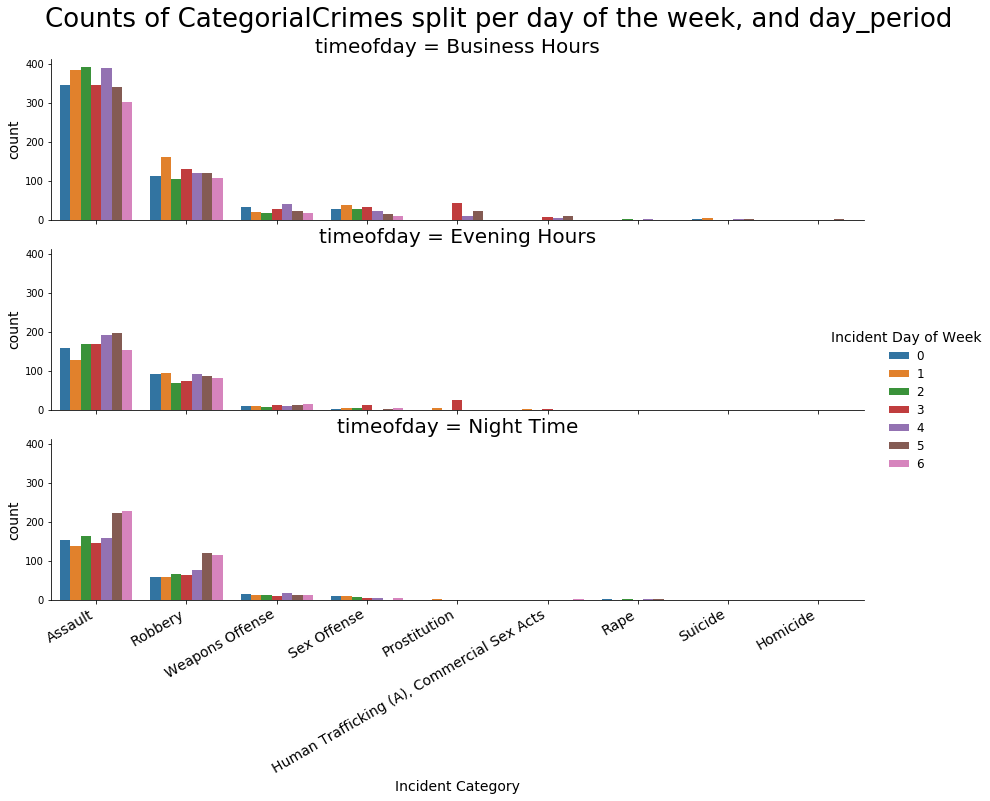

In [112]:
plt.figure(figsize=(20, 10))

g = sns.catplot(x='Incident Category', data=df1, aspect=4.0, kind='count', row='timeofday', height=3,margin_titles=False,
                       hue="Incident Day of Week", order=df1['Incident Category'].value_counts().index) #order='count'

g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Counts of CategorialCrimes split per day of the week, and day_period', fontsize=26)

# Setting SeaBorn Grid-Legends 
# source: https://stackoverflow.com/questions/50201227/how-to-increase-the-font-size-of-the-legend-in-my-seaborn-factorplot-facetgrid
# with the 'for ax in g.axes.flat:' you can set in-graph legends, 
# with the 'g._legend' you reach the private Legend of the FacetGrid or CatPlot
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=12)

# This method can work with non-combined plots.
# ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', size=12)
# g.set_yticklabels(ax.get_yticklabels(), rotation=0,  size=12)

#c = sns.plotting_context("notebook", font_scale=1.5,rc={"lines.linewidth": 2})
for ax in g.axes.flat:
    #ax.legend(fontsize=34, facecolor='White')
    plt.setp(ax.get_xticklabels(), rotation=30, ha='right', size=14)
    ax.set_title(ax.get_title(),fontsize=20)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    if ax.get_legend():
        plt.setp(ax.get_legend().get_texts(), fontsize=22)
        plt.setp(ax.get_legend().get_title(), fontsize=24)

In [113]:
crimedf_tod_distr = df1[['Incident Category','timeofday']].groupby(['Incident Category','timeofday']).size().reset_index(name='counts')
crimedf_distr = df1.groupby(['Incident Category']).size().reset_index(name='counts').sort_values('counts', ascending=False)

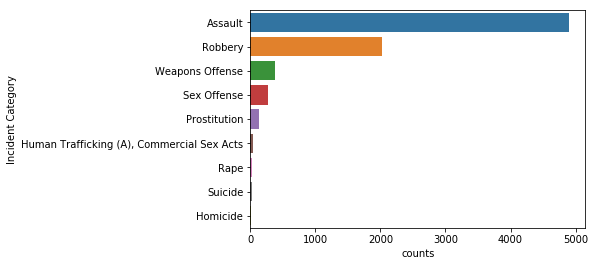

In [114]:
ax = sns.barplot(data=crimedf_distr, y='Incident Category', x='counts')

In [115]:
crimedf_tod_distr.sort_values('counts', ascending=False, inplace=True)
crimedf_tod_distr.head(4)

,Incident Category,timeofday,counts
0,Assault,Business Hours,2510
2,Assault,Night Time,1219
1,Assault,Evening Hours,1172
15,Robbery,Business Hours,864


In [116]:
crimedf_distr.head(4)

,Incident Category,counts
0,Assault,4901
5,Robbery,2028
8,Weapons Offense,375
6,Sex Offense,275


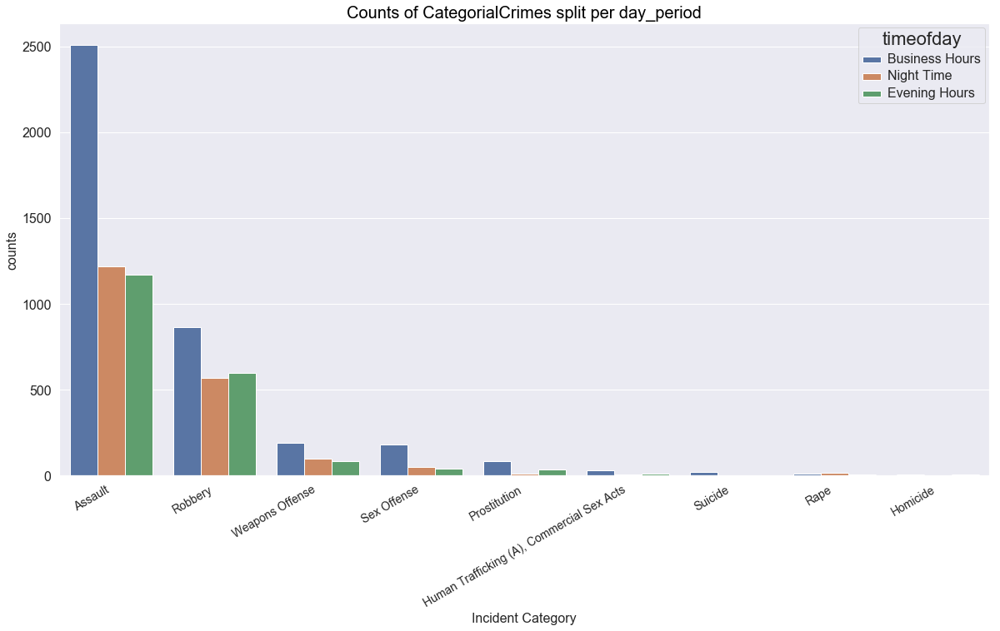

In [117]:
# ax = sns.jointplot(crimedf_tod_distr, y='counts', x=['Incident Category','timeofday'])
# ax = sns.pairplot(df1)
# plt.figure(figsize=(20, 15))
sns.set()
plt.figure(figsize=(20,10))
ax = sns.barplot(data=crimedf_tod_distr, x='Incident Category', y='counts', hue='timeofday')
ax.set_title('Counts of CategorialCrimes split per day_period', size=20, color='black')
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', size=14)
plt.setp(ax.get_legend().get_title(), fontsize=22)
plt.setp(ax.get_legend().get_texts(), fontsize=16)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)
plt.setp(ax.get_yticklabels(), fontsize=16)

plt.show(ax)

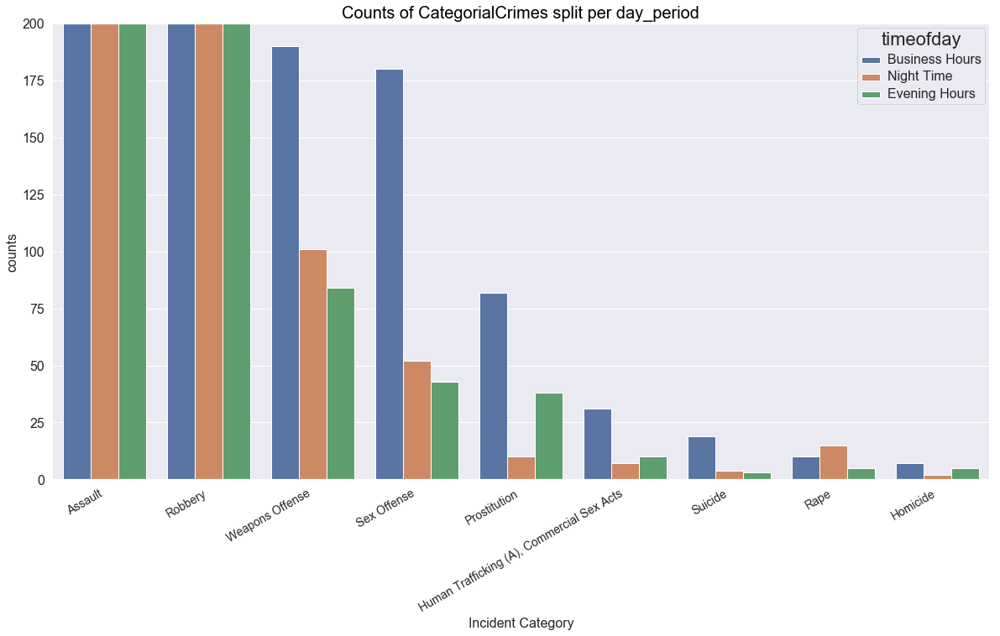

In [118]:
plt.figure(figsize=(20,10))
ax = sns.barplot(data=crimedf_tod_distr, x='Incident Category', y='counts', hue='timeofday')
ax.set(ylim=[0,200])
ax.set_title('Counts of CategorialCrimes split per day_period', size=20, color='black')
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', size=14)
plt.setp(ax.get_legend().get_title(), fontsize=22)
plt.setp(ax.get_legend().get_texts(), fontsize=16)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)
plt.setp(ax.get_yticklabels(), fontsize=16)
plt.show()

/Users/pieter/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


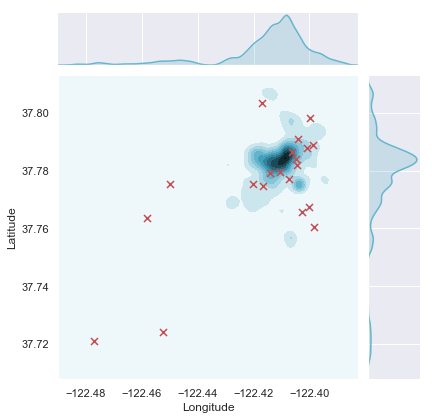

In [119]:
df400 = pd.DataFrame(df1, columns=['Latitude', 'Longitude'])
df401 = pd.DataFrame(df_uni, columns=['latitude', 'longitude','name'])
#sns.set_context("notebook", font_scale=1.5, rc={"font.size":10,"axes.labelsize":10})
sns.set()
sns.set_context("notebook", font_scale=1.0)
ax = sns.jointplot(y=df400.Latitude, x=df400.Longitude, kind='kde', height=6, color='c')
## Add universities to this ax-plot
##
ax.x = df401.longitude
ax.y = df401.latitude
ax.plot_joint(plt.scatter, marker='x', c='r', s=50)


plt.show()


In [120]:
#### Matplotlib rc-parameters, applicable when standard sns.set_context('notebook') does not produce nice results.
#### This profile helps visualise, especially the larger plots, nicely
rc = {   'font.cursive': ['Apple Chancery',
                           'Textile',
                           'Zapf Chancery',
                           'Sand',
                           'Script MT',
                           'Felipa',
                           'cursive'],
          'font.family': ['sans-serif'],
          'font.fantasy': ['Comic Sans MS',
                           'Chicago',
                           'Charcoal',
                           'Impact',
                           'Western',
                           'Humor Sans',
                           'xkcd',
                           'fantasy'],
          'font.monospace': ['DejaVu Sans Mono',
                             'Bitstream Vera Sans Mono',
                             'Computer Modern Typewriter',
                             'Andale Mono',
                             'Nimbus Mono L',
                             'Courier New',
                             'Courier',
                             'Fixed',
                             'Terminal',
                             'monospace'],
          'font.sans-serif': ['DejaVu Sans',
                              'Bitstream Vera Sans',
                              'Computer Modern Sans Serif',
                              'Lucida Grande',
                              'Verdana',
                              'Geneva',
                              'Lucid',
                              'Arial',
                              'Helvetica',
                              'Avant Garde',
                              'sans-serif'],
          'font.serif': ['DejaVu Serif',
                         'Bitstream Vera Serif',
                         'Computer Modern Roman',
                         'New Century Schoolbook',
                         'Century Schoolbook L',
                         'Utopia',
                         'ITC Bookman',
                         'Bookman',
                         'Nimbus Roman No9 L',
                         'Times New Roman',
                         'Times',
                         'Palatino',
                         'Charter',
                         'serif'],
        'lines.linewidth': 2.0,
        'axes.facecolor': '0.995',
        'figure.facecolor': '0.97',
        'figure.titleweight': 'normal',
        'font.size': 14,
        'axes.labelsize': 18,
        'axes.labelweight': 'normal',
        'axes.titlesize': 26,
        'xtick.labelsize': 14,
        'ytick.labelsize': 14,
        'legend.fontsize': 14,
        'legend.title_fontsize': 56.0, 
        'figure.titlesize': 24,
        'figure.dpi': 300.0,
        'font.style': 'normal',
        'font.variant': 'normal',
        'font.weight': 'normal'
    }
sns.set()


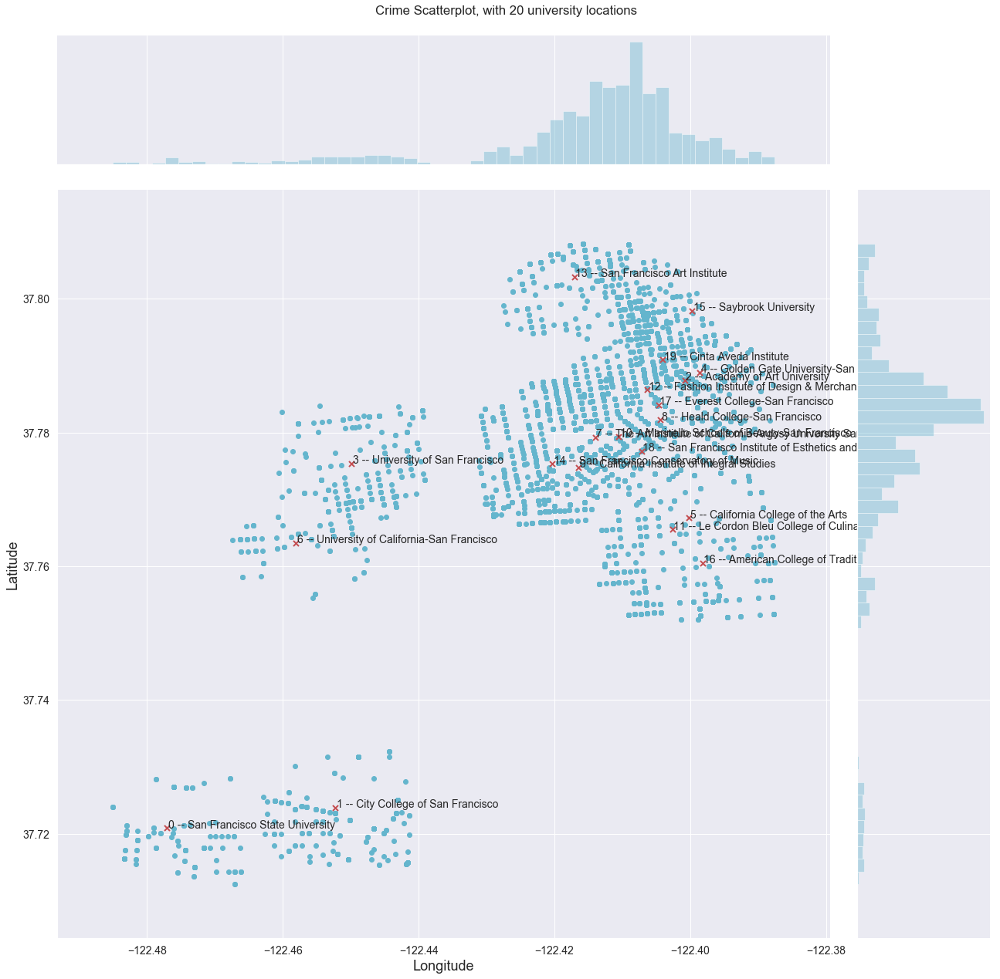

In [121]:
#sns.set_context("notebook", font_scale=2.5, rc=rc)
sns.set_context('notebook', font_scale=1.0, rc=rc)
# sns.set_context('notebook', font_scale=1.5)
#plt.figure(figsize=(40,20))
ax = sns.jointplot(x=df400.Longitude, y=df400.Latitude, kind='scatter', height=18, color='c')


#sns.set_context()
#sns.set_context("notebook", font_scale=2.5)

# plt.subplots_adjust(top=0.9)
# ax.fig.suptitle('Crime Scatterplot, with university locations')

#plt.title('Crime Scatterplot,22 with university locations')

ax.fig.subplots_adjust(top=0.95)

ax.fig.suptitle('Crime Scatterplot, with 20 university locations')
## Add the universities with 'ax.plot_joint' with points in the ax-object
## Add index-numbered + named labels to each plotted university
ax.x = df401.longitude
ax.y = df401.latitude
ax.name = df401.index.to_series().astype(str) + ' -- '+ df401.name

ax.plot_joint(plt.scatter, marker='x', c='r', s=50)

## Small graph anotation routine on plotted points.
## Source: https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.0002, point['y'], point['val']) #, fontsize=12
        
label_point(ax.x, ax.y, ax.name, plt.gca())  
#sns.plotting_context("notebook")
#sns.axes_style()
#plt.show()

- Small dayname sort routine for day-based filtering.

In [122]:
# Dayname sort routine
def days_sorted_order():
    df1['dayname'] = df1['Incident Datetime'].dt.day_name()
    df1[['dayname','Incident Day of Week']].head(1)
    day_sort=[]
    for day in sorted(df1['Incident Day of Week'].unique() ):
        my_select = df1[df1['Incident Day of Week'] == day].iloc[0]
        day_sort.append(my_select['dayname'])
    return day_sort
day_sort = days_sorted_order()

#### The day-based, time period visualised crimes show small differences in the crime-location patterns.
- This could be further visualised with day-based bar graphs.

<Figure size 1440x1080 with 0 Axes>

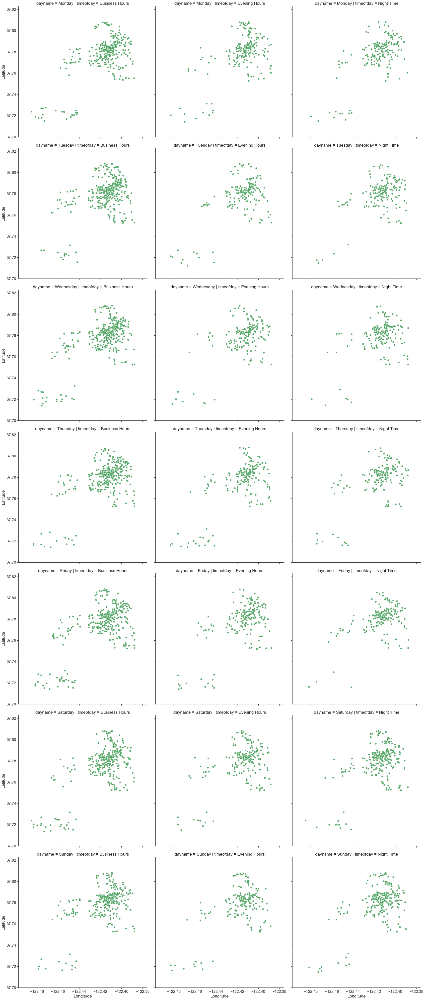

In [123]:
sns.set(style="ticks", color_codes=True)
sns.set_context('notebook',font_scale=1.4)
kws = dict(s=50, linewidth=.5, edgecolor="w")

plt.figure(figsize=(20, 15))
# plt.subplots_adjust(top=0.7,left=0.2,bottom=0.1,right=0.7)
g = sns.FacetGrid(df1, row='dayname', row_order=days_sorted_order(), col='timeofday', height=8) #, height=8 
# g.fig.subplots_adjust(top=0.7,left=0.2,bottom=0.1,right=0.7)
g.fig.subplots_adjust(top=0.7)

g.map(plt.scatter, 'Longitude', 'Latitude',color="g", **kws)
# g.map(sns.regplot, 'Longitude', 'Latitude',color="g", fit_reg=False)

plt.show()

In [125]:
df1.columns

Index(['index', 'Incident Datetime', 'Incident Date', 'Incident Day of Week',
       'Report Datetime', 'Incident Category', 'Incident Subcategory',
       'Incident Description', 'Intersection', 'Analysis Neighborhood',
       'Latitude', 'Longitude', 'uni_loc', 'timeofday', 'dayname'],
      dtype='object')

In [126]:
# Crimes sorted by Category, dayname, timeofday.
crimedf_day_time_distr = df1[['Incident Category','dayname','timeofday']].groupby(['Incident Category','dayname','timeofday']).size().reset_index(name='counts')
crimedf_day_time_distr.head(4)
crimedf_day_distr = df1[['Incident Category','dayname','Incident Day of Week']].groupby(['Incident Category','dayname','Incident Day of Week']).size().reset_index(name='counts')
crimedf_day_distr.head(4)

,Incident Category,dayname,Incident Day of Week,counts
0,Assault,Friday,4,742
1,Assault,Monday,0,661
2,Assault,Saturday,5,766
3,Assault,Sunday,6,686


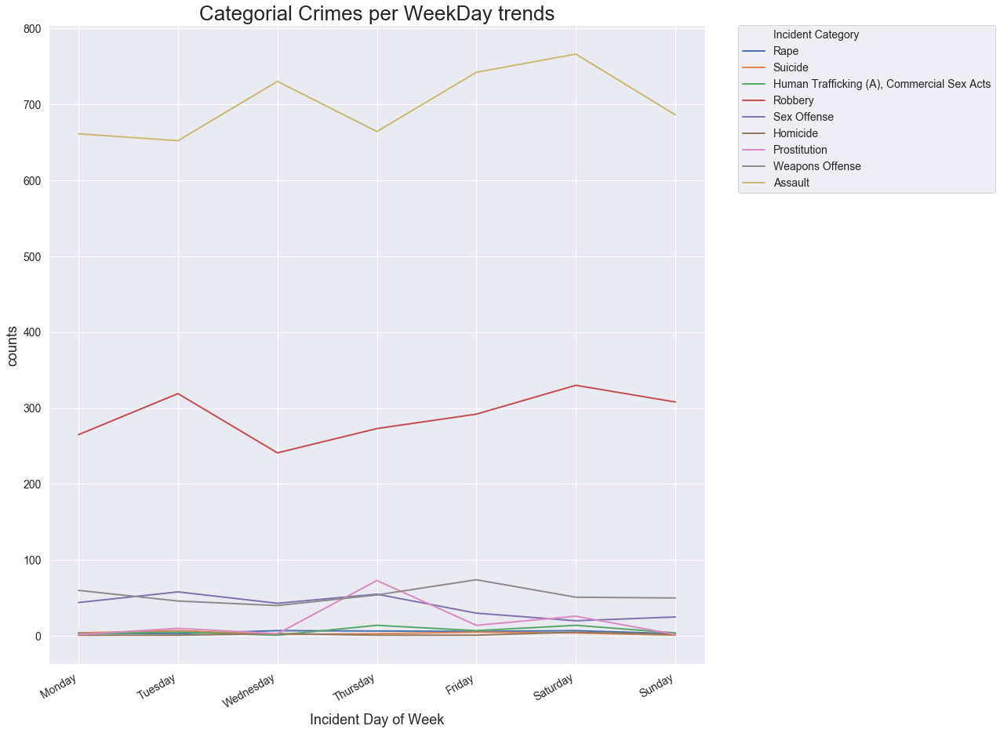

In [127]:
# Sort the DataFrame so results appear in day_order on the x-axis.
crimedf_day_distr.sort_values('Incident Day of Week', ascending=False, inplace=True)

sns.set()
sns.set_style('darkgrid')
sns.set_context('notebook',rc=rc)
plt.figure(figsize=(15,15))

ax = sns.lineplot(x="Incident Day of Week", y="counts", hue="Incident Category", data=crimedf_day_distr)

# Relocate the legend to outside the graph, due to long names, many categories,  
# and actual graph line obfuscations caused by the legend's SeaBorns default placement
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# The xtick label replace needs a placeholder in the sorted_days_list for correct replacement
day_sort_with_placeholder = ['PlaceholderDay'] + days_sorted_order()
ax.set_xticklabels(day_sort_with_placeholder, rotation=30, ha='right')
ax.set_title('Categorial Crimes per WeekDay trends')
plt.show()

## The graph shows some interesting peaks
- Friday's and Saturday's are popular days for Assaults, so that is reassuring.

In [128]:
# .dt.to_period("M") 
# Sorting perMonth, IncidentCategory.
per = df1['Incident Datetime'].dt.to_period("M")
crimedf_month_distr = df1[['Incident Category']].groupby([per,'Incident Category']).size().reset_index(name='counts')
crimedf_month_distr.head(2)

,Incident Datetime,Incident Category,counts
0,2018-01,Assault,378
1,2018-01,Rape,2


In [129]:
crimedf_month_distr['Incident Datetime'] = crimedf_month_distr['Incident Datetime'].apply(pd.Period.to_timestamp)
crimedf_month_distr['Month'] = crimedf_month_distr['Incident Datetime'].dt.month_name()
crimedf_month_distr['Incident Datetime'] = crimedf_month_distr['Incident Datetime'].dt.month
crimedf_month_distr.head(2)

,Incident Datetime,Incident Category,counts,Month
0,1,Assault,378,January
1,1,Rape,2,January


In [130]:
crimedf_month_distr.dtypes

Incident Datetime     int64
Incident Category    object
counts                int64
Month                object
dtype: object

In [131]:
# MonthName sort routine for plotting.
def months_sorted_order():
    df1['monthname'] = df1['Incident Datetime'].dt.month_name()
    df1['month'] = df1['Incident Datetime'].dt.month
    df1[['monthname','Incident Day of Week']].head(1)
    month_sort=[]
    for month in sorted(df1['month'].unique() ):
        my_select = df1[df1['month'] == month].iloc[0]
        month_sort.append(my_select['monthname'])
    return month_sort
month_sort = months_sorted_order()

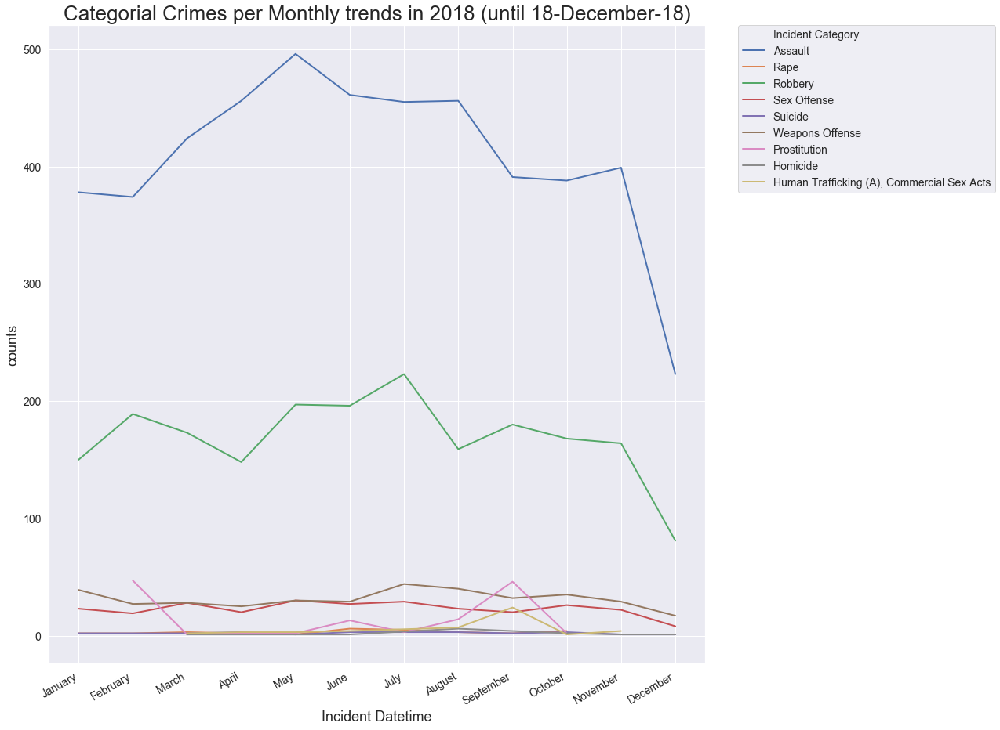

In [132]:
sns.set()
sns.set_style('darkgrid')
sns.set_context('notebook',rc=rc)
plt.figure(figsize=(15,15))
ax = sns.lineplot(x="Incident Datetime", y="counts", hue="Incident Category", data=crimedf_month_distr)

# Relocate the legend to outside the graph.
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Force a Tick per Month.
ax.xaxis.set_major_locator(plt.MultipleLocator(1))

# Insert placeholder for plotting.
month_sort = ['Placeholder'] + months_sorted_order()

ax.set_xticklabels(month_sort, rotation=30, ha='right')
ax.set_title('Categorial Crimes per Monthly trends in 2018 (until 18-December-18)')
plt.show()

In [133]:
assault_monthly_df = crimedf_month_distr.loc[(crimedf_month_distr['Incident Category']=='Assault')& 
                                     (crimedf_month_distr['Month'] != 'December') ]
max_crime = assault_monthly_df.loc[assault_monthly_df['counts'].idxmax()]
min_crime = assault_monthly_df.loc[assault_monthly_df['counts'].idxmin()]
#crime_diff = max_crime['counts'] - min_crime['counts']  df.loc[df['Value'].idxmax()]

print('The lowest AssaultRate was in {} with {} occurences,\n\
the highest rate was in {} with {} occurrences.\n\
The maximum deviation is therefore: {} in the Category of Assault Incidents.'
      .format(min_crime['Month'],min_crime.counts,
              max_crime.Month,max_crime.counts,
              max_crime.counts-min_crime.counts))

The lowest AssaultRate was in February with 374 occurences,
the highest rate was in May with 496 occurrences.
The maximum deviation is therefore: 122 in the Category of Assault Incidents.


In [134]:

# add the main categories to the DataFrame
uni_venues_clustering = uni_venues_clustering.merge(df_cat, on='sub_id')
uni_venues_clustering.columns

Index(['index', 'Venue', 'venue_id', 'Venue Latitude', 'Venue Longitude',
       'Venue Category', 'Venue Category Plural', 'Venue Category Short',
       'sub_id', 'uni_loc', 'main_category', 'main_id', 'sub_category'],
      dtype='object')

In [135]:
uni_venues_clustering.shape

(2078, 13)

In [136]:
# one hot encoding
uni_venues_onehot_subcats = pd.get_dummies(uni_venues_clustering[['Venue Category']], prefix="", prefix_sep="")
uni_venues_onehot_maincats = pd.get_dummies(uni_venues_clustering[['main_category']], prefix="", prefix_sep="")
# add neighborhood column back to dataframe
# Merge the 2 DataFrames and add the 'uni_loc' column
print(uni_venues_onehot_subcats.shape, uni_venues_onehot_maincats.shape)


#### The main_cat df seems to be dominant in the type rankings
#### Maybe Later do clustering with that one....
####
# uni_venues_onehot = uni_venues_onehot_subcats.join(uni_venues_onehot_maincats)
#### A simple copy suffices, to not break existing code....
uni_venues_onehot = uni_venues_onehot_subcats.copy()
print(uni_venues_onehot.shape)
uni_venues_onehot['uni_loc'] = uni_venues_clustering['uni_loc']
# move neighborhood column to the first column
fixed_columns = [uni_venues_onehot.columns[-1]] + list(uni_venues_onehot.columns[:-1])
uni_venues_onehot = uni_venues_onehot[fixed_columns]

#uni_venues_onehot.head(40)
uni_venues_onehot['uni_loc'].size

(2078, 155) (2078, 9)
(2078, 155)


2078

In [137]:
uni_venues_onehot.uni_loc.value_counts().sort_index().to_frame('counts')

,counts
0,44
1,32
2,194
3,38
4,207
5,50
6,54
7,109
8,146
9,88


In [138]:
uni_venues_grouped = uni_venues_onehot.groupby('uni_loc').mean().reset_index()
uni_venues_grouped.shape

(20, 156)

In [139]:
# Creating the merged DataFrame already for %-represented storing
df_uni_merged = df_uni.copy()
df_uni_merged = df_uni_merged.reset_index().rename(columns={'index':'uni_loc'})

df_uni_merged.head(1)

,uni_loc,name,address,ft_enrolment,pub_priv_profit,latitude,longitude,latMin,longMin,latMax,longMax
0,0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.47708,37.71222,-122.487997,37.729489,-122.466164


In [140]:
num_top_venues = 5

for edu in uni_venues_grouped.uni_loc:
    print("----"+df_uni.name[edu]+"----")
    temp = uni_venues_grouped[uni_venues_grouped.uni_loc == edu].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('----Total top5  : '+ str(temp['freq'].sort_values(ascending=False).head(num_top_venues).sum().round(2)) +'% represented ----') 
    print('----Total top10 : '+ str(temp['freq'].sort_values(ascending=False).head(10).sum().round(2)) +'% represented ----')
    print('\n')
    df_uni_merged.loc[edu,'top5'] = temp['freq'].sort_values(ascending=False).head(5).sum().round(2) 
    df_uni_merged.loc[edu,'top10'] = temp['freq'].sort_values(ascending=False).head(10).sum().round(2)

----San Francisco State University----
                venue  freq
0                Café  0.14
1              Bakery  0.11
2         Coffee Shop  0.07
3      Cosmetics Shop  0.05
4  Italian Restaurant  0.02
----Total top5  : 0.39% represented ----
----Total top10 : 0.49% represented ----


----City College of San Francisco----
         venue  freq
0         Café  0.19
1  Coffee Shop  0.09
2          Bar  0.06
3    BBQ Joint  0.06
4  Yoga Studio  0.03
----Total top5  : 0.43% represented ----
----Total top10 : 0.58% represented ----


----Academy of Art University----
            venue  freq
0     Coffee Shop  0.27
1            Café  0.14
2        Tea Room  0.03
3          Bakery  0.03
4  Sandwich Place  0.03
----Total top5  : 0.5% represented ----
----Total top10 : 0.6% represented ----


----University of San Francisco----
               venue  freq
0               Café  0.29
1        Coffee Shop  0.26
2               Park  0.05
3             Bakery  0.05
4  Accessories Store  0.03
---

## Create a new DataFrame with the top10 ranking venues per Neighbourhood

In [141]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [142]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['uni_loc']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
uni_venues_sorted = pd.DataFrame(columns=columns)
uni_venues_sorted['uni_loc'] = uni_venues_grouped['uni_loc']

for ind in np.arange(uni_venues_grouped.shape[0]):
    uni_venues_sorted.iloc[ind, 1:] = return_most_common_venues(uni_venues_grouped.iloc[ind, :], num_top_venues)

uni_venues_sorted

,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,Café,Bakery,Coffee Shop,Cosmetics Shop,Hobby Shop,Gift Shop,Sandwich Place,Candy Store,Chinese Restaurant,Church
1,1,Café,Coffee Shop,BBQ Joint,Bar,Bubble Tea Shop,Cantonese Restaurant,Sandwich Place,Chinese Restaurant,Playground,Yoga Studio
2,2,Coffee Shop,Café,Tea Room,Bakery,Sandwich Place,Gym,Garden,French Restaurant,Food Truck,Juice Bar
3,3,Café,Coffee Shop,Park,Bakery,Accessories Store,Bookstore,Playground,Record Shop,Cocktail Bar,Caribbean Restaurant
4,4,Coffee Shop,Café,Bakery,Tea Room,Sandwich Place,Food Truck,New American Restaurant,Juice Bar,Japanese Restaurant,Gym
5,5,Coffee Shop,Café,Sporting Goods Shop,Gym,Brewery,Yoga Studio,Gym / Fitness Center,Breakfast Spot,Cupcake Shop,Pet Store
6,6,Coffee Shop,Café,Scenic Lookout,Garden,Ice Cream Shop,Mexican Restaurant,Park,Bakery,Breakfast Spot,Bookstore
7,7,Coffee Shop,Café,Bakery,Wine Bar,Dance Studio,Speakeasy,Dessert Shop,Breakfast Spot,Concert Hall,Sandwich Place
8,8,Coffee Shop,Café,Bakery,Tea Room,Juice Bar,Sandwich Place,Garden,Gym / Fitness Center,Wine Shop,Dessert Shop
9,9,Coffee Shop,Café,Bakery,Wine Bar,Sushi Restaurant,Theater,Ice Cream Shop,Concert Hall,Japanese Restaurant,Dance Studio


# Clustering

In [143]:
# set number of clusters
kclusters = 10

uni_venues_grouped_clustering = uni_venues_grouped.drop('uni_loc', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(uni_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:] 
# uni_venues_grouped_clustering.head()
#set(kmeans.labels_[0:])

array([1, 3, 0, 5, 0, 6, 7, 4, 0, 4, 9, 6, 0, 2, 4, 0, 8, 0, 9, 0],
      dtype=int32)

In [144]:
# add clustering labels
df_uni_merged['Cluster Labels'] = kmeans.labels_

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
df_uni_merged = df_uni_merged.join(uni_venues_sorted.set_index('uni_loc'), on='uni_loc')

df_uni_merged.head() 

,uni_loc,name,address,ft_enrolment,pub_priv_profit,latitude,longitude,latMin,longMin,latMax,longMax,top5,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,San Francisco State University,1600 Holloway Ave,"24,644",Public,37.720854,-122.477080,37.712220,-122.487997,37.729489,-122.466164,0.39,0.49,1,Café,Bakery,Coffee Shop,Cosmetics Shop,Hobby Shop,Gift Shop,Sandwich Place,Candy Store,Chinese Restaurant,Church
1,1,City College of San Francisco,50 Phelan Ave,"17,569",Public,37.723931,-122.452299,37.715297,-122.463216,37.732566,-122.441383,0.43,0.58,3,Café,Coffee Shop,BBQ Joint,Bar,Bubble Tea Shop,Cantonese Restaurant,Sandwich Place,Chinese Restaurant,Playground,Yoga Studio
2,2,Academy of Art University,79 New Montgomery,"12,352","Private, for-profit",37.787832,-122.400846,37.779197,-122.411772,37.796466,-122.389920,0.50,0.60,0,Coffee Shop,Café,Tea Room,Bakery,Sandwich Place,Gym,Garden,French Restaurant,Food Truck,Juice Bar
3,3,University of San Francisco,2130 Fulton St,"9,190","Private, not-for-profit",37.775395,-122.449914,37.766761,-122.460838,37.784030,-122.438989,0.68,0.83,5,Café,Coffee Shop,Park,Bakery,Accessories Store,Bookstore,Playground,Record Shop,Cocktail Bar,Caribbean Restaurant
4,4,Golden Gate University-San Francisco,536 Mission Street,"1,816","Private, not-for-profit",37.789008,-122.398582,37.780374,-122.409508,37.797643,-122.387655,0.48,0.54,0,Coffee Shop,Café,Bakery,Tea Room,Sandwich Place,Food Truck,New American Restaurant,Juice Bar,Japanese Restaurant,Gym


# Finding optimal K with 'elbow-method'

In [145]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(uni_venues_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

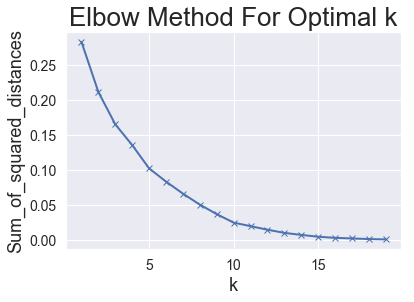

In [146]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

- Optimal 'k' is 10.

# Copy the resulting DataFrame for later comparison


In [147]:
df_uni_merged_subcats = df_uni_merged.copy()

# Plotting Clusters of sub_cat-only K-Means.

In [148]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_uni_merged.latitude, df_uni_merged.longitude, df_uni_merged.name, df_uni_merged['Cluster Labels']):
    label = folium.Popup('<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +'</h6>') # , parse_html=True
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
folium.LayerControl().add_to(map_clusters)       
map_clusters

# Examine Clusters for Naming the found K-Means unsupervised-learning algorithm

In [149]:
for cluster in df_uni_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = df_uni_merged.loc[df_uni_merged['Cluster Labels'] == cluster, df_uni_merged.columns[[1] + list(range(12, df_uni_merged.shape[1]))]]
    display(HTML('<h2>Cluster: '+str(cluster)+'</h2>'), cluster_print_df)

,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Academy of Art University,0.60,0,Coffee Shop,Café,Tea Room,Bakery,Sandwich Place,Gym,Garden,French Restaurant,Food Truck,Juice Bar
4,Golden Gate University-San Francisco,0.54,0,Coffee Shop,Café,Bakery,Tea Room,Sandwich Place,Food Truck,New American Restaurant,Juice Bar,Japanese Restaurant,Gym
8,Heald College-San Francisco,0.58,0,Coffee Shop,Café,Bakery,Tea Room,Juice Bar,Sandwich Place,Garden,Gym / Fitness Center,Wine Shop,Dessert Shop
12,Fashion Institute of Design & Merchandising-Sa...,0.61,0,Coffee Shop,Café,Sandwich Place,Tea Room,Bakery,Breakfast Spot,New American Restaurant,Garden,Art Museum,Hotel
15,Saybrook University,0.58,0,Coffee Shop,Café,Bakery,Sandwich Place,Food Truck,New American Restaurant,Seafood Restaurant,Tea Room,Gym,Italian Restaurant
17,Everest College-San Francisco,0.61,0,Coffee Shop,Café,Bakery,Tea Room,Sandwich Place,Breakfast Spot,Hotel,Juice Bar,Park,Garden
19,Cinta Aveda Institute,0.54,0,Coffee Shop,Café,Bakery,Sandwich Place,Tea Room,New American Restaurant,Juice Bar,Park,Hotel,Garden


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,San Francisco State University,0.49,1,Café,Bakery,Coffee Shop,Cosmetics Shop,Hobby Shop,Gift Shop,Sandwich Place,Candy Store,Chinese Restaurant,Church


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,San Francisco Art Institute,0.56,2,Coffee Shop,Café,Pizza Place,Bakery,Yoga Studio,Donut Shop,Scenic Lookout,Ice Cream Shop,Asian Restaurant,Wine Bar


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,City College of San Francisco,0.58,3,Café,Coffee Shop,BBQ Joint,Bar,Bubble Tea Shop,Cantonese Restaurant,Sandwich Place,Chinese Restaurant,Playground,Yoga Studio


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,The Art Institute of California-Argosy Univers...,0.63,4,Coffee Shop,Café,Bakery,Wine Bar,Dance Studio,Speakeasy,Dessert Shop,Breakfast Spot,Concert Hall,Sandwich Place
9,California Institute of Integral Studies,0.58,4,Coffee Shop,Café,Bakery,Wine Bar,Sushi Restaurant,Theater,Ice Cream Shop,Concert Hall,Japanese Restaurant,Dance Studio
14,San Francisco Conservatory of Music,0.65,4,Coffee Shop,Café,Bakery,Wine Bar,Concert Hall,Sushi Restaurant,Ice Cream Shop,Theater,Dance Studio,Donut Shop


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,University of San Francisco,0.83,5,Café,Coffee Shop,Park,Bakery,Accessories Store,Bookstore,Playground,Record Shop,Cocktail Bar,Caribbean Restaurant


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,California College of the Arts,0.66,6,Coffee Shop,Café,Sporting Goods Shop,Gym,Brewery,Yoga Studio,Gym / Fitness Center,Breakfast Spot,Cupcake Shop,Pet Store
11,Le Cordon Bleu College of Culinary Arts-San Fr...,0.56,6,Coffee Shop,Café,Brewery,Gym,Sporting Goods Shop,Yoga Studio,Diner,Office,Miscellaneous Shop,Wine Shop


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,University of California-San Francisco,0.56,7,Coffee Shop,Café,Scenic Lookout,Garden,Ice Cream Shop,Mexican Restaurant,Park,Bakery,Breakfast Spot,Bookstore


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
16,American College of Traditional Chinese Medicine,0.7,8,Café,Coffee Shop,Bakery,Breakfast Spot,Brewery,Cocktail Bar,Yoga Studio,French Restaurant,Pet Store,Office


,name,top10,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,Marinello Schools of Beauty-San Francisco,0.61,9,Coffee Shop,Café,Bakery,Art Museum,Speakeasy,Tea Room,Dance Studio,Breakfast Spot,Sandwich Place,Wine Shop
18,San Francisco Institute of Esthetics and Cosme...,0.61,9,Coffee Shop,Café,Bakery,Tea Room,Grocery Store,Dance Studio,Japanese Restaurant,Theater,Dessert Shop,Pizza Place


# K-Means with main_categories of venue locations

In [150]:
# one hot encoding
uni_venues_onehot_subcats = pd.get_dummies(uni_venues_clustering[['Venue Category']], prefix="", prefix_sep="")
uni_venues_onehot_maincats = pd.get_dummies(uni_venues_clustering[['main_category']], prefix="", prefix_sep="")
uni_venues_onehot_subcats = uni_venues_onehot_subcats.join(uni_venues_onehot_maincats)
display(uni_venues_onehot.head(1))
#### A simple copy suffices, to not break existing code....
uni_venues_onehot = uni_venues_onehot_subcats.copy()
uni_venues_onehot['uni_loc'] = uni_venues_clustering['uni_loc']
# move neighborhood column to the first column
fixed_columns = [uni_venues_onehot.columns[-1]] + list(uni_venues_onehot.columns[:-1])
uni_venues_onehot = uni_venues_onehot[fixed_columns]
# Mean calculation
uni_venues_grouped = uni_venues_onehot.groupby('uni_loc').mean().reset_index()

#### create the merged dataframe, a bit more early for storing the %-represented results.
df_uni_merged = df_uni.copy()
df_uni_merged = df_uni_merged.reset_index().rename(columns={'index':'uni_loc'})

num_top_venues = 5

for edu in uni_venues_grouped.uni_loc:
    temp = uni_venues_grouped[uni_venues_grouped.uni_loc == edu].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})

    df_uni_merged.loc[edu,'top5'] = temp['freq'].sort_values(ascending=False).head(5).sum().round(2) 
    df_uni_merged.loc[edu,'top10'] = temp['freq'].sort_values(ascending=False).head(10).sum().round(2)
    
# Top 10 tot DataFrame    
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['uni_loc']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
uni_venues_sorted = pd.DataFrame(columns=columns)
uni_venues_sorted['uni_loc'] = uni_venues_grouped['uni_loc']

for ind in np.arange(uni_venues_grouped.shape[0]):
    uni_venues_sorted.iloc[ind, 1:] = return_most_common_venues(uni_venues_grouped.iloc[ind, :], num_top_venues)

display(uni_venues_sorted)
# K-Means
# set number of clusters
kclusters = 10

uni_venues_grouped_clustering = uni_venues_grouped.drop('uni_loc', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(uni_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
display(kmeans.labels_[0:] )


# add clustering labels
df_uni_merged['Cluster Labels'] = kmeans.labels_

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
df_uni_merged = df_uni_merged.join(uni_venues_sorted.set_index('uni_loc'), on='uni_loc')



,uni_loc,Accessories Store,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Garden,Bistro,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Butcher,Cafeteria,Café,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Cosmetics Shop,Coworking Space,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Donut Shop,Dumpling Restaurant,Electronics Store,Ethiopian Restaurant,Exhibit,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flower Shop,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hawaiian Restaurant,History Museum,Hobby Shop,Hotel,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Kitchen Supply Store,Korean Restaurant,Library,Lingerie Store,Liquor Store,Marijuana Dispensary,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Monument / Landmark,Moroccan Restaurant,Mountain,Museum,National Park,New American Restaurant,Nightclub,Office,Opera House,Outdoor Sculpture,Pakistani Restaurant,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pier,Pizza Place,Planetarium,Playground,Plaza,Poke Place,Pop-Up Shop,Public Art,Ramen Restaurant,Record Shop,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Sandwich Place,Scenic Lookout,Science Museum,Seafood Restaurant,Smoke Shop,Smoothie Shop,Snack Place,Southern / Soul Food Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Spiritual Center,Sporting Goods Shop,Street Food Gathering,Supermarket,Sushi Restaurant,Taiwanese Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Trade School,Trail,Trattoria/Osteria,Udon Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,Food,Shop & Service,Café,Bakery,Coffee Shop,Outdoors & Recreation,Nightlife Spot,Cosmetics Shop,Snack Place,Candy Store
1,1,Food,Café,Outdoors & Recreation,Nightlife Spot,Coffee Shop,BBQ Joint,Bar,Burger Joint,Trail,Cantonese Restaurant
2,2,Food,Coffee Shop,Café,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Tea Room,Bakery,Sandwich Place,Nightlife Spot
3,3,Food,Café,Coffee Shop,Shop & Service,Outdoors & Recreation,Park,Bakery,Accessories Store,Bookstore,Deli / Bodega
4,4,Food,Coffee Shop,Café,Shop & Service,Outdoors & Recreation,Nightlife Spot,Bakery,Tea Room,Sandwich Place,Arts & Entertainment
5,5,Food,Coffee Shop,Café,Shop & Service,Outdoors & Recreation,Sporting Goods Shop,Nightlife Spot,Gym,Brewery,Yoga Studio
6,6,Food,Outdoors & Recreation,Coffee Shop,Shop & Service,Arts & Entertainment,Café,Bakery,Breakfast Spot,Ice Cream Shop,Garden
7,7,Food,Coffee Shop,Café,Shop & Service,Arts & Entertainment,Bakery,Nightlife Spot,Wine Bar,Breakfast Spot,Concert Hall
8,8,Food,Coffee Shop,Café,Shop & Service,Outdoors & Recreation,Bakery,Arts & Entertainment,Nightlife Spot,Tea Room,Sandwich Place
9,9,Food,Coffee Shop,Café,Shop & Service,Arts & Entertainment,Bakery,Nightlife Spot,Wine Bar,Japanese Restaurant,Sushi Restaurant


array([5, 3, 0, 8, 0, 2, 4, 1, 0, 1, 9, 2, 0, 6, 1, 0, 7, 0, 9, 0],
      dtype=int32)

# Finding optimal K with 'elbow-method'

In [151]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(uni_venues_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

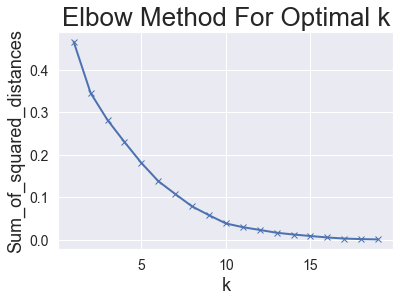

In [152]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

- A 'k' of 10 seems optimal.

# Plot clusters of venues with included one-hot-encoded main-categories.

In [153]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_uni_merged.latitude, df_uni_merged.longitude, df_uni_merged.name, df_uni_merged['Cluster Labels']):
    label = folium.Popup('<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +'</h6>') # , parse_html=True
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
folium.LayerControl().add_to(map_clusters)       
map_clusters

In [154]:

from IPython.display import display, HTML

In [156]:
df_part = df_uni_merged_subcats[['name','Cluster Labels']].sort_values(by='Cluster Labels')
# display(df_part)
df_part2 = df_uni_merged[['name','Cluster Labels']].sort_values(by='Cluster Labels')
# display(df_part2)

In [157]:
df_part4 = df_part.merge(df_part2, on='name')
display(df_part4)

,name,Cluster Labels_x,Cluster Labels_y
0,Cinta Aveda Institute,0,0
1,Everest College-San Francisco,0,0
2,Academy of Art University,0,0
3,Saybrook University,0,0
4,Golden Gate University-San Francisco,0,0
5,Fashion Institute of Design & Merchandising-Sa...,0,0
6,Heald College-San Francisco,0,0
7,San Francisco State University,1,5
8,San Francisco Art Institute,2,6
9,City College of San Francisco,3,3


## Venue clustering feature difference conclusion :
- The clusters have different numbers but are containing the same location.
- The inclusion of main categories does not matter for clustering this set of venues and locations.

In [159]:
df1['Analysis Neighborhood'].value_counts().sort_index().to_frame('counts')
# uni_venues_onehot.uni_loc.value_counts().sort_index().to_frame()

,counts
Bayview Hunters Point,39
Castro/Upper Market,86
Chinatown,255
Excelsior,2
Financial District/South Beach,1340
Golden Gate Park,54
Haight Ashbury,135
Hayes Valley,187
Inner Richmond,4
Inner Sunset,66


In [160]:
df1.head(4)

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc,timeofday,dayname,monthname,month
0,551,2018-10-27 08:00:00,2018-10-27,5,2018-10-27 08:16:00,Robbery,Robbery - Street,"Robbery, Street or Public Place, W/ Force",ARCH ST \ RANDOLPH ST,Oceanview/Merced/Ingleside,37.714273,-122.467094,0,Business Hours,Saturday,October,10
1,2417,2018-10-31 12:00:00,2018-10-31,2,2018-10-31 12:15:00,Assault,Simple Assault,Battery,20TH AVE \ WINSTON DR,Lakeshore,37.726950,-122.476039,0,Business Hours,Wednesday,October,10
2,3231,2018-11-02 12:00:00,2018-11-02,4,2018-11-02 12:32:00,Assault,Simple Assault,Battery,RIVAS AVE \ GONZALEZ DR,Lakeshore,37.717531,-122.481543,0,Business Hours,Friday,November,11
3,3406,2018-11-02 18:15:00,2018-11-02,4,2018-11-02 22:09:00,Assault,Simple Assault,Battery,20TH AVE \ WINSTON DR,Lakeshore,37.726950,-122.476039,0,Evening Hours,Friday,November,11


In [161]:
def calculate_quadrant(index,  quad_dim): #latMin, latMax, longMin, longMax,
    labels = range(quad_dim)
    latcat, latbins = pd.cut([df_uni['latMin'][index],df_uni['latMax'][index]], quad_dim, precision=6, retbins=True, labels=labels)
    longcat, longbins = pd.cut([df_uni['longMin'][index],df_uni['longMax'][index]], quad_dim, retbins=True, precision=6, labels=labels)
    return latcat, latbins, longcat, longbins
# latbins, s, latlabels, sbins = calculate_quadrant(0, 4)
# latcat, latbins, longcat, longbins = calculate_quadrant(0, 4)
# col.shape

In [162]:
df_crime.head(1)

,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude
9,2018-10-25 03:00:00,2018-10-25,3,2018-10-25 07:39:00,Robbery,Robbery - Other,"Robbery, W/ Force",STEVENSON ST \ 07TH ST \ ODD FELLOWS WAY,South of Market,37.780006,-122.411933


In [163]:
# Creates bounded box df, with duplicates.
crime_merged_latlong = pd.DataFrame()
df2 = pd.DataFrame()
for index, row in df_uni.iterrows():
    # Explicit use of .copy() to let Pandas know a Copy is wanted, and it is not intended to be a View of the original DataFrame
    dftemp= df_crime.loc[(df_crime.Latitude >= df_uni['latMin'][index]) &( df_crime.Latitude <= df_uni['latMax'][index])\
                         & (df_crime.Longitude >= df_uni['longMin'][index] )& (df_crime.Longitude <= df_uni['longMax'][index] ) ].copy() 
    dftemp.reset_index(inplace=True)
    dftemp.loc[:,'uni_loc'] = index
    dftemp.loc[:,'uni_loc_q'] = index * 100
    # Adding Quadrant identifiers with format: loc_id *100, longq*10, latq, --> 
    # this results in: {loc_id x00, lat_quadrant x0, long_quadrand x}
    latcat, latbins, longcat, longbins = calculate_quadrant(index, 4)
    lat_quad = pd.cut(dftemp['Latitude'],latbins, labels=latcat.categories*1,  precision = 6).to_frame(name='latq')
    long_quad = pd.cut(dftemp['Longitude'],longbins, labels=longcat.categories*10,  precision = 6).to_frame(name='longq')
    
    # get center of quadrants from IntervalIndex.
    loc_lat = pd.cut(dftemp['Latitude'],latbins, precision = 6).to_frame(name='Latitude')
    loc_lat.reset_index(inplace=True)
    loc_lat.set_index('Latitude',inplace=True)
    loc_lat['latitude'] = pd.IntervalIndex(loc_lat.index.get_level_values('Latitude')).mid
    loc_lat.reset_index(inplace=True)
    loc_lat.drop(columns='Latitude',inplace=True)

    loc_long = pd.cut(dftemp['Longitude'],longbins, precision = 6).to_frame()
    loc_long.reset_index(inplace=True)
    loc_long.set_index('Longitude', inplace = True)
    loc_long['longitude'] = pd.IntervalIndex(loc_long.index.get_level_values('Longitude')).mid
    loc_long.reset_index(inplace=True)
    loc_long.drop(columns='Longitude',inplace=True)

    loc_lat = loc_lat.merge(loc_long, on='index')

    dftempy = pd.merge(lat_quad, long_quad,  left_index=True, right_index=True)
    dftemp = dftemp.merge(dftempy, left_index=True, right_index=True)
    dftemp['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    df2 = df2.append( dftemp,ignore_index=True)
    
    loc_lat['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    crime_merged_latlong = crime_merged_latlong.append(loc_lat, ignore_index=True)
crime_clustering = df2.copy()
# verify if crime DataFrames contain all crimes.
print(df2.shape, df_crime.shape)
print(df2['index'].unique().size)
print(df1['index'].unique().size)
# crime_clustering.tail()
crime_merged_latlong.set_index('index',inplace=True)

(37344, 17) (13872, 11)
7827
7827


In [164]:
crime_merged_latlong.shape

(37344, 3)

In [165]:
crime_merged_latlong.head()

,latitude,longitude,loc_quad
index,,,
0,37.714370,-122.468893,30.0
1,37.727331,-122.474351,23.0
2,37.718696,-122.479810,11.0
3,37.727331,-122.474351,23.0
4,37.714370,-122.474351,20.0


In [166]:
# crime_lat['lat_mid'] = pd.IntervalIndex(crime_lat.index.get_level_values('latq')).mid

In [167]:
# crime_lat.head()

In [168]:
df2.head(1)

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc,uni_loc_q,latq,longq,loc_quad
0,551,2018-10-27 08:00:00,2018-10-27,5,2018-10-27 08:16:00,Robbery,Robbery - Street,"Robbery, Street or Public Place, W/ Force",ARCH ST \ RANDOLPH ST,Oceanview/Merced/Ingleside,37.714273,-122.467094,0,0,0,30,30.0


In [169]:
# one hot encoding
crime_onehot_subcats = pd.get_dummies(df2[['Incident Subcategory']], prefix="", prefix_sep="")
crime_onehot_maincats = pd.get_dummies(df2[['Incident Category']], prefix="m", prefix_sep="_")
# add neighborhood column back to dataframe
# Merge the 2 DataFrames and add the 'uni_loc' column
print(uni_venues_onehot_subcats.shape, uni_venues_onehot_maincats.shape)


#### The main_cat df seems to be dominant in the type rankings
#### Maybe Later do clustering with that one....
####
# crime_onehot_subcats = crime_onehot_subcats.join(crime_onehot_maincats)
#### A simple copy suffices, to not break existing code....
crime_onehot = crime_onehot_subcats.copy()
print(uni_venues_onehot.shape)
crime_onehot['uni_loc'] = crime_clustering['uni_loc']
crime_onehot['loc_quad'] = crime_clustering['loc_quad']
# move neighborhood column to the first column
fixed_columns = [crime_onehot.columns[-1]] + [crime_onehot.columns[-2]] + list(crime_onehot.columns[:-2])
crime_onehot = crime_onehot[fixed_columns]

#uni_venues_onehot.head(40)
crime_onehot['loc_quad'].unique().size
# display(crime_onehot.tail())
crime_onehot.head()

(2078, 164) (2078, 9)
(2078, 165)


,loc_quad,uni_loc,Aggravated Assault,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Rape - Attempted,Robbery - Carjacking,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street,Sex Offense,"Sex Offense, Child",Simple Assault,Suicide,Weapons Offense
0,30.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,11.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,20.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [170]:
crime_onehot.loc_quad.value_counts().sort_index().to_frame('counts').head()

,counts
0.0,11
1.0,6
2.0,5
10.0,3
11.0,16


## Calculate the mean of the _'Frequency of Occurrence'_  per Neighbourhood-Quadrant _(loc_quad)_.


In [171]:
crime_grouped = crime_onehot.groupby(['loc_quad','uni_loc'])[crime_onehot.columns[2:]].mean().reset_index()
crime_grouped.shape

(311, 20)

In [172]:
crime_grouped.tail()

,loc_quad,uni_loc,Aggravated Assault,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Rape - Attempted,Robbery - Carjacking,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street,Sex Offense,"Sex Offense, Child",Simple Assault,Suicide,Weapons Offense
306,1923.0,19,0.145455,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.163636,0.0,0.109091,0.000000,0.0,0.454545,0.000000,0.127273
307,1930.0,19,0.275862,0.0,0.0,0.034483,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.172414,0.0,0.068966,0.034483,0.0,0.413793,0.000000,0.000000
308,1931.0,19,0.285714,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.206349,0.0,0.063492,0.000000,0.0,0.396825,0.000000,0.047619
309,1932.0,19,0.126984,0.0,0.0,0.000000,0.0,0.0,0.007937,0.007937,0.0,0.071429,0.126984,0.0,0.111111,0.015873,0.0,0.515873,0.007937,0.007937
310,1933.0,19,0.040000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.360000,0.160000,0.0,0.040000,0.000000,0.0,0.280000,0.000000,0.120000


## The following print_out shows the ranking on sub-categories.
- The main_category inclusion follows after this clustering set.
- The 2 resultsets will be compared:
  - only-sub-category clustering Versus sub and main-category features clustering.

In [173]:
def return_most_common_crimes(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [174]:
num_top_crimes = 15

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['loc_quad','uni_loc']
for ind in np.arange(num_top_crimes):
    try:
        columns.append('{}{} Most Common Crime'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Crime'.format(ind+1))

# create a new dataframe
crime_sorted = pd.DataFrame(columns=columns)
crime_sorted[['loc_quad','uni_loc']] = crime_grouped[['loc_quad','uni_loc']]
display(crime_sorted.shape[0])
for ind in np.arange(crime_grouped.shape[0]):
    crime_sorted.iloc[ind, 2:] = return_most_common_crimes(crime_grouped.iloc[ind, 1:], num_top_crimes)

crime_sorted[14:16]

311

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
14,33.0,0,Weapons Offense,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
15,100.0,1,Aggravated Assault,Simple Assault,Robbery - Other,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street


In [175]:
crime_grouped.head()

,loc_quad,uni_loc,Aggravated Assault,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Rape - Attempted,Robbery - Carjacking,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street,Sex Offense,"Sex Offense, Child",Simple Assault,Suicide,Weapons Offense
0,0.0,0,0.090909,0.0,0.0,0.0,0.0,0.909091,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
1,1.0,0,0.333333,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.500000,0.0,0.166667
2,2.0,0,0.200000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.600000,0.2,0.000000
3,10.0,0,0.333333,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.666667,0.0,0.000000
4,11.0,0,0.125000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0625,0.0,0.0,0.0,0.0,0.750000,0.0,0.062500


In [176]:
# Creating the merged DataFrame already for %-represented storing
crime_merged = crime_grouped.loc[:,['loc_quad','uni_loc']]
# crime_merged = crime_merged.reset_index().rename(columns={'index':'uni_loc'})

crime_merged = crime_merged.join(df_uni[['name']], on='uni_loc')
crime_merged.tail(10)

,loc_quad,uni_loc,name
301,1912.0,19,Cinta Aveda Institute
302,1913.0,19,Cinta Aveda Institute
303,1920.0,19,Cinta Aveda Institute
304,1921.0,19,Cinta Aveda Institute
305,1922.0,19,Cinta Aveda Institute
306,1923.0,19,Cinta Aveda Institute
307,1930.0,19,Cinta Aveda Institute
308,1931.0,19,Cinta Aveda Institute
309,1932.0,19,Cinta Aveda Institute
310,1933.0,19,Cinta Aveda Institute


In [177]:
# K-Means
# set number of clusters
kclusters = 12

crime_grouped_clustering = crime_grouped.drop(['uni_loc','loc_quad'], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(crime_grouped_clustering)

# check cluster labels generated for each row in the dataframe
display(kmeans.labels_[0:].size )


# add clustering labels
crime_merged['Cluster Labels'] = kmeans.labels_[:]
print(crime_merged.shape)
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
crime_merged = crime_merged[['loc_quad','name','Cluster Labels']].merge(crime_sorted, on='loc_quad')
crime_merged.head(2)

###############################################
#### For later comparison between all incidents and only Business Hours incidents.
dfcrime_all_merged =  crime_merged.copy()

311

(311, 4)


# Finding the optimal 'K' with the elbow-method.

In [178]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(crime_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

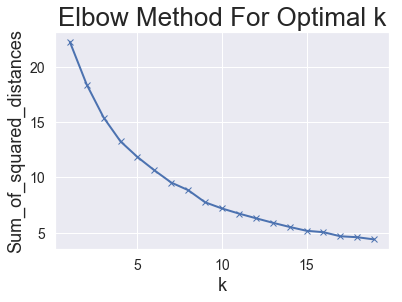

In [179]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [180]:
# crime_merged_latlong.reset_index()
crime_merged_latlong['loc_quad'].unique()
crime_merged_latlong_grouped = crime_merged_latlong.groupby(['loc_quad'])[crime_merged_latlong.columns[:-1]].last().reset_index()
crime_merged_latlong_grouped.head()

,loc_quad,latitude,longitude
0,0.0,37.714370,-122.485278
1,1.0,37.718696,-122.485278
2,2.0,37.723013,-122.485278
3,10.0,37.714370,-122.479810
4,11.0,37.718696,-122.479810


In [181]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
kclusters=20
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
color_list = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', 
              '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
              '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
              '#000075', '#808080', '#ffffff', '#000000']
rainbow2 = [i for i in color_list]


# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(crime_merged_latlong_grouped.latitude, 
                                  crime_merged_latlong_grouped.longitude, 
                                  crime_merged.name, crime_merged['Cluster Labels']):
    label = folium.Popup('<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +'</h6>') # , parse_html=True
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow2[cluster-1],
        fill=True,
        #fill_color=rainbow[cluster-1],
        fill_color=rainbow2[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
folium.LayerControl().add_to(map_clusters)       
map_clusters

In [182]:
crime_merged.head()

,loc_quad,name,Cluster Labels,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
0,0.0,San Francisco State University,4,0,Prostitution,Aggravated Assault,Suicide,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Rape,Rape - Attempted,Weapons Offense,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street,Sex Offense
1,1.0,San Francisco State University,0,0,Simple Assault,Aggravated Assault,Weapons Offense,"Sex Offense, Child",Sex Offense,Robbery - Street,Robbery - Residential,Robbery - Other,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
2,2.0,San Francisco State University,11,0,Simple Assault,Aggravated Assault,Suicide,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
3,10.0,San Francisco State University,11,0,Simple Assault,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
4,11.0,San Francisco State University,11,0,Simple Assault,Aggravated Assault,Robbery - Other,Weapons Offense,Sex Offense,Robbery - Street,Robbery - Residential,"Sex Offense, Child",Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


In [183]:
for cluster in crime_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = crime_merged.loc[crime_merged['Cluster Labels'] == cluster, crime_merged.columns[[0] + list(range(3, crime_merged.shape[1]))]]
    display(HTML('<h2>Cluster: '+str(cluster)+'</h2>'),cluster_print_df.shape[0], cluster_print_df.head())

59

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
1,1.0,0,Simple Assault,Aggravated Assault,Weapons Offense,"Sex Offense, Child",Sex Offense,Robbery - Street,Robbery - Residential,Robbery - Other,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
12,31.0,0,Aggravated Assault,Simple Assault,Robbery - Other,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street
15,100.0,1,Aggravated Assault,Simple Assault,Robbery - Other,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street
16,101.0,1,Simple Assault,Aggravated Assault,Robbery - Street,Robbery - Other,Weapons Offense,Sex Offense,Robbery - Residential,"Sex Offense, Child",Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
42,230.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Sex Offense,Child Abuse,Weapons Offense,Robbery - Street,Robbery - Residential,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


31

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
14,33.0,0,Weapons Offense,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
20,111.0,1,Simple Assault,Aggravated Assault,Robbery - Other,Weapons Offense,Robbery - Street,Sex Offense,Robbery - Commercial,Robbery - Residential,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
21,112.0,1,Simple Assault,Weapons Offense,Robbery - Street,Robbery - Other,Aggravated Assault,Sex Offense,Robbery - Residential,"Sex Offense, Child",Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
22,113.0,1,Weapons Offense,Simple Assault,Robbery - Street,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential
41,223.0,2,Simple Assault,Robbery - Other,Robbery - Street,Aggravated Assault,Robbery - Commercial,Weapons Offense,Sex Offense,Suicide,Rape - Attempted,Robbery - Residential,"Sex Offense, Child",Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


97

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
23,120.0,1,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Commercial,Robbery - Residential
26,130.0,1,Simple Assault,Aggravated Assault,Robbery - Street,Weapons Offense,"Sex Offense, Child",Robbery - Other,Rape,Child Abuse,Robbery - Carjacking,Sex Offense,Robbery - Residential,Robbery - Commercial,Suicide,Rape - Attempted,Prostitution
27,131.0,1,Simple Assault,Robbery - Other,Aggravated Assault,Robbery - Street,Weapons Offense,Suicide,Sex Offense,Robbery - Residential,"Sex Offense, Child",Robbery - Commercial,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
30,200.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Weapons Offense,Robbery - Commercial,Robbery - Carjacking,Sex Offense,Suicide,Rape - Attempted,Rape,Child Abuse,Robbery - Residential,"Sex Offense, Child",Prostitution
33,203.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Commercial,Robbery - Street,Weapons Offense,Sex Offense,Prostitution,"Human Trafficking (A), Commercial Sex Acts",Robbery - Residential,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Manslaughter


5

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
84,513.0,5,Child Abuse,Aggravated Assault,Robbery - Commercial,Simple Assault,Robbery - Other,Robbery - Street,Sex Offense,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Manslaughter,Homicide,Robbery - Residential,Suicide,Rape - Attempted
121,731.0,7,Child Abuse,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Robbery - Commercial,Sex Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Weapons Offense,Rape,Manslaughter,Homicide,Rape - Attempted,Prostitution
132,820.0,8,Child Abuse,Aggravated Assault,Simple Assault,Robbery - Commercial,Sex Offense,Robbery - Other,Robbery - Street,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Rape,Manslaughter,Homicide,Robbery - Residential,Suicide
169,1031.0,10,Child Abuse,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Commercial,Sex Offense,Robbery - Street,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Rape,Manslaughter,Homicide,Robbery - Residential,Suicide
288,1821.0,18,Child Abuse,Aggravated Assault,Robbery - Commercial,Simple Assault,Robbery - Other,Sex Offense,Robbery - Street,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Rape,Manslaughter,Homicide,Robbery - Residential,Suicide


8

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
0,0.0,0,Prostitution,Aggravated Assault,Suicide,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Rape,Rape - Attempted,Weapons Offense,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street,Sex Offense
39,221.0,2,Simple Assault,Prostitution,Robbery - Other,"Human Trafficking (A), Commercial Sex Acts",Aggravated Assault,Robbery - Commercial,Weapons Offense,Robbery - Street,Rape,Robbery - Residential,Suicide,Rape - Attempted,Sex Offense,Manslaughter,"Sex Offense, Child"
67,411.0,4,Simple Assault,Prostitution,Robbery - Other,Aggravated Assault,"Human Trafficking (A), Commercial Sex Acts",Robbery - Commercial,Weapons Offense,Robbery - Street,Sex Offense,Robbery - Residential,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child"
134,822.0,8,Prostitution,Simple Assault,"Human Trafficking (A), Commercial Sex Acts",Robbery - Other,Aggravated Assault,Weapons Offense,Robbery - Commercial,Robbery - Street,Sex Offense,Robbery - Residential,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child"
201,1231.0,12,Prostitution,Simple Assault,"Human Trafficking (A), Commercial Sex Acts",Aggravated Assault,Robbery - Other,Rape,Rape - Attempted,Child Abuse,Homicide,Manslaughter,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street


4

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
13,32.0,0,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street,Sex Offense
18,103.0,1,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street,Sex Offense
87,522.0,5,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street,Sex Offense
252,1611.0,16,Robbery - Other,Weapons Offense,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street


47

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
10,23.0,0,Simple Assault,Robbery - Commercial,Aggravated Assault,Robbery - Other,Robbery - Street,Weapons Offense,Robbery - Residential,Sex Offense,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
29,133.0,1,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Commercial,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Residential,Robbery - Street
31,201.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Commercial,Prostitution,Robbery - Street,"Human Trafficking (A), Commercial Sex Acts",Weapons Offense,Suicide,Sex Offense,Child Abuse,Robbery - Carjacking,Robbery - Residential,Rape - Attempted,Rape
32,202.0,2,Simple Assault,Robbery - Commercial,Robbery - Other,Aggravated Assault,Weapons Offense,Robbery - Street,Prostitution,Sex Offense,Suicide,"Human Trafficking (A), Commercial Sex Acts",Robbery - Residential,"Sex Offense, Child",Rape - Attempted,Rape,Manslaughter
35,211.0,2,Simple Assault,Robbery - Commercial,Aggravated Assault,Robbery - Other,Prostitution,Weapons Offense,Robbery - Street,"Human Trafficking (A), Commercial Sex Acts",Sex Offense,Robbery - Residential,Suicide,Rape - Attempted,Rape,"Sex Offense, Child",Manslaughter


5

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
5,12.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
6,13.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
96,610.0,6,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
97,611.0,6,Simple Assault,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street
104,630.0,6,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street


15

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
7,20.0,0,Aggravated Assault,Simple Assault,Robbery - Other,Sex Offense,Robbery - Commercial,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Residential
11,30.0,0,Aggravated Assault,Simple Assault,Robbery - Street,Robbery - Commercial,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Other,Robbery - Residential
24,121.0,1,Aggravated Assault,Robbery - Street,Simple Assault,Weapons Offense,Suicide,Sex Offense,"Sex Offense, Child",Robbery - Residential,Robbery - Other,Robbery - Commercial,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
28,132.0,1,Aggravated Assault,Simple Assault,Robbery - Street,Robbery - Commercial,Weapons Offense,Sex Offense,Robbery - Residential,Robbery - Other,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
81,510.0,5,Aggravated Assault,Robbery - Street,Robbery - Other,Robbery - Carjacking,Sex Offense,"Sex Offense, Child",Robbery - Residential,Simple Assault,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


1

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
52,312.0,3,Robbery - Street,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Sex Offense


2

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
17,102.0,1,Robbery - Commercial,Aggravated Assault,Simple Assault,Robbery - Other,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Residential,Robbery - Street
25,123.0,1,Robbery - Commercial,Aggravated Assault,Weapons Offense,"Sex Offense, Child",Sex Offense,Robbery - Street,Robbery - Residential,Robbery - Other,Simple Assault,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


37

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
2,2.0,0,Simple Assault,Aggravated Assault,Suicide,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
3,10.0,0,Simple Assault,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Residential,Robbery - Street
4,11.0,0,Simple Assault,Aggravated Assault,Robbery - Other,Weapons Offense,Sex Offense,Robbery - Street,Robbery - Residential,"Sex Offense, Child",Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"
8,21.0,0,Simple Assault,Aggravated Assault,Robbery - Street,Robbery - Commercial,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Other,Robbery - Residential
9,22.0,0,Simple Assault,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Residential,Robbery - Street


# Select only daytime events.


In [184]:
df_crime_working = df_crime.copy()
# Add time of day column 
df_crime_working.loc[:,'timeofday'] = ['Business Hours' if ((v.hour >= 8) & (v.hour<18)) else 'Evening Hours' if ((v.hour >= 18) & (v.hour<23))
                                       else 'Night Time' for v in df_crime_working['Incident Datetime'] ] 
df_crime = df_crime_working.loc[df_crime_working.timeofday == 'Business Hours'].copy()

# Creates bounded box df, with duplicates.
crime_merged_latlong = pd.DataFrame()
df4 = pd.DataFrame()

for index, row in df_uni.iterrows():
    # Explicit use of .copy() to let Pandas know a Copy is wanted, and it is not intended to be a View of the original DataFrame
    dftemp= df_crime.loc[(df_crime.Latitude >= df_uni['latMin'][index]) &( df_crime.Latitude <= df_uni['latMax'][index])\
                         & (df_crime.Longitude >= df_uni['longMin'][index] )& (df_crime.Longitude <= df_uni['longMax'][index] ) ].copy() 
    dftemp.reset_index(inplace=True)
    dftemp.loc[:,'uni_loc'] = index
    dftemp.loc[:,'uni_loc_q'] = index * 100
    # Adding Quadrant identifiers with format: loc_id *100, longq*10, latq, --> 
    # this results in: {loc_id x00, lat_quadrant x0, long_quadrand x}
    latcat, latbins, longcat, longbins = calculate_quadrant(index, 4)
    lat_quad = pd.cut(dftemp['Latitude'],latbins, labels=latcat.categories*1,  precision = 6).to_frame(name='latq')
    long_quad = pd.cut(dftemp['Longitude'],longbins, labels=longcat.categories*10,  precision = 6).to_frame(name='longq')
    
    # get center of quadrants from IntervalIndex.
    loc_lat = pd.cut(dftemp['Latitude'],latbins, precision = 6).to_frame(name='Latitude')
    loc_lat.reset_index(inplace=True)
    loc_lat.set_index('Latitude',inplace=True)
    loc_lat['latitude'] = pd.IntervalIndex(loc_lat.index.get_level_values('Latitude')).mid
    loc_lat.reset_index(inplace=True)
    loc_lat.drop(columns='Latitude',inplace=True)

    loc_long = pd.cut(dftemp['Longitude'],longbins, precision = 6).to_frame()
    loc_long.reset_index(inplace=True)
    loc_long.set_index('Longitude', inplace = True)
    loc_long['longitude'] = pd.IntervalIndex(loc_long.index.get_level_values('Longitude')).mid
    loc_long.reset_index(inplace=True)
    loc_long.drop(columns='Longitude',inplace=True)

    loc_lat = loc_lat.merge(loc_long, on='index')

    dftempy = pd.merge(lat_quad, long_quad,  left_index=True, right_index=True)
    dftemp = dftemp.merge(dftempy, left_index=True, right_index=True)
    dftemp['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    df4 = df4.append( dftemp,ignore_index=True)
    
    loc_lat['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    crime_merged_latlong = crime_merged_latlong.append(loc_lat, ignore_index=True)
# df2.shape
crime_clustering = df4.copy()
# verify if crime DataFrames contain all crimes.
print(df4.shape, df_crime.shape)
crime_merged_latlong.set_index('index',inplace=True)

(19230, 18) (6642, 12)


In [185]:
# df2.loc[:,'timeofday'] = ['Business Hours' if ((v.hour >= 8) & (v.hour<18)) else 'Evening Hours' if ((v.hour >= 18) & (v.hour<23))\
#                      else 'Night Time' for v in df2['Incident Datetime'] ] 
# df2.head(2)
crime_merged_latlong.shape

(19230, 3)

In [186]:
# crime_daytime = df2.loc[df2.timeofday == 'Business Hours'].copy()
# crime_daytime = df_crime.copy()
crime_daytime = df4.copy()
crime_daytime.shape

(19230, 18)

In [187]:
# one hot encoding
crime_onehot_subcats = pd.get_dummies(crime_daytime[['Incident Subcategory']], prefix="", prefix_sep="")
# crime_onehot_maincats = pd.get_dummies(crime_daytime[['Incident Category']], prefix="m", prefix_sep="_")
# add neighborhood column back to dataframe
# Merge the 2 DataFrames and add the 'uni_loc' column
# print(uni_venues_onehot_subcats.shape, uni_venues_onehot_maincats.shape)


#### The main_cat df seems to be dominant in the type rankings
#### Maybe Later do clustering with that one....
####
# crime_onehot_subcats = crime_onehot_subcats.join(crime_onehot_maincats)
#### A simple copy suffices, to not break existing code....
crime_onehot = crime_onehot_subcats.copy()
print(uni_venues_onehot.shape)
crime_onehot['uni_loc'] = crime_clustering['uni_loc']
crime_onehot['loc_quad'] = crime_clustering['loc_quad']
# move neighborhood column to the first column
fixed_columns = [crime_onehot.columns[-1]] + [crime_onehot.columns[-2]] + list(crime_onehot.columns[:-2])
crime_onehot = crime_onehot[fixed_columns]

#uni_venues_onehot.head(40)
crime_onehot['loc_quad'].unique().size
# display(crime_onehot.tail())
# crime_onehot.head()

#####################################
#### Calculating Neighbourhood mean values.
crime_grouped = crime_onehot.groupby(['loc_quad','uni_loc'])[crime_onehot.columns[2:]].mean().reset_index()
#### Calculating Neighbourhood incident counts, per quadrant
crime_grouped_counts = crime_onehot[['loc_quad','uni_loc']].groupby(['loc_quad','uni_loc']).size().reset_index(name='counts')


#### Creating crime_sorted
num_top_crimes = 15

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['loc_quad','uni_loc']
for ind in np.arange(num_top_crimes):
    try:
        columns.append('{}{} Most Common Crime'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Crime'.format(ind+1))

# create a new dataframe
crime_sorted = pd.DataFrame(columns=columns)
crime_sorted[['loc_quad','uni_loc']] = crime_grouped[['loc_quad','uni_loc']]
display(crime_sorted.shape[0])
for ind in np.arange(crime_grouped.shape[0]):
    crime_sorted.iloc[ind, 2:] = return_most_common_crimes(crime_grouped.iloc[ind, 1:], num_top_crimes)

crime_sorted[14:16]

#### Creating crime_merged for location names
# Creating the merged DataFrame already for %-represented storing
crime_merged = crime_grouped.loc[:,['loc_quad','uni_loc']]
# crime_merged = crime_merged.reset_index().rename(columns={'index':'uni_loc'})

crime_merged = crime_merged.join(df_uni[['name']], on='uni_loc')
# crime_merged.tail(10)

# K-Means
# set number of clusters
kclusters = 12

crime_grouped_clustering = crime_grouped.drop(['uni_loc','loc_quad'], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(crime_grouped_clustering)

# check cluster labels generated for each row in the dataframe
display(kmeans.labels_[0:].size )


# add clustering labels
crime_merged['Cluster Labels'] = kmeans.labels_[:]
print(crime_merged.shape)
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
crime_merged = crime_merged[['loc_quad','name','Cluster Labels']].merge(crime_sorted, on='loc_quad')
crime_merged.head(2)

(2078, 165)


305

305

(305, 4)


,loc_quad,name,Cluster Labels,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
0,0.0,San Francisco State University,3,0,Prostitution,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"
1,1.0,San Francisco State University,4,0,Aggravated Assault,Simple Assault,Weapons Offense,"Sex Offense, Child",Sex Offense,Robbery - Street,Robbery - Other,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide


In [188]:
# crime neighbourhood counts
crime_grouped_counts.head()

,loc_quad,uni_loc,counts
0,0.0,0,8
1,1.0,0,5
2,2.0,0,2
3,11.0,0,8
4,12.0,0,1


# Finding the optimal 'K' with the elbow-method.

In [189]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(crime_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

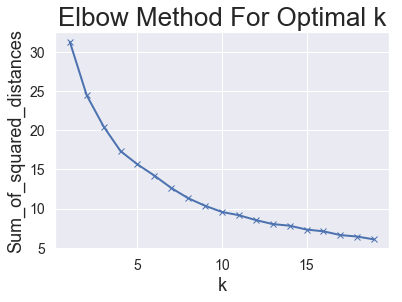

In [190]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

- The optimal _k_ seems to be 12 or 10.

In [191]:
# crime_merged_latlong.reset_index()
crime_merged_latlong['loc_quad'].unique()
crime_merged_latlong_grouped = crime_merged_latlong.groupby(['loc_quad'])[crime_merged_latlong.columns[:-1]].last().reset_index()
crime_merged_latlong_grouped.head()

,loc_quad,latitude,longitude
0,0.0,37.714370,-122.485278
1,1.0,37.718696,-122.485278
2,2.0,37.723013,-122.485278
3,11.0,37.718696,-122.479810
4,12.0,37.723013,-122.479810


In [192]:
crime_merged_latlong_grouped.shape

(305, 3)

In [193]:
crime_merged.shape

(305, 19)

In [194]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
kclusters=20
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
color_list = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', 
              '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
              '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
              '#000075', '#808080', '#ffffff', '#000000']
rainbow2 = [i for i in color_list]


# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(crime_merged_latlong_grouped.latitude, 
                                  crime_merged_latlong_grouped.longitude, 
                                  crime_merged.name, crime_merged['Cluster Labels']):
    label = folium.Popup('<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +'</h6>') # , parse_html=True
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow2[cluster-1],
        fill=True,
        #fill_color=rainbow[cluster-1],
        fill_color=rainbow2[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
folium.LayerControl().add_to(map_clusters)       
map_clusters

In [195]:
for cluster in crime_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = crime_merged.loc[crime_merged['Cluster Labels'] == cluster, crime_merged.columns[[0] + list(range(3, crime_merged.shape[1]))]]
    display(HTML('<h2>Cluster: '+str(cluster)+'</h2>'),cluster_print_df.shape[0], cluster_print_df.head())

27

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
3,11.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
4,12.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
5,13.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
7,21.0,0,Simple Assault,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
8,22.0,0,Simple Assault,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense


52

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
9,23.0,0,Simple Assault,Robbery - Commercial,Aggravated Assault,Robbery - Other,Weapons Offense,Robbery - Street,Sex Offense,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
29,201.0,2,Simple Assault,Robbery - Commercial,Aggravated Assault,Robbery - Other,Prostitution,"Human Trafficking (A), Commercial Sex Acts",Robbery - Street,Weapons Offense,Suicide,Sex Offense,Child Abuse,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child"
30,202.0,2,Simple Assault,Robbery - Commercial,Aggravated Assault,Robbery - Other,Prostitution,Weapons Offense,Sex Offense,Suicide,Robbery - Street,Rape - Attempted,Rape,"Sex Offense, Child",Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
31,203.0,2,Simple Assault,Robbery - Other,Aggravated Assault,Robbery - Commercial,Prostitution,Sex Offense,Robbery - Street,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Weapons Offense,Rape,Rape - Attempted,Suicide
33,211.0,2,Simple Assault,Robbery - Commercial,Aggravated Assault,Prostitution,Robbery - Other,"Human Trafficking (A), Commercial Sex Acts",Weapons Offense,Robbery - Street,Sex Offense,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child",Homicide


95

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
19,112.0,1,Simple Assault,Aggravated Assault,Robbery - Other,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Commercial,Robbery - Street,Sex Offense
24,130.0,1,Simple Assault,Weapons Offense,Child Abuse,Aggravated Assault,Sex Offense,Robbery - Street,Robbery - Other,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
25,131.0,1,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Suicide,Weapons Offense,Sex Offense,Robbery - Commercial,"Sex Offense, Child",Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
28,200.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Robbery - Commercial,Weapons Offense,Sex Offense,Suicide,Child Abuse,Robbery - Carjacking,"Sex Offense, Child",Rape - Attempted,Rape,Prostitution,Manslaughter
32,210.0,2,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Commercial,Weapons Offense,Robbery - Street,Robbery - Carjacking,Rape - Attempted,Sex Offense,"Sex Offense, Child",Suicide,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts"


9

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
0,0.0,0,Prostitution,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"
37,221.0,2,Prostitution,Simple Assault,"Human Trafficking (A), Commercial Sex Acts",Weapons Offense,Robbery - Other,Robbery - Commercial,Aggravated Assault,Robbery - Street,Suicide,Rape - Attempted,Rape,Sex Offense,Manslaughter,"Sex Offense, Child",Homicide
64,411.0,4,Simple Assault,Prostitution,"Human Trafficking (A), Commercial Sex Acts",Aggravated Assault,Robbery - Commercial,Robbery - Other,Robbery - Street,Weapons Offense,Sex Offense,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child",Homicide
129,822.0,8,Prostitution,Simple Assault,"Human Trafficking (A), Commercial Sex Acts",Robbery - Other,Aggravated Assault,Robbery - Commercial,Weapons Offense,Robbery - Street,Sex Offense,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child",Homicide
166,1033.0,10,Simple Assault,Prostitution,"Human Trafficking (A), Commercial Sex Acts",Robbery - Commercial,Aggravated Assault,Robbery - Other,Weapons Offense,Robbery - Street,Sex Offense,Suicide,Rape - Attempted,Rape,Manslaughter,"Sex Offense, Child",Homicide


15

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
1,1.0,0,Aggravated Assault,Simple Assault,Weapons Offense,"Sex Offense, Child",Sex Offense,Robbery - Street,Robbery - Other,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
6,20.0,0,Aggravated Assault,Simple Assault,Robbery - Commercial,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Other,Robbery - Street,Sex Offense
11,31.0,0,Aggravated Assault,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
14,100.0,1,Aggravated Assault,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
21,120.0,1,Aggravated Assault,Simple Assault,Robbery - Other,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Commercial,Robbery - Street,Sex Offense


6

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
46,302.0,3,Robbery - Commercial,Weapons Offense,Child Abuse,Robbery - Other,Rape,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Robbery - Carjacking,Rape - Attempted,Suicide,Robbery - Street,Sex Offense,"Sex Offense, Child"
81,513.0,5,Child Abuse,Aggravated Assault,Robbery - Commercial,Robbery - Other,Robbery - Street,Simple Assault,Sex Offense,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Manslaughter,Homicide,Suicide,Rape - Attempted,Rape
116,731.0,7,Child Abuse,Aggravated Assault,Simple Assault,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Human Trafficking (A), Commercial Sex Acts",Weapons Offense,"Sex Offense, Child",Manslaughter,Homicide,Rape - Attempted,Rape,Prostitution
127,820.0,8,Child Abuse,Aggravated Assault,Robbery - Commercial,Simple Assault,Sex Offense,Robbery - Other,Robbery - Street,Weapons Offense,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Manslaughter,Homicide,Suicide,Rape - Attempted,Rape
164,1031.0,10,Child Abuse,Aggravated Assault,Simple Assault,Robbery - Commercial,Robbery - Other,Sex Offense,Weapons Offense,Robbery - Street,"Human Trafficking (A), Commercial Sex Acts","Sex Offense, Child",Manslaughter,Homicide,Suicide,Rape - Attempted,Rape


2

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
94,613.0,6,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"
96,621.0,6,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"


20

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
22,121.0,1,Simple Assault,Aggravated Assault,Robbery - Street,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Commercial,Robbery - Other,Sex Offense
26,132.0,1,Aggravated Assault,Simple Assault,Robbery - Commercial,Weapons Offense,Sex Offense,Robbery - Street,Robbery - Other,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
54,323.0,3,Aggravated Assault,Robbery - Commercial,Simple Assault,Weapons Offense,Robbery - Other,Sex Offense,Robbery - Street,"Sex Offense, Child",Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
58,333.0,3,Simple Assault,Aggravated Assault,Robbery - Other,Robbery - Street,Robbery - Commercial,Prostitution,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Weapons Offense,Rape,Rape - Attempted,Suicide,Sex Offense
78,510.0,5,Aggravated Assault,Robbery - Street,Robbery - Other,Robbery - Carjacking,Sex Offense,"Sex Offense, Child",Simple Assault,Robbery - Commercial,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide


4

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
2,2.0,0,Simple Assault,Suicide,Weapons Offense,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Robbery - Carjacking,Rape - Attempted,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
100,631.0,6,Simple Assault,Suicide,Weapons Offense,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Robbery - Carjacking,Rape - Attempted,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
177,1123.0,11,Simple Assault,Aggravated Assault,Suicide,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
199,1301.0,13,Simple Assault,Aggravated Assault,Suicide,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense


3

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
12,32.0,0,Robbery - Other,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Street,Sex Offense,"Sex Offense, Child"
175,1120.0,11,Weapons Offense,Robbery - Other,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Street,Sex Offense,"Sex Offense, Child"
246,1611.0,16,Weapons Offense,Robbery - Other,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Street,Sex Offense,"Sex Offense, Child"


3

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
16,102.0,1,Robbery - Commercial,Simple Assault,Aggravated Assault,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Other,Robbery - Street,Sex Offense
23,123.0,1,Robbery - Commercial,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"
27,133.0,1,Robbery - Commercial,Weapons Offense,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child"


69

,loc_quad,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime
10,30.0,0,Simple Assault,Robbery - Street,Weapons Offense,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Robbery - Carjacking,Rape - Attempted,Suicide,Robbery - Commercial,Robbery - Other,Sex Offense
13,33.0,0,Weapons Offense,Simple Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Rape,Robbery - Carjacking,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense
18,111.0,1,Simple Assault,Aggravated Assault,Weapons Offense,Robbery - Street,Sex Offense,Robbery - Commercial,"Sex Offense, Child",Robbery - Other,Suicide,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
42,232.0,2,Simple Assault,Weapons Offense,Aggravated Assault,Robbery - Street,Robbery - Other,Suicide,"Sex Offense, Child",Sex Offense,Robbery - Commercial,Rape - Attempted,Rape,Prostitution,Manslaughter,"Human Trafficking (A), Commercial Sex Acts",Homicide
43,233.0,2,Simple Assault,Aggravated Assault,Robbery - Street,Robbery - Other,Rape,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Prostitution,Weapons Offense,Rape - Attempted,Suicide,Robbery - Commercial,Sex Offense


In [196]:
# dfcrime_daytime_merged.shape

In [197]:
dfcrime_daytime_merged = crime_merged.copy()

In [198]:
dfcrime_part = dfcrime_all_merged[['loc_quad','Cluster Labels']].sort_values(by='Cluster Labels')
# display(df_part)
dfcrime_part2 = dfcrime_daytime_merged[['loc_quad','Cluster Labels']].sort_values(by='Cluster Labels')
# display(df_part2)

In [199]:
dfcrime_all_merged.shape

(311, 19)

In [200]:
dfcrime_part2.head(1)

,loc_quad,Cluster Labels
171,1110.0,0


In [201]:
dfcrime_part4 = dfcrime_part.merge(dfcrime_part2, on='loc_quad')
display(dfcrime_part4.head(4))

,loc_quad,Cluster Labels_x,Cluster Labels_y
0,802.0,0,2
1,1100.0,0,2
2,230.0,0,2
3,710.0,0,11


In [202]:
# Counts for comparison between main-cat included.
dfcrime_part4['Cluster Labels_x'].value_counts().sort_index().to_frame('counts')

,counts
0,59
1,30
2,97
3,5
4,8
5,2
6,47
7,4
8,15
10,2


In [203]:
# Counts for comparison between main-cat included.
dfcrime_part4['Cluster Labels_y'].value_counts().sort_index().to_frame('counts')

,counts
0,27
1,52
2,95
3,9
4,15
5,6
6,2
7,20
8,4
9,3


# To produce a more granular view on the venues :
- Cluster the venues with the quadrant technique.
- Produce a layered view per choosable education location.
- Plot both crime and venues with a different marker combination / colour set.

- Check for correlation between quadrants and crime- and venues clusters.

## Quadrant clustering of Venues :

In [204]:
# DataFrame is per location and has duplicated venues for more accurate Neighbourhood clustering.
uni_venues_clustering.shape

(2078, 13)

In [205]:
uni_venues_clustering.columns

Index(['index', 'Venue', 'venue_id', 'Venue Latitude', 'Venue Longitude',
       'Venue Category', 'Venue Category Plural', 'Venue Category Short',
       'sub_id', 'uni_loc', 'main_category', 'main_id', 'sub_category'],
      dtype='object')

In [206]:
# Creates bounded box df, with duplicates.
venues_merged_latlong = pd.DataFrame()
dfvenue_quadrants = pd.DataFrame()
for index, row in df_uni.iterrows():
    # Explicit use of .copy() to let Pandas know a Copy is wanted, and it is not intended to be a View of the original DataFrame
    dftemp= uni_venues_clustering.loc[(uni_venues_clustering['Venue Latitude'] >= df_uni['latMin'][index]) &
                                      (uni_venues_clustering['Venue Latitude'] <= df_uni['latMax'][index]) & 
                                      (uni_venues_clustering['Venue Longitude'] >= df_uni['longMin'][index] ) & 
                                      (uni_venues_clustering['Venue Longitude'] <= df_uni['longMax'][index] ) ].copy() 
    dftemp.reset_index(inplace=True)
    dftemp.loc[:,'uni_loc'] = index
    dftemp.loc[:,'uni_loc_q'] = index * 100
    # Adding Quadrant identifiers with format: loc_id *100, longq*10, latq, --> 
    # this results in: {loc_id x00, lat_quadrant x0, long_quadrand x}
#     display(dftemp.head())
    
    latcat, latbins, longcat, longbins = calculate_quadrant(index, 4)
    lat_quad = pd.cut(dftemp['Venue Latitude'],latbins, labels=latcat.categories*1,  precision = 6).to_frame(name='latq')
    long_quad = pd.cut(dftemp['Venue Longitude'],longbins, labels=longcat.categories*10,  precision = 6).to_frame(name='longq')
    
    # get center of quadrants from IntervalIndex.
    
    loc_lat = pd.cut(dftemp['Venue Latitude'],latbins, precision = 6).to_frame(name='Venue Latitude')
    loc_lat.reset_index(inplace=True)
#     loc_lat = pd.DataFrame(pd.cut(dftemp['Latitude'],latbins, precision = 6)).set_index('Latitude')
    loc_lat.set_index('Venue Latitude',inplace=True)
    loc_lat['latitude'] = pd.IntervalIndex(loc_lat.index.get_level_values('Venue Latitude')).mid
    loc_lat.reset_index(inplace=True)
    loc_lat.drop(columns='Venue Latitude',inplace=True)
#     print(loc_lat.head(2))
#     print('nu')
    loc_long = pd.cut(dftemp['Venue Longitude'],longbins, precision = 6).to_frame()
    loc_long.reset_index(inplace=True)
    loc_long.set_index('Venue Longitude', inplace = True)
    loc_long['longitude'] = pd.IntervalIndex(loc_long.index.get_level_values('Venue Longitude')).mid
    loc_long.reset_index(inplace=True)
    loc_long.drop(columns='Venue Longitude',inplace=True)
#     print(loc_long.head(2))

    loc_lat = loc_lat.merge(loc_long, on='index')
#     display(loc_lat.head(1))

    
    dftempy = pd.merge(lat_quad, long_quad,  left_index=True, right_index=True)
    dftemp = dftemp.merge(dftempy, left_index=True, right_index=True)
    dftemp['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    dfvenue_quadrants = dfvenue_quadrants.append( dftemp,ignore_index=True)
    
    loc_lat['loc_quad'] = dftemp[['latq', 'longq', 'uni_loc_q']].sum(axis=1)
    venues_merged_latlong = venues_merged_latlong.append(loc_lat, ignore_index=True)
# df2.shape
dfvenue_quadrants_clustering = dfvenue_quadrants.copy()
# verify if crime DataFrames contain all crimes.

# crime_clustering.tail()
venues_merged_latlong.set_index('index',inplace=True)

In [207]:
dfvenue_quadrants_clustering.columns

Index(['level_0', 'index', 'Venue', 'venue_id', 'Venue Latitude',
       'Venue Longitude', 'Venue Category', 'Venue Category Plural',
       'Venue Category Short', 'sub_id', 'uni_loc', 'main_category', 'main_id',
       'sub_category', 'uni_loc_q', 'latq', 'longq', 'loc_quad'],
      dtype='object')

In [208]:
# one hot encoding
uni_venues_onehot_subcats = pd.get_dummies(dfvenue_quadrants_clustering[['Venue Category']], prefix="", prefix_sep="")

#### A simple copy suffices, to not break existing code....
uni_venues_onehot = uni_venues_onehot_subcats.copy()
uni_venues_onehot['uni_loc'] = dfvenue_quadrants_clustering['uni_loc']
uni_venues_onehot['loc_quad'] = dfvenue_quadrants_clustering['loc_quad']

# move neighborhood column to the first column
fixed_columns = [uni_venues_onehot.columns[-1]] + [uni_venues_onehot.columns[-2]] + list(uni_venues_onehot.columns[:-2])
uni_venues_onehot = uni_venues_onehot[fixed_columns]

################# ADD Count
# Mean calculation (quadrant variant/style)
uni_venues_grouped = uni_venues_onehot.groupby(['loc_quad','uni_loc'])[uni_venues_onehot.columns[2:]].mean().reset_index()
################ for adding counts to quadrantised-clusters, for density estimations and inferential statistics.
uni_venues_grouped_counts = uni_venues_onehot[['loc_quad','uni_loc']].groupby(['loc_quad','uni_loc']).size().reset_index(name='counts')
# crimedf_tod_distr = df1[['Incident Category','timeofday']].groupby(['Incident Category','timeofday']).size().reset_index(name='counts')

#################

# Top 10 tot DataFrame    
num_top_venues = 15

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['loc_quad','uni_loc']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
uni_venues_sorted = pd.DataFrame(columns=columns)
uni_venues_sorted[['loc_quad','uni_loc']] = uni_venues_grouped[['loc_quad','uni_loc']]

for ind in np.arange(uni_venues_grouped.shape[0]):
    uni_venues_sorted.iloc[ind, 2:] = return_most_common_venues(uni_venues_grouped.iloc[ind, 1:], num_top_venues)

# display(uni_venues_sorted[14:16])

#### create the merged dataframe, a bit more early for storing the %-represented results.
df_uni_merged = uni_venues_grouped.loc[:,['loc_quad','uni_loc']] # implies a copy
df_uni_merged = df_uni_merged.join(df_uni[['name']], on='uni_loc')

# K-Means
# set number of clusters
kclusters = 20

uni_venues_grouped_clustering = uni_venues_grouped.drop(['uni_loc','loc_quad'], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(uni_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
display(kmeans.labels_[0:] )

# add clustering labels
df_uni_merged['Cluster Labels'] = kmeans.labels_

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
df_uni_merged = df_uni_merged[['loc_quad','name','Cluster Labels']].merge(uni_venues_sorted, on='loc_quad')

array([15, 12,  4,  9,  0,  9, 18,  7,  8,  4,  7, 14,  4,  0,  9,  4,  3,
       15,  2,  2,  4, 18, 12, 14, 14,  2,  4, 12, 12, 12,  4,  2, 12, 14,
        7,  4,  4, 14,  0,  5,  9,  0,  5, 12, 12,  2,  4,  0, 14, 12, 12,
       14, 13, 14, 14, 14,  4, 12, 12, 14, 12,  2, 14,  2,  9, 17,  4, 12,
       11, 17,  4,  2,  0,  0,  0,  2, 14,  6,  9, 14,  9, 12,  2,  6, 18,
        9,  9, 14, 18, 14,  9,  4,  4, 19,  9,  5, 12,  1, 12, 14,  4,  2,
        9, 17,  3, 14, 14, 12,  1,  2, 12,  3, 14, 14, 12, 14, 14, 14, 14,
        4, 14, 12, 12, 14,  4,  4,  9,  5,  4, 14,  9,  1,  2,  1,  4, 14,
        4,  2,  5, 12, 14, 14,  1, 12,  1, 14,  9, 12,  2, 12, 17,  9,  2,
       14,  9, 14, 17,  9,  0, 17,  0, 11, 14, 10,  5,  4,  4,  7,  1,  9,
        4, 18,  2,  2, 12, 18, 14, 14, 12, 14, 14, 12, 14, 12,  4, 14, 16,
        9,  4, 14,  2,  9,  9, 14,  9,  9,  4,  9, 14,  4,  4,  9,  5,  2,
        2, 17, 14, 12,  1,  4, 14, 14, 16, 12, 14,  2, 15, 12, 14,  4, 14,
       14,  9,  0, 11,  2

In [209]:
uni_venues_grouped_counts.head(4)

,loc_quad,uni_loc,counts
0,0.0,0,2
1,12.0,0,4
2,13.0,0,9
3,21.0,0,2


# Finding the optimal 'K' with the elbow-method.

In [210]:
Sum_of_squared_distances = []
K = range(1,21)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(uni_venues_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

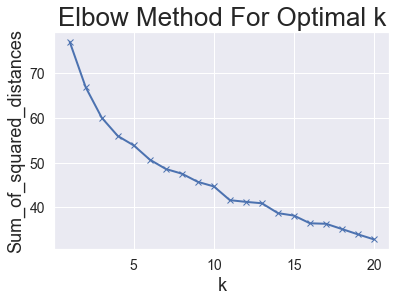

In [211]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [212]:
# crime_merged_latlong.reset_index()
venues_merged_latlong['loc_quad'].unique()
venues_merged_latlong_grouped = venues_merged_latlong.groupby(['loc_quad'])[venues_merged_latlong.columns[:-1]].last().reset_index()
venues_merged_latlong_grouped.head()

,loc_quad,latitude,longitude
0,0.0,37.714370,-122.485278
1,12.0,37.723013,-122.479810
2,13.0,37.727331,-122.479810
3,21.0,37.718696,-122.474351
4,22.0,37.723013,-122.474351


In [213]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
kclusters=20
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
color_list = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', 
              '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
              '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
              '#000075', '#808080', '#ffffff', '#000000']
rainbow2 = [i for i in color_list]


# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(venues_merged_latlong_grouped.latitude, 
                                  venues_merged_latlong_grouped.longitude, 
                                  df_uni_merged.name, df_uni_merged['Cluster Labels']):
    label = folium.Popup('<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +'</h6>') # , parse_html=True
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow2[cluster-1],
        fill=True,
        #fill_color=rainbow[cluster-1],
        fill_color=rainbow2[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
folium.LayerControl().add_to(map_clusters)       
map_clusters

In [214]:
for cluster in df_uni_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = df_uni_merged.loc[df_uni_merged['Cluster Labels'] == cluster, df_uni_merged.columns[[0] + list(range(3, df_uni_merged.shape[1]))]]
    display(HTML('<h2>Cluster: '+str(cluster)+'</h2>'),cluster_print_df.shape[0], cluster_print_df.head(4))

13

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
4,22.0,0,Café,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
13,121.0,1,Café,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
38,311.0,3,Café,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
41,321.0,3,Café,Park,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Food Court,Dumpling Restaurant,Donut Shop,Dive Bar,Diner


11

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
97,712.0,7,Coffee Shop,Theater,Art Museum,Southern / Soul Food Restaurant,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Yoga Studio,Donut Shop,Food & Drink Shop
108,801.0,8,Coffee Shop,Theater,Dance Studio,Bakery,Electronics Store,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Truck,Donut Shop
131,921.0,9,Bakery,Coffee Shop,Dance Studio,Dessert Shop,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Electronics Store,Deli / Bodega,Food Truck,Dumpling Restaurant
133,923.0,9,Theater,Dance Studio,Coffee Shop,Bakery,Electronics Store,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Truck,Donut Shop


33

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
18,200.0,2,Coffee Shop,Japanese Restaurant,Breakfast Spot,Coworking Space,Bakery,Marijuana Dispensary,Yoga Studio,Ethiopian Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Dumpling Restaurant,Electronics Store
19,201.0,2,Coffee Shop,Tea Room,Gastropub,Cocktail Bar,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Electronics Store,Food Court,Donut Shop
25,213.0,2,Coffee Shop,Food Truck,New American Restaurant,Restaurant,Bakery,Sandwich Place,Garden,Japanese Restaurant,Men's Store,Sushi Restaurant,Yoga Studio,Electronics Store,Farmers Market,Exhibit,Ethiopian Restaurant
31,231.0,2,Coffee Shop,Juice Bar,Spa,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Donut Shop,Dumpling Restaurant,Dive Bar,Diner


4

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
16,132.0,1,Sandwich Place,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Yoga Studio,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
104,731.0,7,Sandwich Place,Coffee Shop,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Yoga Studio,Cupcake Shop,Donut Shop,Dive Bar,Diner
111,810.0,8,Clothing Store,Sandwich Place,Coffee Shop,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Yoga Studio,Cycle Studio,Donut Shop,Dive Bar
237,1710.0,17,Deli / Bodega,Sandwich Place,Coffee Shop,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Yoga Studio,Cupcake Shop,Donut Shop,Dive Bar


36

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
2,13.0,0,Café,Bakery,Food Court,Gift Shop,Snack Place,Bubble Tea Shop,Furniture / Home Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Yoga Studio,Food & Drink Shop,Electronics Store
9,102.0,1,Café,Yoga Studio,Asian Restaurant,Chinese Restaurant,Coffee Shop,Bakery,BBQ Joint,Bar,Japanese Restaurant,Dumpling Restaurant,Electronics Store,Donut Shop,Dive Bar,Ethiopian Restaurant,Exhibit
12,112.0,1,Bubble Tea Shop,Café,Gastropub,Food Truck,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Donut Shop,Dive Bar
15,131.0,1,Dessert Shop,Café,BBQ Joint,Yoga Studio,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Electronics Store,Food Truck,Dumpling Restaurant,Donut Shop


7

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
39,313.0,3,Coffee Shop,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
42,322.0,3,Coffee Shop,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
95,710.0,7,Coffee Shop,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
127,911.0,9,Coffee Shop,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant


2

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
77,600.0,6,Garden,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
83,613.0,6,Garden,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant


4

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
7,33.0,0,Playground,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
10,110.0,1,Playground,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
34,300.0,3,Playground,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
167,1133.0,11,Playground,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant


1

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
8,101.0,1,Beer Garden,Yoga Studio,Food Truck,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Donut Shop,Dive Bar,Diner


32

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
3,21.0,0,Burger Joint,Nightclub,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Yoga Studio,Food Court,Dumpling Restaurant,Donut Shop,Dive Bar,Diner
5,23.0,0,Bakery,Cosmetics Shop,Coffee Shop,Candy Store,Japanese Restaurant,Grocery Store,Lingerie Store,Fast Food Restaurant,Electronics Store,Dessert Shop,Pizza Place,Hobby Shop,Clothing Store,Chinese Restaurant,Sandwich Place
14,123.0,1,Bar,Cantonese Restaurant,Dumpling Restaurant,Yoga Studio,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Food Truck,Electronics Store,Donut Shop,Dive Bar
40,320.0,3,Supermarket,Bookstore,Deli / Bodega,Coffee Shop,Yoga Studio,Exhibit,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Electronics Store,Ethiopian Restaurant,Food Truck,Dumpling Restaurant


2

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
163,1123.0,11,Gym / Fitness Center,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant
258,1821.0,18,Gym / Fitness Center,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant


3

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
68,511.0,5,Brewery,Yoga Studio,Coffee Shop,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Electronics Store,Food Truck,Dumpling Restaurant,Donut Shop,Dive Bar
161,1121.0,11,Brewery,Coffee Shop,Yoga Studio,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Electronics Store,Food Truck,Dumpling Restaurant,Donut Shop,Dive Bar
224,1612.0,16,Brewery,Yoga Studio,Food Truck,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Donut Shop,Dive Bar,Diner


46

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
1,12.0,0,Café,Juice Bar,Coffee Shop,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar
22,210.0,2,Café,American Restaurant,Coffee Shop,Pizza Place,Yoga Studio,Ethiopian Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Dumpling Restaurant,Electronics Store,Food Court,Donut Shop
27,221.0,2,Coffee Shop,Café,Moroccan Restaurant,French Restaurant,Art Museum,Fried Chicken Joint,Bakery,Vietnamese Restaurant,Sandwich Place,Exhibit,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Yoga Studio
28,222.0,2,Coffee Shop,Cycle Studio,Juice Bar,Café,Street Food Gathering,Bookstore,Park,Diner,Dive Bar,Donut Shop,Dumpling Restaurant,Food & Drink Shop,Electronics Store,Ethiopian Restaurant,Dim Sum Restaurant


1

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
52,410.0,4,Tea Room,Pizza Place,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner


63

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
11,111.0,1,Coffee Shop,Poke Place,Café,Fast Food Restaurant,Grocery Store,Burger Joint,Pakistani Restaurant,Electronics Store,Filipino Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Donut Shop,Dumpling Restaurant,Dive Bar
23,211.0,2,Coffee Shop,Café,Dessert Shop,Grocery Store,Tea Room,Dim Sum Restaurant,Burger Joint,Sandwich Place,Garden,Boutique,Exhibit,Liquor Store,Hotel,Art Museum,Electronics Store
24,212.0,2,Café,Coffee Shop,Tea Room,Wine Shop,New American Restaurant,Bakery,French Restaurant,Library,Russian Restaurant,Chocolate Shop,Men's Store,Bubble Tea Shop,Mediterranean Restaurant,Boutique,Sushi Restaurant
33,233.0,2,Coffee Shop,Café,Farmers Market,Bakery,Middle Eastern Restaurant,Chocolate Shop,Liquor Store,Seafood Restaurant,Wine Bar,Dessert Shop,Ice Cream Shop,Vietnamese Restaurant,Pier,Gym,Public Art


3

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
0,0.0,0,Trail,Church,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner
17,133.0,1,Trail,Yoga Studio,Electronics Store,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Truck,Donut Shop,Dive Bar,Diner
216,1513.0,15,Trail,Yoga Studio,Electronics Store,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Truck,Donut Shop,Dive Bar,Diner


2

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
186,1311.0,13,Ice Cream Shop,Monument / Landmark,Food Truck,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Donut Shop,Dive Bar,Diner
212,1503.0,15,Monument / Landmark,Yoga Studio,Food Truck,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Donut Shop,Dive Bar,Diner


8

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
65,501.0,5,Sporting Goods Shop,Coffee Shop,Yoga Studio,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner
69,513.0,5,Spanish Restaurant,Gym / Fitness Center,Sporting Goods Shop,Coffee Shop,Flower Shop,Yoga Studio,Gym,Donut Shop,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Dive Bar
103,730.0,7,Miscellaneous Shop,Spanish Restaurant,Sporting Goods Shop,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Electronics Store,Food Truck,Dumpling Restaurant,Donut Shop,Dive Bar
150,1030.0,10,Spanish Restaurant,Gym / Fitness Center,Sporting Goods Shop,Coffee Shop,Yoga Studio,Hawaiian Restaurant,Donut Shop,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Dive Bar,Flower Shop


8

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
6,31.0,0,Speakeasy,Park,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner,Dim Sum Restaurant
21,203.0,2,Tea Room,Hotel,History Museum,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Dumpling Restaurant,Food Court,Dive Bar
84,620.0,6,Mountain,Scenic Lookout,Park,Deli / Bodega,Electronics Store,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Dance Studio,Dessert Shop,Cupcake Shop,Dumpling Restaurant
88,631.0,6,Park,Wine Bar,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Dumpling Restaurant,Food Court,Donut Shop,Dive Bar,Diner


1

,loc_quad,uni_loc,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
93,702.0,7,Concert Hall,Yoga Studio,Dumpling Restaurant,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Exhibit,Ethiopian Restaurant,Electronics Store,Donut Shop,Food Court,Dive Bar,Diner,Dim Sum Restaurant


# 20 clusters seems to produce quite homogeneous clusters.
- _Notes:_ with more _smaller sized_ Neighbourhoods and therefore less venues _per_ Neighbourhood,  
  a higher cluster count makes sense with the goal of increased precision in mind.

# Automatic naming of the clusters based on :
- The 4 most common venues columns,  
  most occuring venue per column.

In [215]:
venue_cluster_names = pd.DataFrame()
for cluster in df_uni_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = df_uni_merged.loc[df_uni_merged['Cluster Labels'] == cluster, df_uni_merged.columns[[0] + list(range(3, df_uni_merged.shape[1]))]]

    first = cluster_print_df['1st Most Common Venue'].value_counts().head(1).index.values[0]
    second = cluster_print_df['2nd Most Common Venue'].value_counts().head(1).index.values[0]
    third = cluster_print_df['3rd Most Common Venue'].value_counts().head(1).index.values[0]
    fourth = cluster_print_df['4th Most Common Venue'].value_counts().head(1).index.values[0]
    clust_name = first+','+second+','+third+','+fourth
    venue_cluster_names.loc[cluster, 'cluster_name'] = clust_name
display(venue_cluster_names)

,cluster_name
0,"Café,Yoga Studio,Electronics Store,Flower Shop"
1,"Coffee Shop,Dance Studio,Theater,Bakery"
2,"Coffee Shop,Japanese Restaurant,Grocery Store,..."
3,"Sandwich Place,Sandwich Place,Coffee Shop,Dump..."
4,"Café,Café,Coffee Shop,Coffee Shop"
5,"Coffee Shop,Yoga Studio,Dumpling Restaurant,Fl..."
6,"Garden,Yoga Studio,Electronics Store,Flower Shop"
7,"Playground,Yoga Studio,Dumpling Restaurant,Flo..."
8,"Beer Garden,Yoga Studio,Food Truck,Food & Drin..."
9,"Bakery,Donut Shop,Coffee Shop,Food & Drink Shop"


## The automatic naming has a few implications :
- Repetitive naming in the clustername that should be interpreted.
- _Possible cause:_ semi-overlapping clusters between education locations and duplicate venues in those quadrant neighbourhoods.
- _Interpretation method:_ from most to least _occuring_ venue type.

- This still gives a typification of the neighbourhood venues.

# Automatic naming of the quadrant crime incident clusters :

In [216]:
crime_cluster_names = pd.DataFrame()
for cluster in crime_merged['Cluster Labels'].sort_values().unique():
    cluster_print_df = crime_merged.loc[crime_merged['Cluster Labels'] == cluster, crime_merged.columns[[0] + list(range(3, crime_merged.shape[1]))]]

    first = cluster_print_df['1st Most Common Crime'].value_counts().head(1).index.values[0]
    second = cluster_print_df['2nd Most Common Crime'].value_counts().head(1).index.values[0]
    third = cluster_print_df['3rd Most Common Crime'].value_counts().head(1).index.values[0]
    fourth = cluster_print_df['4th Most Common Crime'].value_counts().head(1).index.values[0]
    clust_name = first+','+second+','+third+','+fourth
    crime_cluster_names.loc[cluster, 'cluster_name'] = clust_name
display(crime_cluster_names)

,cluster_name
0,"Simple Assault,Weapons Offense,Rape - Attempte..."
1,"Simple Assault,Robbery - Commercial,Robbery - ..."
2,"Simple Assault,Aggravated Assault,Robbery - Ot..."
3,"Prostitution,Simple Assault,Human Trafficking ..."
4,"Aggravated Assault,Simple Assault,Rape - Attem..."
5,"Child Abuse,Aggravated Assault,Robbery - Comme..."
6,"Aggravated Assault,Rape - Attempted,Child Abus..."
7,"Aggravated Assault,Simple Assault,Robbery - Ot..."
8,"Simple Assault,Suicide,Suicide,Rape"
9,"Weapons Offense,Robbery - Other,Rape - Attempt..."


In [217]:
# Merge quad_loc lat/lang into the DataFrame for both crimes and venues
df_uni_merged2 = df_uni_merged.merge(venues_merged_latlong_grouped)
# add per neighbourhood venue counts from DataFrame to new merged2
df_uni_merged2 = df_uni_merged2.merge(uni_venues_grouped_counts)
# Merge crime with neighbourhood lat/long DataFrame
crime_merged2 = crime_merged.merge(crime_merged_latlong_grouped)
# add per neighbourhood crime counts from DataFrame to new merged2
crime_merged2 = crime_merged2.merge(crime_grouped_counts)

In [218]:
# create map, with 'stamenterrain' for better 'rainbow-color' visibility.
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner'  )
folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
folium.TileLayer('stamenterrain').add_to(map_clusters)
# set color scheme for the clusters
kclusters=20
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
# This colourlist aims to provide 22 clearly distinguishable colours.
colour_list = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', 
              '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
              '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
              '#000075', '#808080', '#ffffff', '#000000']
# Not needed since no conversion is calculated.
# rainbow2 = [i for i in color_list]

uni_group = folium.map.FeatureGroup(name='Universities', overlay=True, control=True, show=True)

# add markers to the map
markers_colors = []
for uniloc in df_uni_merged.uni_loc.unique():
    # uniloc is per uniloc iteration, create subsets:
    df_uni_merged_sub = df_uni_merged2.loc[df_uni_merged2['uni_loc'] == uniloc].copy()
    # Get uni_loc name for FeatureGroup switchable Layers
    uni_name = df_uni_merged_sub.name.iloc[0]
    # Create a subgroup for each uni_loc, that will be added to the main map_clusters-folium map.
    uni_sub_group = folium.FeatureGroup(name=uni_name, overlay=True, control=True, show=True)
    for lat, lon, poi, size, cluster in zip(df_uni_merged_sub.latitude, 
                                      df_uni_merged_sub.longitude, 
                                      df_uni_merged_sub.name, 
                                      df_uni_merged_sub.counts,
                                      df_uni_merged_sub['Cluster Labels']):
        labelstr = '<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +' size : '+str(size)\
                    +'</h6><i>'+ str(venue_cluster_names.cluster_name.iloc[cluster])+'</i>'
        label = folium.Popup(labelstr) 
        folium.CircleMarker(
            [lat, lon],
            radius=10,
            popup=label,
            color=colour_list[cluster-1],
            fill=True,
            fill_color=colour_list[cluster-1],
            fill_opacity=0.9).add_to(uni_sub_group)
    # Create crime subset.
    crime_merged_sub = crime_merged2.loc[crime_merged2['uni_loc'] == uniloc].copy()
    for lat, lon, poi, size, cluster in zip(crime_merged_sub.latitude, 
                                      crime_merged_sub.longitude,
                                      crime_merged_sub.name,
                                      crime_merged_sub.counts,
                                      crime_merged_sub['Cluster Labels']
                                     ):
        labelstr = '<h4>'+ poi + '</h4> <h6>Cluster : ' + str(cluster) +' size : '+str(size)\
                    +'</h6><i>'+ str(crime_cluster_names.cluster_name.iloc[cluster])+'</i>'
        label = folium.Popup(labelstr)
        # folium.plugins.BeautifyIcon enables main and background icon colours with hex-colour codes.
        # This plugin actually defaults to FontAwesome instead of GlyphIcon of BootStrap. prefix='' is possible.
        bicon = plugins.BeautifyIcon(icon='crosshairs', icon_shape='marker', background_color=colour_list[cluster-1], border_width=1, 
                                border_color=colour_list[cluster-1], text_color='white')
        folium.Marker([lat, lon], 
                      popup = labelstr,
                      icon = bicon,
                     ).add_to(uni_sub_group)
    # Add University marker for Analysis Neighbourhood main center.
    unilat = df_uni.latitude.iloc[uniloc]
    unilng = df_uni.longitude.iloc[uniloc]
    folium.Marker([
        unilat, unilng], 
        popup='<h4>'+uni_name+'</h4>',
        icon=folium.Icon(prefix='fa',icon='university',color='green')
    ).add_to(uni_sub_group)    
    uni_sub_group.add_to(map_clusters)

# Add Folium LayerControl for semi-auto layer-assignment with human-readable-names.
folium.LayerControl().add_to(map_clusters)

# Display map
map_clusters

In [219]:
crime_merged2.head(1)

,loc_quad,name,Cluster Labels,uni_loc,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime,11th Most Common Crime,12th Most Common Crime,13th Most Common Crime,14th Most Common Crime,15th Most Common Crime,latitude,longitude,counts
0,0.0,San Francisco State University,3,0,Prostitution,Aggravated Assault,Rape - Attempted,Child Abuse,Homicide,"Human Trafficking (A), Commercial Sex Acts",Manslaughter,Rape,Weapons Offense,Suicide,Robbery - Commercial,Robbery - Other,Robbery - Street,Sex Offense,"Sex Offense, Child",37.71437,-122.485278,8


In [220]:
# DataFrame.merge does an inner-join, therefore loc_quad's that do not exist in both DataFrames will be ignored.
crimeCor = crime_merged2[['loc_quad','Cluster Labels', 'counts']].merge(df_uni_merged2[['loc_quad','Cluster Labels', 'counts']], on='loc_quad')
# crimeCor.head()

In [221]:
crimeCor_dummy = pd.get_dummies(crimeCor['Cluster Labels_x'])

In [222]:
crimeCor_dummy=crimeCor_dummy.join(crimeCor[['counts_x']])
crimeCor_dummy=crimeCor_dummy.join(crimeCor[['counts_y']])

# crimeCor_dummy.head()

In [223]:
crimeCor_dummy.corr()

,0,1,2,3,4,5,6,7,8,9,10,11,counts_x,counts_y
0,1.000000,-0.140706,-0.207378,-0.054241,-0.060193,-0.040129,-0.025240,-0.073293,-0.025240,-0.017815,-0.030969,-0.159095,-0.199234,-0.155735
1,-0.140706,1.000000,-0.335562,-0.087769,-0.097399,-0.064933,-0.040841,-0.118596,-0.040841,-0.028826,-0.050111,-0.257435,0.191135,0.425291
2,-0.207378,-0.335562,1.000000,-0.129358,-0.143551,-0.095701,-0.060193,-0.174792,-0.060193,-0.042485,-0.073856,-0.379418,0.209448,-0.070365
3,-0.054241,-0.087769,-0.129358,1.000000,-0.037547,-0.025031,-0.015744,-0.045718,-0.015744,-0.011112,-0.019318,-0.099240,0.036946,0.287720
4,-0.060193,-0.097399,-0.143551,-0.037547,1.000000,-0.027778,-0.017471,-0.050735,-0.017471,-0.012332,-0.021437,-0.110129,-0.130044,-0.150024
5,-0.040129,-0.064933,-0.095701,-0.025031,-0.027778,1.000000,-0.011648,-0.033823,-0.011648,-0.008221,-0.014292,-0.073419,0.168404,-0.074583
6,-0.025240,-0.040841,-0.060193,-0.015744,-0.017471,-0.011648,1.000000,-0.021274,-0.007326,-0.005171,-0.008989,-0.046178,-0.063315,-0.072613
7,-0.073293,-0.118596,-0.174792,-0.045718,-0.050735,-0.033823,-0.021274,1.000000,-0.021274,-0.015015,-0.026103,-0.134096,-0.145699,-0.169952
8,-0.025240,-0.040841,-0.060193,-0.015744,-0.017471,-0.011648,-0.007326,-0.021274,1.000000,-0.005171,-0.008989,-0.046178,-0.061429,-0.067670
9,-0.017815,-0.028826,-0.042485,-0.011112,-0.012332,-0.008221,-0.005171,-0.015015,-0.005171,1.000000,-0.006345,-0.032593,-0.044356,-0.048460


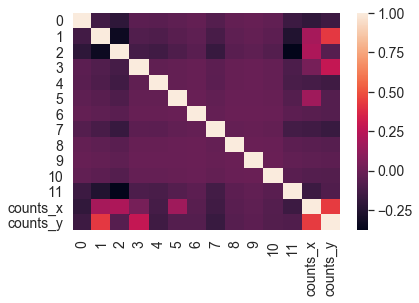

In [224]:
corr = crimeCor_dummy.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [225]:
# crimeCor_dummy = pd.get_dummies(crimeCor['Cluster Labels_x'])
unicorr_dummy = pd.get_dummies(crimeCor['Cluster Labels_y'])
# display(unicorr_dummy.head())
unicorr_dummy = unicorr_dummy.join(crimeCor[['counts_y']])
# display(unicorr_dummy.head())


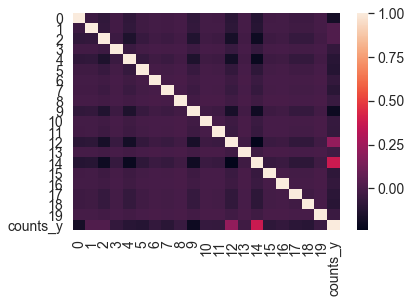

In [226]:
corr = unicorr_dummy.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [227]:
unicorr_dummy = unicorr_dummy.join(crimeCor[['counts_x']])
display(unicorr_dummy.head())

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,counts_y,counts_x
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2,8
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,4,1
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,2
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,10
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2


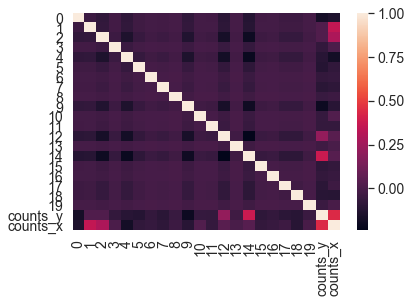

In [228]:
corr = unicorr_dummy.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [229]:
unicorr_dummy[['counts_x','counts_y']].corr()

,counts_x,counts_y
counts_x,1.000000,0.439088
counts_y,0.439088,1.000000


## Correlation Results of K-Means clustering
- No mention worthy results, since 0.43 is too weak because of the overlapping clusters

# DBSCAN clustering
- only _Business Hours_ incidents will be clustered.
- the _df1_ DataFrame is _filtered_ on the _Bounding Boxes_, without duplicates.  
  This might produce a more insightful result, and a less cluttered display.

- Where K-Means tries to find representative clusters of certain regions(Neighbourhoods),  
  where in this case the incidents belonging to a region are already partitioned in the 4x4 quadrants.
  The DBSCAN tries to find Density based clusters, without pre-determined size or quadrants.  
  After clustering these clusters can be _named_.

- Some Epsilon tweaking has to be performed, since it is only geo-location-based points, without _'real'_ continuous values 
  This tweaking will be performed on visual plot analysis and already plotted density _knowledge_
- Also try K-Means with only Location Based data-points, it might find similar sized clusters.

In [230]:
# Select only daytime events of df1
df1_daytime = df1.loc[df1.timeofday == 'Business Hours'].copy()
df1_daytime.head(2)

,index,Incident Datetime,Incident Date,Incident Day of Week,Report Datetime,Incident Category,Incident Subcategory,Incident Description,Intersection,Analysis Neighborhood,Latitude,Longitude,uni_loc,timeofday,dayname,monthname,month
0,551,2018-10-27 08:00:00,2018-10-27,5,2018-10-27 08:16:00,Robbery,Robbery - Street,"Robbery, Street or Public Place, W/ Force",ARCH ST \ RANDOLPH ST,Oceanview/Merced/Ingleside,37.714273,-122.467094,0,Business Hours,Saturday,October,10
1,2417,2018-10-31 12:00:00,2018-10-31,2,2018-10-31 12:15:00,Assault,Simple Assault,Battery,20TH AVE \ WINSTON DR,Lakeshore,37.726950,-122.476039,0,Business Hours,Wednesday,October,10


#### This method in the cell belowwill keep the index,  
#### so after fitting DBSCAN the actual categories can be added for naming the clusters


In [231]:
dfdbscan = df1_daytime[['Latitude','Longitude']].copy()

In [232]:
# # import mglearn
# from sklearn.cluster import DBSCAN
# from sklearn.preprocessing import StandardScaler

### Scale the latitudes and longitudes to standarised values ideal of DBSCAN

In [233]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(dfdbscan)

# _Tweaking Epsilon and Minimum Samples_
- To create a reasonable amount of clusters, based on visual analysis and amount of resulting clusters.
- The statistical crime plots already showed the _general_ observeable density of crime incidents.
- With 135 clusters, based on density and radius, gives about 135/20=6.75 clusters per education location,  
  or 135 reasonable sized neighbourhoods.
- The _nice_ trend that can be observed in the DBSCAN-cluster plot below is that the clusters do _not_ have similar shapes,  
  but have more densely areas of incidents in one cluster with an _odd_ shape (e.g. not square or circle forms).  
- Cluster label _**-1**_ means an outlier

# K-Means for determining Neighbourhoods, not in size dependent _quadrants_.
- The K-Means plot below, based on pure locational data, could also be used, instead of the previously applied _quadrant_ method.  
  Then these Neighbourhoods could be further analysed with the exact same method that was previously applied :  
  - Calculate the mean occurences per cluster,  
  - Apply K-Means __again__ for typification of the neighbourhood clusters.
- This 2 times K-Means would produce somewhat similar results,  
  with less predictable granularity __and__ less overlap between education locations.  
  This would result in a less cluttered incident neighbourhood mapping.  
  For the purpose of neighbourhood _exploration_ this does not really matter,  
  The already applied method gives _nicer_ means to filter on a __*per*__ education location basis.

# The next part will explore each DBSCAN Neighbourhood : 
- Determine per clusterlabel, the 4 most occuring incidents.
- Collect the *core_samples* for marker locations.
- Plot these together with the venue quadrant-clusters.

- _Note_: The venues will not be analysed with DBSCAN,  
  because the venue density is quite limited in comparison to crime incidents.  
  Furthermore, this is quite logical since a single location cannot have multiple venues.



### Calculate amount of clusters, versus amount of outliers for varying epsilon and minimumSamples.

In [234]:
minimumSampleRange_max = 40
epsilon_min = 0.04
epsilon_max = 0.07
epsilon_step = 0.005
epsilon_range = np.arange(epsilon_min, epsilon_max, epsilon_step)
minimumSampleRange = np.arange(4, minimumSampleRange_max, 1)

templist = []
for epsilon in epsilon_range:
    
    for minimumSamples in minimumSampleRange:
        db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(X_scaled)
        labels = db.labels_
        unique_labels = set(labels)
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
#         core_samples_mask
        outlier_count = len(core_samples_mask) - np.count_nonzero(core_samples_mask)
        templist.append([epsilon,minimumSamples,n_clusters_,outlier_count])

dbscan_ranges = pd.DataFrame(templist, columns=['epsilon','minimumSamples','n_clusters','outlier_count'])
print('For completeness reasons, a somewhat minimal outlier count would be ideal')
display(dbscan_ranges.loc[dbscan_ranges.outlier_count <= 800])

For completeness reasons, a somewhat minimal outlier count would be ideal


,epsilon,minimumSamples,n_clusters,outlier_count
36,0.045,4,233,765
72,0.050,4,215,728
108,0.055,4,211,681
144,0.060,4,171,528
145,0.060,5,141,673
180,0.065,4,159,456
181,0.065,5,131,598
182,0.065,6,110,766
216,0.070,4,151,414
217,0.070,5,123,556


# Select epsilon an minimumSamples based on minimum outlier_count
- this is outlier count,  
  which are points that are _noisy_ or _outlier-with-cluster_.  
  so a mask of (cluster != -1) & (core_point == False) would identify the non-noisy-outliers.

In [235]:
epsilon, minimumSamples, _, _ = dbscan_ranges.loc[dbscan_ranges.outlier_count.idxmin()]

In [236]:
db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(X_scaled)
labels = db.labels_
# labels
# Remove repetition in labels by turning it into a set.
unique_labels = set(labels)
# unique_labels
# First, create an array of booleans using the labels from db.
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
# core_samples_mask

In [237]:
outlier_count = len(core_samples_mask) - np.count_nonzero(core_samples_mask)
print(outlier_count)

414


In [238]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

151

In [239]:
# Create colors for the clusters.
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
# colors

epsilon is: 0.07 , min_clust_size is: 4
DarkGrey points are Outliers/Noise.


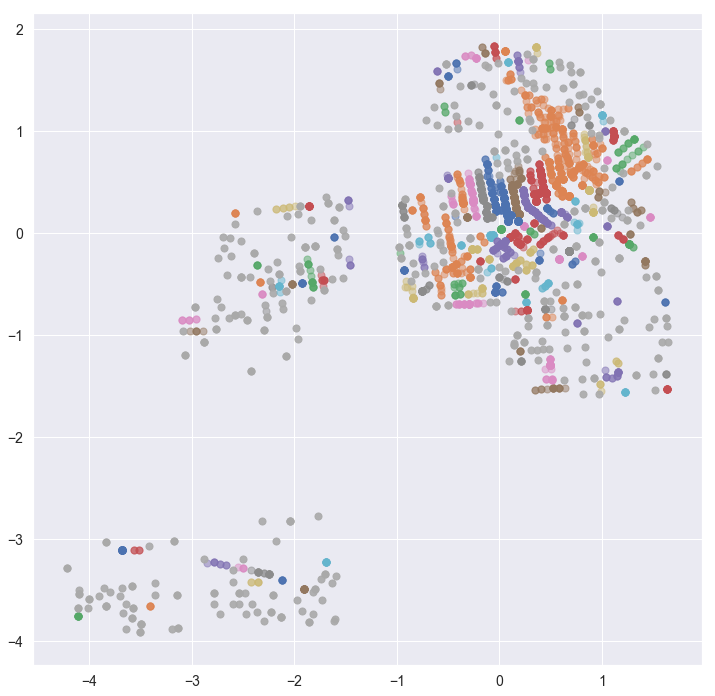

In [240]:
# Plot the points with colors
plt.figure(figsize=(12, 12))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)

    # Plot the datapoints that are clustered
    xy = X_scaled[class_member_mask & core_samples_mask]
    plt.scatter(xy[:, 1], xy[:, 0],s=50,  cmap='nipy_spectral', marker=u'o', alpha=0.5)

    # Plot the outliers
    xy = X_scaled[class_member_mask & ~core_samples_mask]
    plt.scatter(xy[:, 1], xy[:, 0],s=50,  c='darkgrey', marker=u'o', alpha=0.9)
print('epsilon is: {} , min_clust_size is: {}'.format(round(epsilon,2),round(minimumSamples)))
print('DarkGrey points are Outliers/Noise.')

## The K-Means neighbourhood determination based on geo-location only

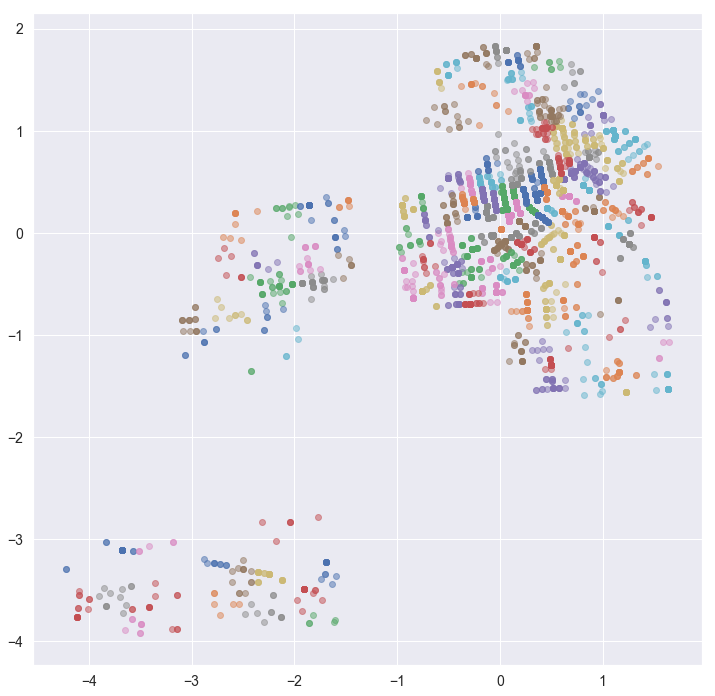

In [241]:
# from sklearn.cluster import KMeans 
k = 151
k_means3 = KMeans(init = "k-means++", n_clusters = k, n_init = 12)
k_means3.fit(X_scaled)
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1)
for k, col in zip(range(k), colors):
    my_members = (k_means3.labels_ == k)
    plt.scatter(X_scaled[my_members, 1], X_scaled[my_members, 0], norm=k+1, cmap='nipy_spectral', marker=u'o', alpha=0.5)
plt.show()

#### K-Means results are already discussed above
- The clusters look visually a bit different from the DBSCAN methods,  
  with the K-Means typical circle-shapes, that this algorithm produces.

# Combining the incidents, clusters/class_member_masks and core_sample_masks
-

In [242]:
dfdbscan.head()

,Latitude,Longitude
0,37.714273,-122.467094
1,37.726950,-122.476039
2,37.717531,-122.481543
4,37.715011,-122.472991
6,37.717507,-122.474383


In [243]:
def combine_incidents_and_categories(df, df_incident_selection):
    df = df.join(df_incident_selection[['Incident Category','Incident Subcategory']])
    return df

def add_cluster_labels(df, cluster_labels):
    df['cluster_labels'] = cluster_labels.tolist()
    return df

In [244]:
dbscan_result = combine_incidents_and_categories(dfdbscan, df1_daytime)
dbscan_result = add_cluster_labels(dbscan_result, labels)
# add core sample mask
dbscan_result['core_samples'] = core_samples_mask.tolist()
dbscan_result.tail(4)

,Latitude,Longitude,Incident Category,Incident Subcategory,cluster_labels,core_samples
7820,37.752836,-122.387756,Assault,Aggravated Assault,143,True
7822,37.752852,-122.408189,Robbery,Robbery - Other,145,True
7823,37.755621,-122.395763,Robbery,Robbery - Other,144,True
7824,37.755621,-122.395763,Assault,Aggravated Assault,144,True


In [245]:
not_noise_outlier_count = dbscan_result.core_samples.loc[(dbscan_result.core_samples == False) & (dbscan_result.cluster_labels != -1)].count()
print('not_noise_outlier_count is : {}'.format(not_noise_outlier_count))

not_noise_outlier_count is : 55


In [246]:
n_noise_ = list(labels).count(-1)
print('noise-labeled-incident-count is : {}'.format(n_noise_))

noise-labeled-incident-count is : 359


## Sorting within the clusters on the top4 most occuring incidents, for naming purposes.

In [247]:
def sort_top4(df):
    gb_size = df.groupby(['cluster_labels','Incident Subcategory']).size().to_frame('counts')
    res = gb_size['counts'].groupby(level=0, group_keys=False)
    df_top4 = res.nlargest(4).reset_index()
    return df_top4

In [248]:
dbscan_top4 = sort_top4(dbscan_result)
dbscan_top4.head(6)

,cluster_labels,Incident Subcategory,counts
0,-1,Simple Assault,181
1,-1,Aggravated Assault,73
2,-1,Robbery - Other,26
3,-1,Weapons Offense,21
4,0,Simple Assault,16
5,0,Robbery - Commercial,7


## Naming the clusters, automated.
- with total-counts for density impressions.

In [249]:
def auto_naming_clusters(df, df_top4):
    df_names = pd.DataFrame(columns=['cluster_labels','cluster_name'])
    for i, cluster in enumerate(df_top4.cluster_labels.unique()):
        names = ''
        for subcat in df_top4['Incident Subcategory'].loc[df_top4.cluster_labels == cluster]:
            names = names + subcat + ', '
        df_names.loc[i] = [cluster, names]
    gb_total = df.groupby(['cluster_labels']).size().to_frame('totals').reset_index()
    df_names['totals'] = gb_total.totals
    return df_names

In [250]:
dfnames = auto_naming_clusters(dbscan_result, dbscan_top4)
dfnames.head(2)

,cluster_labels,cluster_name,totals
0,-1,"Simple Assault, Aggravated Assault, Robbery - ...",359
1,0,"Simple Assault, Robbery - Commercial, Aggravat...",29


# Creating Polygons from cluster points, for plotting areas in Folium map

In [251]:
# import geopandas as gpd
# from shapely.geometry import Polygon

In [252]:
def build_polygon_lists(df, df_names):
    dftemp = pd.DataFrame(columns=['lats','lngs'])
    for i, cluster in enumerate(df_names.cluster_labels.unique()):
        lats = []
        lngs = []
        df_coord = df[['Latitude','Longitude']].loc[df.cluster_labels == cluster].drop_duplicates()
        for lat in df_coord.Latitude:
            lats = lats + [lat]
        for lng in df_coord.Longitude:
            lngs = lngs + [lng]
        dftemp.loc[i] = [lats, lngs]
    dftemp.reset_index(inplace=True, drop=True)
    df_names.cluster_labels = pd.to_numeric(df_names.cluster_labels)
    df_names = df_names.join(dftemp)
    return df_names

In [253]:
dfnames = build_polygon_lists(dbscan_result, dfnames)
dfnames.head(4)

,cluster_labels,cluster_name,totals,lats,lngs
0,-1,"Simple Assault, Aggravated Assault, Robbery - ...",359,"[37.71427318720753, 37.71753059977352, 37.7150...","[-122.46709432152416, -122.48154283574766, -12..."
1,0,"Simple Assault, Robbery - Commercial, Aggravat...",29,[37.72694991292525],[-122.47603947349434]
2,1,"Simple Assault,",4,[37.7178761514803],[-122.4716321803948]
3,2,"Prostitution, Aggravated Assault,",8,[37.71624646103806],[-122.4832748938805]


## Create _Concave-Hull Polygons_ from lat long lists.
#### Informative Sources:  
- https://gis.stackexchange.com/questions/294206/create-a-polygon-from-coordinates-in-geopandas-with-python
- http://blog.thehumangeo.com/2014/05/12/drawing-boundaries-in-python/
- https://towardsdatascience.com/the-concave-hull-c649795c0f0f
- https://github.com/sebastianbeyer/concavehull _(not_used)_
- https://gist.github.com/hellpanderrr/2c08af0f07eed4782234 _(possible alternative)_  

#### Main implemented package 
- https://github.com/Geodan/concave-hull
- has _Flann_ dependency, that is available in the MacOs Ports Package. _(no source compile needed)_
- conveniently installable pip-compatible sourcecode, clear manual.
- works great,
  - if you print polygon.geometry[0] with different values for _k_,  
    you can see the different concave-hull's produced by this algorithm (2007 paper)

In [254]:
# installing Flann via sudo port install flann
# https://github.com/mariusmuja/flann
# installing concave-hull with Flann dependency via pip, from source
# https://github.com/Geodan/concave-hull
# import concave-hull
# import concave_hull

In [255]:
def createPolygon(points_list, k=3, concave=False):
    # use concave_hull python-plugin
    if concave==True:
        hull = concave_hull.compute(points_list, k)
    else:
        hull = points_list
#     polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
    polygon_geom = Polygon(hull)
    crs = {'init': 'epsg:4326'}    
    polygon = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])       
#     print(polygon.geometry)
    return polygon

In [256]:
def createPolygon2(lon_point_list,lat_point_list):
    polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
    crs = {'init': 'epsg:4326'}    
    polygon = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])       
#     print(polygon.geometry)
    return polygon

In [257]:
def style_function_pre(feature):
    return {
        'fillOpacity': 0.4,
        'weight': 4.0,
        'color': 'red',
        'fillColor': 'yellow'
    }
def create_crime_venue_neighbourhood_map(df_names, clustering_type, concave_k, concave=True ):
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='stamentoner')
    folium.TileLayer('openstreetmap',attr='My Data Attribution').add_to(map_clusters)
    folium.TileLayer('stamenterrain').add_to(map_clusters)
    colour_list = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', 
              '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
              '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
              '#000075', '#808080', '#ffffff', '#000000']
    crime_group = folium.map.FeatureGroup(name='Crime Clusters', overlay=True, control=True, show=True)
    for latz, longs, cluster, name, count in zip(df_names.lats, df_names.lngs, df_names.cluster_labels, df_names.cluster_name, df_names.totals):
        label = '<h5>'+ clustering_type +' cluster : '+ str(cluster) + '</h5><h4> Count in cluster : ' + str(count) +'</h4></h6>' + name + '</h6>'
        if len(latz) <= 2:
            lat = np.mean(latz)
            lng = np.mean(longs)
            folium.CircleMarker([lat,lng],radius=10,popup=label,color='red',fill=True,fill_color='yellow',fill_opacity=0.9).add_to(crime_group)
        elif (cluster >= 0 ):
            new_list = [(a, b) for a, b in zip(longs, latz)]
            polygon = createPolygon(new_list, 3, concave=True)
            geojson = folium.GeoJson(polygon, style_function=style_function_pre)
            popup = folium.Popup(label)
            popup.add_to(geojson)
            geojson.add_to(crime_group)
    crime_group.add_to(map_clusters)    
    uni_group = folium.map.FeatureGroup(name='Universities', overlay=True, control=True, show=True)
    for uniloc in df_uni_merged2.uni_loc.unique():
        # uniloc is per uniloc iteration, create subsets:
        df_uni_merged_sub = df_uni_merged2.loc[df_uni_merged2['uni_loc'] == uniloc].copy()
        # Get uni_loc name for FeatureGroup switchable Layers
        uni_name = df_uni_merged_sub.name.iloc[0]
        # Create a subgroup for each uni_loc, that will be added to the main map_clusters-folium map.
        uni_sub_group = folium.FeatureGroup(name=uni_name, overlay=True, control=True, show=True)
        for lat, lon, poi, size, cluster in zip(df_uni_merged_sub.latitude, 
                                          df_uni_merged_sub.longitude, 
                                          df_uni_merged_sub.name, 
                                          df_uni_merged_sub.counts,
                                          df_uni_merged_sub['Cluster Labels']):
            labelstr = '<h4>'+poi + '</h4> <h6>Cluster : ' + str(cluster) +' size : '+str(size)\
                        +'</h6><i>'+ str(venue_cluster_names.cluster_name.iloc[cluster])+'</i>'
            label = folium.Popup(labelstr) 
            folium.CircleMarker(
                [lat, lon],
                radius=10,
                popup=label,
                color=colour_list[cluster-1],
                fill=True,
                fill_color=colour_list[cluster-1],
                fill_opacity=0.9).add_to(uni_sub_group)
        # Add University marker for Analysis Neighbourhood main center.
        unilat = df_uni.latitude.iloc[uniloc]
        unilng = df_uni.longitude.iloc[uniloc]
        folium.Marker([
            unilat, unilng], 
            popup='<h4>'+uni_name+'</h4>',
            icon=folium.Icon(prefix='fa',icon='university',color='green')
        ).add_to(uni_sub_group)    
        uni_sub_group.add_to(map_clusters)    
    # Add Folium LayerControl for semi-auto layer-assignment with human-readable-names.
    folium.LayerControl().add_to(map_clusters)
    folium.Map.keep_in_front(uni_sub_group)
    # Display map
#     map_clusters
    return map_clusters

In [258]:
map_clusters = create_crime_venue_neighbourhood_map(dfnames, 'DBSCAN', 3, concave=True)
map_clusters

# After implementing concave-hull geojson cluster-shapes found by DBSCAN
You can notice the peculiarities of the DBSCAN algoritm more clearly.
- Some streets are seperate clusters,  
- 400 plus incidents are considered _outliers_ and _noise_,
  - a few homocides are among those, and this category has already a low total count.
- Irregular shaped clusters for clusters with 2+ geographical points,
- Clusters with less than 2 geo-points are depicted with red-_outline_ and yellow-_filled_ circles.
- All clusters consist of a minimum of 4 incidents.
- All clusters are programatically named based on the 4 most occuring _Incident Subcategories_,  
  when clusters contain less than 4 Subcategories, only those are displayed.
  
# This DBSCAN method has the advantage of more fine-grained clusters,
- that provide more insight in problematic high-crime area's,
- provide counts and cluster typification per cluster,
- provide more insight in relation to venue-clusters with those smaller-oddly shaped clusters

## Disadvantages of DBSCAN clustering of Crime Incidents
- Some crimes are not counted or visible anymore,  
  - information is lost about potentially serious events,  
    with low concentration and frequency.